# Sentiment Scoring - Data Load

In [1]:
import pandas as pd
import numpy as np
from tqdm import tqdm
from transformers import AutoTokenizer, AutoModelForSequenceClassification, BertTokenizer, BertModel
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
import scipy
import torch

# Provide the path to your file in Google Drive
file_path = "Sentiment Brazil Score/combined_brazil_news_filtered_econ.csv"  # Replace with your actual file path
stopword_file = 'Sentiment Brazil Score/stopwords.txt'
lm_dict_file = "Sentiment Brazil Score/Loughran-McDonald_MasterDictionary_1993-2023.csv"

c:\Users\gigan\AppData\Local\Programs\Python\Python313\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# Dictionary Sentiment Scoring (DSS)

In [2]:
df = pd.read_csv(file_path)
# Load Loughran-McDonald Dictionary
lm_dict = pd.read_csv(lm_dict_file)

# Load Stopwords
def load_stopwords(stopword_file):
    with open(stopword_file, "r") as f:
        stopwords = f.read().splitlines()  # Reads all lines and removes newline characters
    return stopwords

stopwords = load_stopwords(stopword_file)

# Ensure the Content and Title columns are strings and handle NaN
df["Content_clean"] = df["Content"].fillna("").astype(str)
df["Title_clean"] = df["Title"].fillna("").astype(str)

# Select only relevant columns and create a copy to avoid SettingWithCopyWarning
lm_dict = lm_dict[["Word", "Positive", "Negative"]].copy()

# Fill NaN values in the 'Positive' and 'Negative' columns with 0 and ensure they are integers
lm_dict["Positive"] = lm_dict["Positive"].fillna(0).astype(int)
lm_dict["Negative"] = lm_dict["Negative"].fillna(0).astype(int)

# Preprocess Text
def preprocess_text(text, stopwords):
    words = text.split()
    words = [w.lower() for w in words if w.lower() not in stopwords and w.isalpha()]
    return " ".join(words)

df["Content_clean"] = df["Content"].apply(lambda x: preprocess_text(str(x), stopwords))
df["Title_clean"] = df["Title"].apply(lambda x: preprocess_text(str(x), stopwords))


# Dictionary Sentiment Analysis
def dictionary_sentiment_analysis(df, lm_dict, column):
    pos_words = lm_dict[lm_dict["Positive"] != 0]["Word"].str.lower().to_list()
    neg_words = lm_dict[lm_dict["Negative"] != 0]["Word"].str.lower().to_list()
    col_clean = f"{column}_clean"
    score_col = f"{column}_DSS"
    df[score_col] = df[col_clean].apply(lambda x: (sum(1 for w in x.split() if w in pos_words) -
                                                   sum(1 for w in x.split() if w in neg_words)) /
                                        len(x.split()) if len(x.split()) > 0 else 0)
    return df

df = dictionary_sentiment_analysis(df, lm_dict, "Content")
df = dictionary_sentiment_analysis(df, lm_dict, "Title")

# Cosine Similarity Sentiment Scoring (CSSS)

In [3]:
# Load BERT tokenizer and model (using FinBERT for financial sentiment analysis)
tokenizer = BertTokenizer.from_pretrained("yiyanghkust/finbert-tone")
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = BertModel.from_pretrained("yiyanghkust/finbert-tone").to(device)

themes = {
    "Economic Stability": {
        "positive": [
            "GDP growth exceeds expectations", "fiscal surplus improves", "current account surplus widens",
            "short-term fiscal improvement", "services sector drives growth", "strong economic indicators",
            "fiscal situation stabilizes", "trade balance supports currency", "positive current account balance",
            "BRL strengthens on growth data", "Brazil's economy bounces back to pre-pandemic levels",
            "agricultural exports fuel economic growth", "economic growth outlook improves", "tax revenue outperforms",
            "formal employment rises", "industrial output recovers", "second-quarter growth boosts confidence",
            "broad-based economic recovery", "strong public sector performance", "growth fueled by industry",
            "expanding retail sector supports stability", "improved productivity boosts GDP", "export recovery strengthens BRL",
            "growing demand from trade partners", "economic recovery reassures investors"
        ],
        "negative": [
            "current account deficit rises", "fiscal chaos looms", "economic growth forecasts cut",
            "polarized elections create uncertainty", "long-term fiscal risks emerge", "economic slowdown indicated",
            "services sector faces challenges", "fiscal deficit widens", "economic indicators show weakness",
            "industrial output slides on imports and currency effects", "foreign trade surplus narrows",
            "fiscal worries to persist", "economists concerned about complacency", "high inflation erodes growth prospects",
            "market reacts negatively to fiscal news", "persistent stagnation in key sectors", "public spending strains fiscal health",
            "economic headwinds weigh on currency", "investor sentiment dampened by weak performance", "widening trade deficit"
        ]
    },
    "Monetary Policy": {
        "positive": [
            "central bank raises SELIC rate", "hawkish policy boosts BRL", "rate hikes to curb inflation",
            "frontloading rate increases", "commitment to inflation control", "high rates attract foreign investment",
            "monetary tightening strengthens currency", "Brazil raises SELIC rate to 9.0%",
            "interest rate hikes signal economic stability", "central bank commitment reassures investors",
            "policy measures stabilize inflation outlook", "central bank remains data-driven",
            "rate hike aligns with market expectations", "Brazil commits to long-term inflation goals",
            "proactive policy reassures foreign investors", "confidence in monetary discipline",
            "central bank independence bolsters credibility"
        ],
        "negative": [
            "central bank cuts SELIC rate", "dovish policy weakens currency", "easing cycle continues",
            "rate cuts despite inflation concerns", "monetary policy uncertainty impacts BRL",
            "hawkish signals fail to reassure markets", "currency weakens despite high rates",
            "rate cuts expected despite fiscal challenges", "monetary easing triggers inflation risks",
            "policy signals slower tightening", "central bank credibility questioned", "inflationary pressures erode confidence",
            "lack of forward guidance from central bank", "unexpected rate pause raises concerns"
        ]
    },
    "Inflation Dynamics": {
        "positive": [
            "inflation cools, supporting BRL", "effective monetary policy curbs inflation",
            "price stability reassures markets", "inflation expectations improve", "fuel price decreases ease inflation concerns",
            "policy measures contain inflationary pressures", "central bank actions align with inflation targets",
            "cost stabilization supports BRL", "lower food prices improve inflation outlook",
            "favorable trade terms reduce inflation pressures", "energy cost declines support lower inflation"
        ],
        "negative": [
            "inflation expectations rise", "inflation remains sticky", "electricity rate hikes push inflation higher",
            "surprise inflation surge", "rising inflation dampens BRL", "global inflationary pressures impact BRL",
            "accelerating inflation signals rate hikes", "consumer price index shows sustained increases",
            "inflationary risks persist amid weak growth", "cost-push inflation hampers monetary policy",
            "unexpected price shocks exacerbate inflation fears", "upward trend in housing costs affects CPI"
        ]
    },
    "Market Performance": {
        "positive": [
            "BRL strengthens on easing pause", "foreign investment boosts market", "domestic markets outperform",
            "market indicators remain strong", "commodities boost trade surplus", "agriculture exports support currency",
            "investment funds approach record highs", "growing liquidity attracts investors",
            "positive sentiment drives currency appreciation", "strong equity performance supports BRL"
        ],
        "negative": [
            "BRL weakens despite GDP growth", "currency devaluation fears rise", "foreign outflows weigh on BRL",
            "bond yields rise amid market uncertainty", "volatility increases in FX markets",
            "debt yields gain on inflation concerns", "sharp depreciation erodes confidence",
            "market turbulence impacts BRL", "capital flight reduces currency strength",
            "weaker fiscal conditions hurt bond markets"
        ]
    },
    "Political Developments": {
        "positive": [
            "strong institutions reassure markets", "commitment to policy reforms", "government stability supports BRL",
            "election outcomes stabilize outlook", "trade agreements bolster currency", "fiscal discipline signals stability",
            "political consensus on economic priorities", "leadership promotes investment",
            "pro-business policies attract foreign capital", "diplomatic engagements strengthen trade ties"
        ],
        "negative": [
            "political influence feared at central bank", "elections increase uncertainty", "leadership crisis affects confidence",
            "policy deadlock weakens BRL", "polarized elections undermine investor confidence",
            "corruption concerns rise", "geopolitical tensions weigh on currency",
            "fiscal irresponsibility sparks investor concerns", "populist measures hinder reform prospects",
            "political missteps dampen market sentiment"
        ]
    },
    "Energy and Commodities": {
        "positive": [
            "commodity prices rebound", "oil exports boost trade balance", "resource-driven growth supports BRL",
            "renewable energy initiatives attract investment", "strong global demand for commodities",
            "agriculture-driven exports strengthen BRL", "higher commodity prices bolster fiscal revenues",
            "stable oil prices enhance currency strength", "Brazil benefits from commodity supercycle",
            "exports increase due to rising global demand"
        ],
        "negative": [
            "commodity price slump weakens BRL", "oil price volatility impacts trade", "mining delays hurt exports",
            "rising fuel prices push inflation higher", "energy sector challenges persist", "declining commodity demand affects revenues",
            "oil output disruptions weaken fiscal outlook", "lower global demand pressures exports",
            "commodity dependency increases economic risk", "volatility in global markets affects BRL"
        ]
    }
}

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

theme_embeddings = []
theme_labels = []

for category, sentiments in themes.items():
    for sentiment, phrases in sentiments.items():
        for phrase in phrases:
            if not phrase.strip():  # Skip empty phrases
                continue
            try:
                # Tokenize and move input to the same device as the model
                inputs = tokenizer(phrase, return_tensors="pt", truncation=True, padding=True, max_length=512).to(device)
                with torch.no_grad():
                    outputs = model(**inputs)
                    # Ensure the outputs are computed on the same device
                    embedding = torch.mean(outputs.last_hidden_state, dim=1).squeeze().cpu().numpy()
                theme_embeddings.append(embedding)
                theme_labels.append(f"{category}_{sentiment}")
            except Exception as e:
                print(f"Error processing phrase: {phrase}. Error: {e}")

if theme_embeddings:
    theme_embeddings = np.array(theme_embeddings)
else:
    raise ValueError("No valid embeddings could be computed.")

# Function to compute cosine similarity
def compute_cosine_similarity(embedding, target_embeddings):
    similarity_scores = cosine_similarity(embedding.reshape(1, -1), target_embeddings)
    return similarity_scores.flatten()

# Generate embeddings for each news article and compute sentiment
def apply_cosine_similarity(df, column):
    tqdm.pandas(desc="Processing Cosine Similarity")

    def process_row(text):
        if pd.isnull(text) or not isinstance(text, str):
            return pd.Series([None, 0, 0, 0, ""])

        inputs = tokenizer(text, return_tensors="pt", truncation=True, padding=True, max_length=512).to(device)
        with torch.no_grad():
            outputs = model(**inputs)
            embedding = torch.mean(outputs.last_hidden_state, dim=1).squeeze().cpu().numpy()

        similarity_scores = compute_cosine_similarity(embedding, theme_embeddings)

        # Get most similar theme
        most_similar_index = np.argmax(similarity_scores)
        most_similar_theme = theme_labels[most_similar_index]

        # Compute positive and negative scores
        positive_score = np.mean(similarity_scores[np.array(["positive" in label for label in theme_labels])])
        negative_score = np.mean(similarity_scores[np.array(["negative" in label for label in theme_labels])])

        # Calculate sentiment balance (positive - negative)
        sentiment_balance = positive_score - negative_score

        return pd.Series([most_similar_theme, sentiment_balance, positive_score, negative_score])

    result_columns = [f"{column}_Theme", f"{column}_CSSS", f"{column}_Positive", f"{column}_Negative"]
    df[result_columns] = df[column].progress_apply(process_row)
    return df

df = apply_cosine_similarity(df, "Content")
df = apply_cosine_similarity(df, "Title")

Processing Cosine Similarity:   1%|          | 90/10590 [00:38<1:31:13,  1.92it/s]c:\Users\gigan\AppData\Local\Programs\Python\Python313\Lib\site-packages\huggingface_hub\file_download.py:140: UserWarning: `huggingface_hub` cache-system uses symlinks by default to efficiently store duplicated files but your machine does not support them in C:\Users\gigan\.cache\huggingface\hub\models--yiyanghkust--finbert-tone. Caching files will still work but in a degraded version that might require more space on your disk. This warning can be disabled by setting the `HF_HUB_DISABLE_SYMLINKS_WARNING` environment variable. For more details, see https://huggingface.co/docs/huggingface_hub/how-to-cache#limitations.
To support symlinks on Windows, you either need to activate Developer Mode or to run Python as an administrator. In order to activate developer mode, see this article: https://docs.microsoft.com/en-us/windows/apps/get-started/enable-your-device-for-development
  warnings.warn(message)
Process

In [4]:
df.head(5)

,Title,Date_Metadata,Date_End,Document_Number,Content,Content_clean,Title_clean,Content_DSS,Title_DSS,Content_Theme,Content_CSSS,Content_Positive,Content_Negative,Title_Theme,Title_CSSS,Title_Positive,Title_Negative
0,\ \ \ **Inflation Expectations Are Headwind fo...,23 September 2024,23 September 2024,DJDN000020240925ek9p000qd,- Brazil\'s central bank faces headwinds to co...,central bank faces headwinds cool last bcb rai...,expectations headwind central bank market,-0.042553,0.000000,Monetary Policy_positive,-0.066530,0.344037,0.410567,Market Performance_negative,-0.168860,0.288112,0.456973
1,\ \ \ **\*Brazil Central Bank Raises SELIC Rat...,18 September 2024,18 September 2024,DJDN000020240923ek9n001rt,\ 18 Sep 2024 17:46 ET \*Brazil Central Bank: ...,sep et central future rate decisions will depe...,central bank raises selic rate,-0.012346,0.000000,Monetary Policy_positive,-0.054134,0.317749,0.371883,Monetary Policy_positive,-0.030269,0.296449,0.326718
2,\ \ \ **Brazil\'s Central Bank Resumes Hiking ...,18 September 2024,18 September 2024,DJDN000020240918ek9i002ze,\ Brazil\'s central bank raised interest rates...,central bank raised interest rates first time ...,central bank resumes hiking inflation remains ...,-0.039370,0.000000,Monetary Policy_positive,-0.082480,0.311721,0.394202,Monetary Policy_positive,-0.083272,0.328191,0.411463
3,\ \ \ Central Banks\ WSJ Pro\ **Brazil\'s Cent...,18 September 2024,18 September 2024,DJDN000020240918ek9i0033h,\ Brazil\'s central bank raised interest rates...,central bank raised interest rates first time ...,central wsj central bank resumes hiking inflat...,-0.032164,-0.052632,Monetary Policy_positive,-0.085323,0.318233,0.403556,Political Developments_negative,-0.186862,0.337839,0.524701
4,\ \ \ **Brazil\'s Central Bank Resumes Hiking ...,18 September 2024,18 September 2024,RSTPROCB20240918ek9i0008d,\ Brazil\'s central bank raised interest rates...,central bank raised interest rates first time ...,central bank resumes hiking inflation remains ...,-0.015873,0.000000,Monetary Policy_negative,-0.147938,0.307077,0.455015,Monetary Policy_positive,-0.099036,0.318533,0.417569


# Finbert Sentiment Scoring (FSS)

In [10]:
pip show torch

Name: torch
Version: 2.6.0+cu118
Summary: Tensors and Dynamic neural networks in Python with strong GPU acceleration
Home-page: https://pytorch.org/
Author: PyTorch Team
Author-email: packages@pytorch.org
License: BSD-3-Clause
Location: c:\Users\gigan\AppData\Local\Programs\Python\Python313\Lib\site-packages
Requires: filelock, fsspec, jinja2, networkx, setuptools, sympy, typing-extensions
Required-by: torchaudio, torchvision
Note: you may need to restart the kernel to use updated packages.


In [11]:
def finbert_sentiment_analysis(df, column):
    tokenizer = AutoTokenizer.from_pretrained("ProsusAI/finbert")

    # Set device dynamically (GPU if available, otherwise CPU)
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    model = AutoModelForSequenceClassification.from_pretrained("ProsusAI/finbert").to(device)
    col_clean = f"{column}_clean"
    score_col = f"{column}_FSS"

    def finbert_sentiment(text):
        inputs = tokenizer(text, return_tensors="pt", padding=True, truncation=True, max_length=512)
        inputs = {key: value.to(device) for key, value in inputs.items()}  # Move to correct device
        with torch.no_grad():  # Disable gradient tracking for faster inference
            outputs = model(**inputs)
        logits = outputs.logits.detach().cpu().numpy().squeeze()
        scores = {k: v for k, v in zip(model.config.id2label.values(), scipy.special.softmax(logits))}
        return scores["positive"] - scores["negative"]

    tqdm.pandas(desc=f"FinBERT Sentiment for {column}")
    df[score_col] = df[col_clean].progress_apply(finbert_sentiment)
    return df

df = finbert_sentiment_analysis(df, "Content")
df = finbert_sentiment_analysis(df, "Title")


FinBERT Sentiment for Title: 100%|██████████| 10590/10590 [14:15<00:00, 12.38it/s]


In [12]:
# Determine Ultimate Sentiment Scores
def ultimate_sentiment_scores(row, content_col, title_col, threshold=500):
    if len(row["Content"]) < threshold:
        return row[title_col]
    return row[content_col]

df["DSS"] = df.apply(lambda x: ultimate_sentiment_scores(x, "Content_DSS", "Title_DSS"), axis=1)
df["FSS"] = df.apply(lambda x: ultimate_sentiment_scores(x, "Content_FSS", "Title_FSS"), axis=1)
df["CSSS"] = df.apply(lambda x: ultimate_sentiment_scores(x, "Content_CSSS", "Title_CSSS"), axis=1)

# Display Results
df.head()

,Title,Date_Metadata,Date_End,Document_Number,Content,Content_clean,Title_clean,Content_DSS,Title_DSS,Content_Theme,...,Content_Negative,Title_Theme,Title_CSSS,Title_Positive,Title_Negative,Content_FSS,Title_FSS,DSS,FSS,CSSS
0,\ \ \ **Inflation Expectations Are Headwind fo...,23 September 2024,23 September 2024,DJDN000020240925ek9p000qd,- Brazil\'s central bank faces headwinds to co...,central bank faces headwinds cool last bcb rai...,expectations headwind central bank market,-0.042553,0.000000,Monetary Policy_positive,...,0.410567,Market Performance_negative,-0.168860,0.288112,0.456973,-0.064869,-0.852344,-0.042553,-0.064869,-0.066530
1,\ \ \ **\*Brazil Central Bank Raises SELIC Rat...,18 September 2024,18 September 2024,DJDN000020240923ek9n001rt,\ 18 Sep 2024 17:46 ET \*Brazil Central Bank: ...,sep et central future rate decisions will depe...,central bank raises selic rate,-0.012346,0.000000,Monetary Policy_positive,...,0.371883,Monetary Policy_positive,-0.030269,0.296449,0.326718,0.102778,0.059389,-0.012346,0.102778,-0.054134
2,\ \ \ **Brazil\'s Central Bank Resumes Hiking ...,18 September 2024,18 September 2024,DJDN000020240918ek9i002ze,\ Brazil\'s central bank raised interest rates...,central bank raised interest rates first time ...,central bank resumes hiking inflation remains ...,-0.039370,0.000000,Monetary Policy_positive,...,0.394202,Monetary Policy_positive,-0.083272,0.328191,0.411463,-0.084270,-0.117777,-0.039370,-0.084270,-0.082480
3,\ \ \ Central Banks\ WSJ Pro\ **Brazil\'s Cent...,18 September 2024,18 September 2024,DJDN000020240918ek9i0033h,\ Brazil\'s central bank raised interest rates...,central bank raised interest rates first time ...,central wsj central bank resumes hiking inflat...,-0.032164,-0.052632,Monetary Policy_positive,...,0.403556,Political Developments_negative,-0.186862,0.337839,0.524701,-0.102931,-0.619959,-0.032164,-0.102931,-0.085323
4,\ \ \ **Brazil\'s Central Bank Resumes Hiking ...,18 September 2024,18 September 2024,RSTPROCB20240918ek9i0008d,\ Brazil\'s central bank raised interest rates...,central bank raised interest rates first time ...,central bank resumes hiking inflation remains ...,-0.015873,0.000000,Monetary Policy_negative,...,0.455015,Monetary Policy_positive,-0.099036,0.318533,0.417569,0.230422,-0.323485,-0.015873,0.230422,-0.147938


In [ ]:
# Convert both Date_Metadata and Date_End to datetime format
df["Date_Metadata"] = pd.to_datetime(df["Date_Metadata"], format="%d %B %Y", errors="coerce")
df["Date_End"] = pd.to_datetime(df["Date_End"], format="%d %B %Y", errors="coerce")

df.isna().sum()

,0
Title,0
Date_Metadata,22
Date_End,177
Document_Number,284
Content,0
Content_clean,0
Title_clean,0
Content_DSS,0
Title_DSS,0
Content_Theme,0


In [ ]:
df.notna().sum()

,0
Title,10590
Date_Metadata,10568
Date_End,10413
Document_Number,10306
Content,10590
Content_clean,10590
Title_clean,10590
Content_DSS,10590
Title_DSS,10590
Content_Theme,10590


In [33]:
# Check the resulting DataFrame
# Fill missing dates with forward-fill and then backward-fill as fallback
# Prioritize Date_Metadata, substitute with Date_End when Date_Metadata is missing
df["Date"] = df["Date_Metadata"].combine_first(df["Date_End"])
df["Date"] = df["Date"].fillna(method="ffill").fillna(method="bfill")

missing_values = df.isnull().sum()
print("Missing Values in Each Column:")
print(missing_values)

Missing Values in Each Column:
Title                 0
Date_Metadata         1
Date_End            156
Document_Number     284
Content               0
Content_clean         0
Title_clean           0
Content_DSS           0
Title_DSS             0
Content_Theme         0
Content_CSSS          0
Content_Positive      0
Content_Negative      0
Title_Theme           0
Title_CSSS            0
Title_Positive        0
Title_Negative        0
Content_FSS           0
Title_FSS             0
DSS                   0
FSS                   0
CSSS                  0
Date                  0
dtype: int64


C:\Users\gigan\AppData\Local\Temp\ipykernel_20100\1634235961.py:5: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df["Date"] = df["Date"].fillna(method="ffill").fillna(method="bfill")


In [34]:
df.isna().sum()

Title                 0
Date_Metadata         1
Date_End            156
Document_Number     284
Content               0
Content_clean         0
Title_clean           0
Content_DSS           0
Title_DSS             0
Content_Theme         0
Content_CSSS          0
Content_Positive      0
Content_Negative      0
Title_Theme           0
Title_CSSS            0
Title_Positive        0
Title_Negative        0
Content_FSS           0
Title_FSS             0
DSS                   0
FSS                   0
CSSS                  0
Date                  0
dtype: int64

In [35]:
# Ensure all sentiment columns are numeric
sentiment_columns = ["DSS", "FSS", "CSSS"]
for col in sentiment_columns:
    df[col] = pd.to_numeric(df[col], errors="coerce")

In [36]:
# Ensure Date is in datetime format
df["Date"] = pd.to_datetime(df["Date"], errors="coerce")

# Extract Year and Quarter information
df["Year"] = df["Date"].dt.year
df["Quarter"] = df["Date"].dt.to_period("Q")

# Select only the sentiment score columns and ticker
sentiment_columns = ["Title_DSS", "Title_FSS", "Title_CSSS", "Content_DSS", "Content_FSS", "Content_CSSS", "DSS", "FSS", "CSSS"]  # Replace with actual sentiment column names
df_sentiments = df[["Date", "Year", "Quarter", "Content_Theme","Title_Theme"] + sentiment_columns]

df_sentiments.head()

,Date,Year,Quarter,Content_Theme,Title_Theme,Title_DSS,Title_FSS,Title_CSSS,Content_DSS,Content_FSS,Content_CSSS,DSS,FSS,CSSS
0,2024-09-23,2024.0,2024Q3,Monetary Policy_positive,Market Performance_negative,0.000000,-0.852344,-0.168860,-0.042553,-0.064869,-0.066530,-0.042553,-0.064869,-0.066530
1,2024-09-18,2024.0,2024Q3,Monetary Policy_positive,Monetary Policy_positive,0.000000,0.059389,-0.030269,-0.012346,0.102778,-0.054134,-0.012346,0.102778,-0.054134
2,2024-09-18,2024.0,2024Q3,Monetary Policy_positive,Monetary Policy_positive,0.000000,-0.117777,-0.083272,-0.039370,-0.084270,-0.082480,-0.039370,-0.084270,-0.082480
3,2024-09-18,2024.0,2024Q3,Monetary Policy_positive,Political Developments_negative,-0.052632,-0.619959,-0.186862,-0.032164,-0.102931,-0.085323,-0.032164,-0.102931,-0.085323
4,2024-09-18,2024.0,2024Q3,Monetary Policy_negative,Monetary Policy_positive,0.000000,-0.323485,-0.099036,-0.015873,0.230422,-0.147938,-0.015873,0.230422,-0.147938


In [37]:
# interim_file_path = "Sentiment Brazil Score/daily_Brazil_news_sentiments.csv"
# df_sentiments.to_csv(interim_file_path, index=False)

In [52]:
from statsmodels.tsa.holtwinters import ExponentialSmoothing
import pandas as pd
import numpy as np

# List of sentiment columns
sentiment_columns = [
    "Title_DSS", "Title_FSS", "Title_CSSS",
    "Content_DSS", "Content_FSS", "Content_CSSS",
    "DSS", "FSS", "CSSS"
]

# Convert "Date" to datetime and sort
df_sentiments = df_sentiments.copy()
df_sentiments["Date"] = pd.to_datetime(df_sentiments["Date"])
df_sentiments = df_sentiments.sort_values(by="Date")

# Function to calculate exponential smoothing for a single quarter
def calculate_exponential_smoothing(group, quarter):
    smoothed_scores = {}
    if len(group) < 2:  # Check if group has fewer than two rows
        for col in group.columns:
            smoothed_scores[col] = group[col].iloc[-1] if len(group) > 0 else np.nan
    else:
        for col in group.columns:
            if group[col].nunique() < 2:  # Skip constant groups
                smoothed_scores[col] = group[col].iloc[-1]
            else:
                # Exponential Smoothing Model
                model = ExponentialSmoothing(
                    group[col].reset_index(drop=True),
                    initialization_method="legacy-heuristic",
                    trend=None,
                    seasonal=None
                )
                fit = model.fit(smoothing_level=0.5, optimized=False)
                smoothed_scores[col] = fit.fittedvalues.iloc[-1]
    smoothed_scores["Quarter"] = quarter
    return pd.Series(smoothed_scores)

# Apply exponential smoothing within each quarter
quarterly_sentiments = (
    df_sentiments.groupby("Quarter", group_keys=False)
    .apply(lambda x: calculate_exponential_smoothing(
        x[sentiment_columns], x.name  # Process only sentiment columns
    ))
    .reset_index(drop=True)
)

# Fill missing sentiment scores with the previous quarter's sentiment score
for col in sentiment_columns:
    quarterly_sentiments[col] = (
        quarterly_sentiments[col].ffill().fillna(0)
    )

# View the resulting DataFrame
print(quarterly_sentiments.head())


   Title_DSS  Title_FSS  Title_CSSS  Content_DSS  Content_FSS  Content_CSSS  \
0  -0.048868  -0.710299   -0.062185    -0.026898    -0.019020     -0.072251   
1   0.034050   0.225357    0.018112    -0.005142    -0.094449     -0.026430   
2   0.003472   0.119816   -0.051107    -0.015590    -0.047422     -0.086503   
3  -0.147935  -0.637427   -0.072219    -0.030083    -0.307370     -0.060794   
4  -0.000486  -0.363311   -0.054479    -0.012534     0.154691      0.025461   

        DSS       FSS      CSSS Quarter  
0 -0.026898 -0.001111 -0.070308  2006Q1  
1 -0.005142 -0.094449 -0.026430  2006Q2  
2 -0.015590 -0.023564 -0.079521  2006Q3  
3 -0.030083 -0.294702 -0.057066  2006Q4  
4 -0.012534  0.154691  0.025461  2007Q1  


C:\Users\gigan\AppData\Local\Temp\ipykernel_20100\1363544203.py:43: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: calculate_exponential_smoothing(


In [39]:
# final_file_path = "Sentiment Brazil Score/quarterly_news_sentiments.csv"
# quarterly_sentiments.to_csv(final_file_path , index=False)

# Descriptive Analysis - Daily

In [53]:
import pandas as pd

daily_sentiments = pd.read_csv("Sentiment Brazil Score/daily_Brazil_news_sentiments.csv")

# Define the sentiment columns
sentiment_columns = [
    "Title_DSS", "Title_FSS", "Title_CSSS",
    "Content_DSS", "Content_FSS", "Content_CSSS",
    "DSS", "FSS", "CSSS"
]

# Sort by date to ensure correct calculations
daily_sentiments.sort_values(by='Date', inplace=True)

# Set the smoothing factor
smoothing_factor = 0.5

# Calculate exponential smoothed values
for col in sentiment_columns:
    daily_sentiments[f"{col}_ExpSmoothed"] = daily_sentiments[col].ewm(alpha=smoothing_factor).mean()

# Define moving average periods in days
moving_average_periods = {
    "3D": 3,
    "1W": 7,
    "2W": 14,
    "1M": 30,
    "3M": 90,
    "6M": 180
}

# Calculate moving averages
for period_label, period_days in moving_average_periods.items():
    for col in sentiment_columns:
        daily_sentiments[f"{col}_MA_{period_label}"] = daily_sentiments[col].rolling(window=period_days, min_periods=1).mean()

# Display a sample of the updated DataFrame
print(daily_sentiments.head())


            Date  Year Quarter                Content_Theme  \
3428  2006-01-02  2006  2006Q1  Economic Stability_negative   
3429  2006-01-05  2006  2006Q1     Monetary Policy_positive   
3430  2006-01-09  2006  2006Q1  Economic Stability_negative   
3431  2006-01-09  2006  2006Q1  Economic Stability_negative   
3432  2006-01-11  2006  2006Q1  Economic Stability_negative   

                          Title_Theme  Title_DSS  Title_FSS  Title_CSSS  \
3428  Political Developments_positive       -0.2  -0.690112   -0.166818   
3429      Economic Stability_positive        0.0   0.088721    0.008830   
3430         Monetary Policy_positive        0.0  -0.059169   -0.076523   
3431  Political Developments_negative        0.0  -0.935544   -0.160816   
3432         Monetary Policy_positive        0.0   0.050833   -0.031230   

      Content_DSS  Content_FSS  ...  CSSS_MA_3M  Title_DSS_MA_6M  \
3428    -0.005848    -0.791858  ...   -0.061613        -0.200000   
3429     0.000000     0.135889  ..

In [41]:
daily_sentiments.tail()

,Date,Year,Quarter,Content_Theme,Title_Theme,Title_DSS,Title_FSS,Title_CSSS,Content_DSS,Content_FSS,...,CSSS_MA_3M,Title_DSS_MA_6M,Title_FSS_MA_6M,Title_CSSS_MA_6M,Content_DSS_MA_6M,Content_FSS_MA_6M,Content_CSSS_MA_6M,DSS_MA_6M,FSS_MA_6M,CSSS_MA_6M
4,2024-09-18,2024,2024Q3,Monetary Policy_negative,Monetary Policy_positive,0.000000,-0.323484,-0.099036,-0.015873,0.230422,...,-0.053068,-0.036203,-0.173348,-0.050502,-0.021995,-0.013719,-0.041715,-0.023534,-0.017855,-0.039059
3,2024-09-18,2024,2024Q3,Monetary Policy_positive,Political Developments_negative,-0.052632,-0.619954,-0.186862,-0.032164,-0.102930,...,-0.053365,-0.037289,-0.179586,-0.052877,-0.022076,-0.017090,-0.041964,-0.023615,-0.021226,-0.039308
2,2024-09-18,2024,2024Q3,Monetary Policy_positive,Monetary Policy_positive,0.000000,-0.117776,-0.083272,-0.039370,-0.084269,...,-0.053898,-0.036672,-0.178757,-0.052742,-0.022163,-0.018896,-0.042069,-0.023701,-0.023033,-0.039413
1,2024-09-18,2024,2024Q3,Monetary Policy_positive,Monetary Policy_positive,0.000000,0.059389,-0.030268,-0.012346,0.102778,...,-0.054280,-0.036055,-0.176943,-0.052313,-0.021967,-0.021137,-0.041945,-0.023505,-0.025273,-0.039289
0,2024-09-23,2024,2024Q3,Monetary Policy_positive,Market Performance_negative,0.000000,-0.852344,-0.168860,-0.042553,-0.064868,...,-0.054166,-0.036055,-0.181792,-0.052163,-0.022270,-0.022003,-0.042072,-0.023808,-0.026139,-0.039415


Mean and Standard Deviation for Each Variable:
          Mean  Standard Deviation
DSS  -0.024247            0.032175
FSS  -0.096918            0.434080
CSSS -0.048605            0.085116


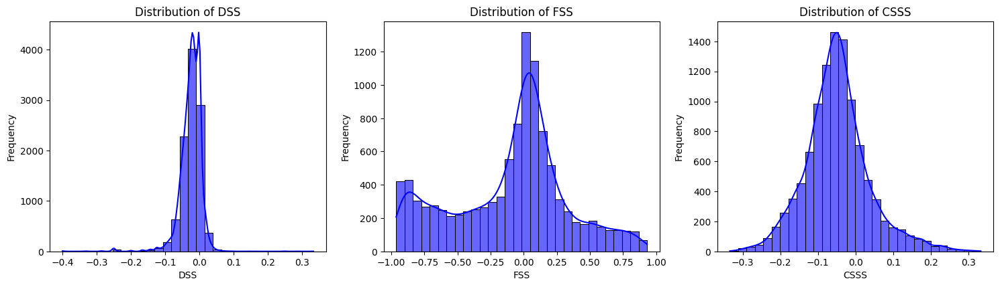

In [42]:
import matplotlib.pyplot as plt
import seaborn as sns

# Define the variables of interest
variables = ["DSS", "FSS", "CSSS"]

# Compute mean and standard deviation
stats = daily_sentiments[variables].agg(['mean', 'std']).T
stats.columns = ['Mean', 'Standard Deviation']

# Display the stats
print("Mean and Standard Deviation for Each Variable:")
print(stats)

# Plot distributions
plt.figure(figsize=(15, 12))
for i, var in enumerate(variables, 1):
    plt.subplot(3, 3, i)
    sns.histplot(daily_sentiments[var], kde=True, bins=30, color="blue", alpha=0.6)
    plt.title(f"Distribution of {var}")
    plt.xlabel(var)
    plt.ylabel("Frequency")

plt.tight_layout()
plt.show()


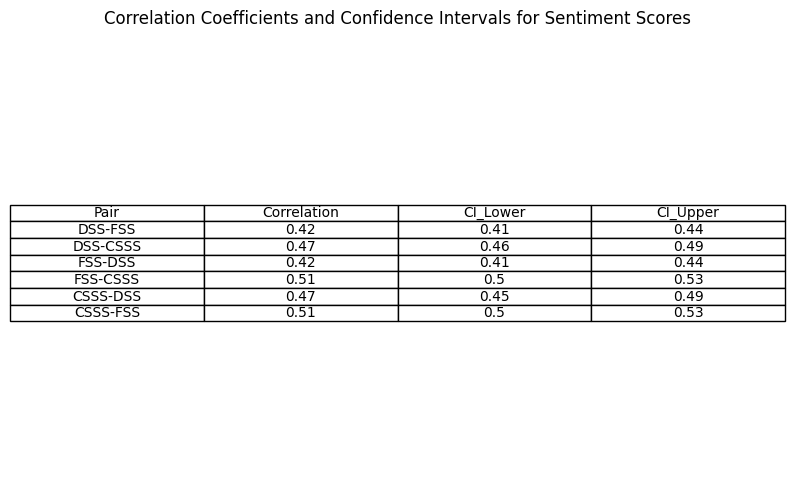

In [43]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import pearsonr
from matplotlib.table import Table

# Function to calculate confidence intervals for correlation
def bootstrap_correlation(data, columns, n_bootstrap=1000, ci=95):
    """
    Compute correlation coefficients and their confidence intervals using bootstrapping.

    Args:
        data (DataFrame): Input data.
        columns (list): List of columns to calculate correlations.
        n_bootstrap (int): Number of bootstrap samples.
        ci (float): Confidence level (e.g., 95 for 95%).

    Returns:
        DataFrame: Correlation matrix with confidence intervals.
    """
    correlations = {}
    for col1 in columns:
        for col2 in columns:
            if col1 != col2:
                bootstrap_corrs = []
                for _ in range(n_bootstrap):
                    sample = data.sample(frac=1, replace=True)
                    corr, _ = pearsonr(sample[col1], sample[col2])
                    bootstrap_corrs.append(corr)
                lower = np.percentile(bootstrap_corrs, (100 - ci) / 2)
                upper = np.percentile(bootstrap_corrs, 100 - (100 - ci) / 2)
                correlations[(col1, col2)] = (data[col1].corr(data[col2]), lower, upper)

    return correlations

# Select the columns for correlation analysis
columns_for_correlation = ["DSS", "FSS", "CSSS"]

# Compute correlation coefficients and confidence intervals
results = bootstrap_correlation(daily_sentiments, columns_for_correlation)

# Convert results to a DataFrame for display
results_df = pd.DataFrame(
    [
        {"Pair": f"{k[0]}-{k[1]}", "Correlation": v[0], "CI_Lower": v[1], "CI_Upper": v[2]}
        for k, v in results.items()
    ]
)

# Plot the correlation matrix as a styled DataFrame table
fig, ax = plt.subplots(figsize=(10, 6))  # Adjust the figure size
table = ax.table(
    cellText=results_df.round(2).values,
    colLabels=results_df.columns,
    cellLoc="center",
    loc="center",
)

plt.title("Correlation Coefficients and Confidence Intervals for Sentiment Scores")
ax.axis("off")  # Hide axes for a cleaner table
plt.show()


In [45]:
results_df

,Pair,Correlation,CI_Lower,CI_Upper
0,DSS-FSS,0.424469,0.408711,0.440103
1,DSS-CSSS,0.471472,0.455772,0.488423
2,FSS-DSS,0.424469,0.408368,0.441138
3,FSS-CSSS,0.514670,0.499596,0.529768
4,CSSS-DSS,0.471472,0.454414,0.488222
5,CSSS-FSS,0.514670,0.498474,0.530046


In [46]:
daily_sentiments = pd.read_csv("Sentiment Brazil Score/daily_Brazil_news_sentiments.csv")
daily_sentiments.head()

,Date,Year,Quarter,Content_Theme,Title_Theme,Title_DSS,Title_FSS,Title_CSSS,Content_DSS,Content_FSS,Content_CSSS,DSS,FSS,CSSS
0,2024-09-23,2024,2024Q3,Monetary Policy_positive,Market Performance_negative,0.000000,-0.852344,-0.168860,-0.042553,-0.064868,-0.066530,-0.042553,-0.064868,-0.066530
1,2024-09-18,2024,2024Q3,Monetary Policy_positive,Monetary Policy_positive,0.000000,0.059389,-0.030268,-0.012346,0.102778,-0.054134,-0.012346,0.102778,-0.054134
2,2024-09-18,2024,2024Q3,Monetary Policy_positive,Monetary Policy_positive,0.000000,-0.117776,-0.083272,-0.039370,-0.084269,-0.082480,-0.039370,-0.084269,-0.082480
3,2024-09-18,2024,2024Q3,Monetary Policy_positive,Political Developments_negative,-0.052632,-0.619954,-0.186862,-0.032164,-0.102930,-0.085323,-0.032164,-0.102930,-0.085323
4,2024-09-18,2024,2024Q3,Monetary Policy_negative,Monetary Policy_positive,0.000000,-0.323484,-0.099036,-0.015873,0.230422,-0.147938,-0.015873,0.230422,-0.147938


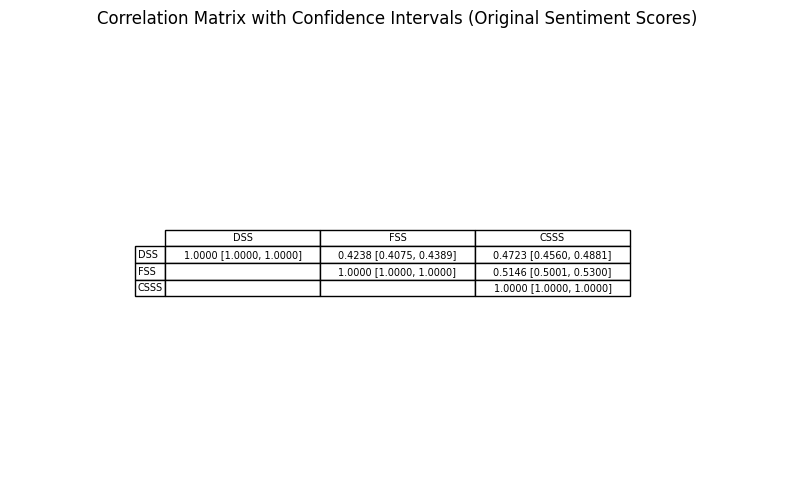

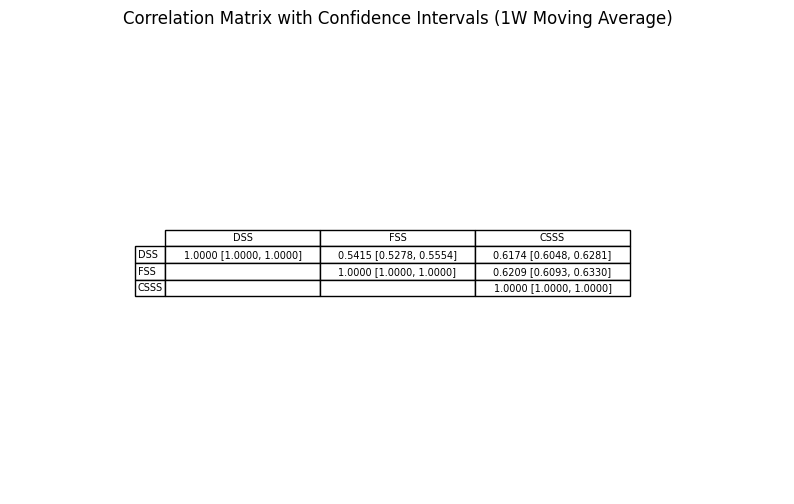

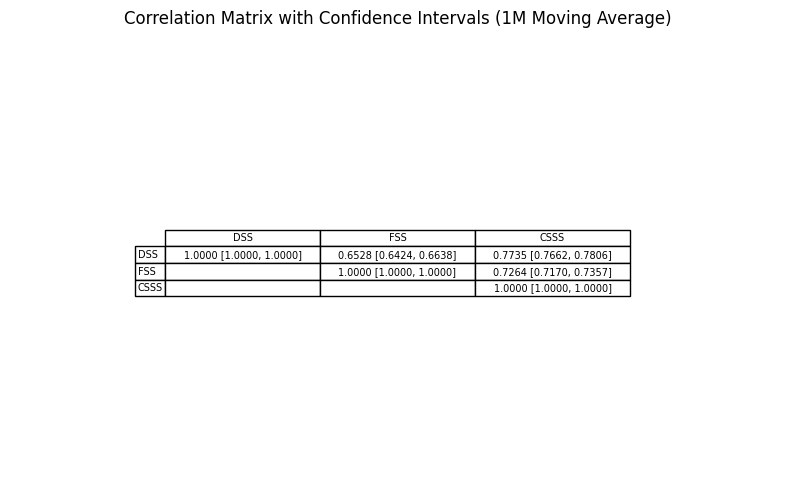

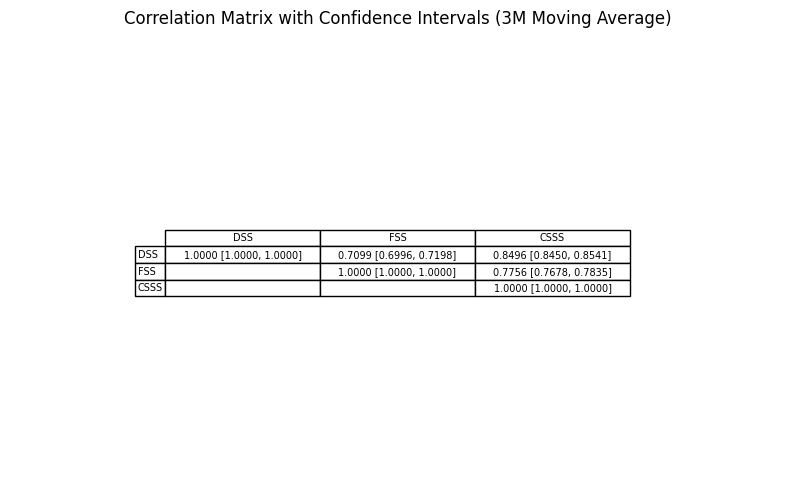

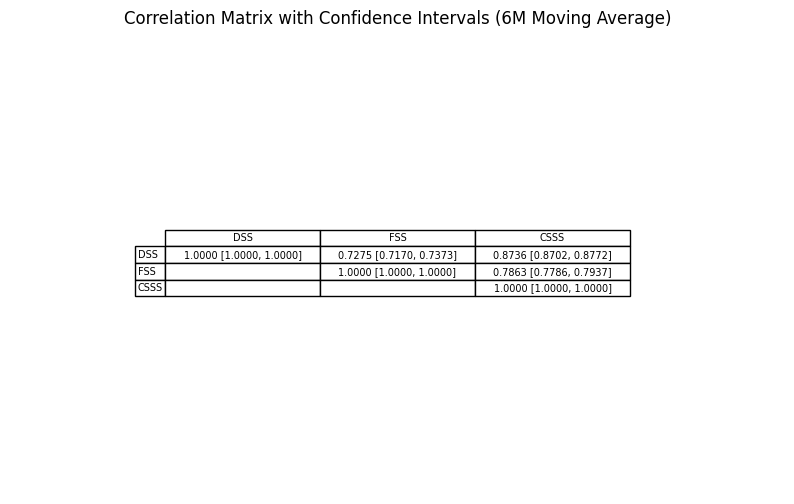

In [47]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import bootstrap
from pandas.plotting import table

# Define moving average periods
moving_average_periods = {"Original": 0, "1W": 7, "1M": 30, "3M": 90, "6M": 180}
sentiment_columns = ["DSS", "FSS", "CSSS"]

# Function to compute moving averages for each sentiment score
def compute_moving_averages(df, periods, columns):
    for period_label, window in periods.items():
        if window > 0:  # Skip "Original" (no smoothing)
            for col in columns:
                df[f"{col}_MA_{period_label}"] = df[col].rolling(window=window, min_periods=1).mean()

# Compute moving averages for sentiment scores
compute_moving_averages(daily_sentiments, moving_average_periods, sentiment_columns)

# Function to calculate confidence intervals for correlations using bootstrapping
def calculate_bootstrap_ci(data, col1, col2, n_resamples=1000, confidence_level=0.95):
    correlations = []
    rng = np.random.default_rng()
    for _ in range(n_resamples):
        sample_indices = rng.choice(len(data), size=len(data), replace=True)
        sample = data.iloc[sample_indices]
        correlations.append(sample[col1].corr(sample[col2]))
    lower_bound = np.percentile(correlations, (1 - confidence_level) / 2 * 100)
    upper_bound = np.percentile(correlations, (1 + confidence_level) / 2 * 100)
    return np.mean(correlations), (lower_bound, upper_bound)

# Compute correlation matrices and confidence intervals for moving averages (and original data)
results = {}
for period_label, window in moving_average_periods.items():
    if period_label == "Original":  # Use the original data
        columns = sentiment_columns
    else:  # Use smoothed data
        columns = [f"{col}_MA_{period_label}" for col in sentiment_columns]

    corr_matrix = daily_sentiments[columns].corr()
    ci_matrix = pd.DataFrame(index=sentiment_columns, columns=sentiment_columns)

    for i, col1 in enumerate(sentiment_columns):
        for j, col2 in enumerate(sentiment_columns):
            if i <= j:  # Compute only for upper triangle
                if period_label == "Original":
                    mean_corr, ci = calculate_bootstrap_ci(daily_sentiments, col1, col2)
                else:
                    mean_corr, ci = calculate_bootstrap_ci(
                        daily_sentiments,
                        f"{col1}_MA_{period_label}",
                        f"{col2}_MA_{period_label}"
                    )
                ci_matrix.loc[col1, col2] = f"{mean_corr:.4f} [{ci[0]:.4f}, {ci[1]:.4f}]"
            else:
                ci_matrix.loc[col1, col2] = ""

    results[period_label] = (corr_matrix, ci_matrix)

# Plot correlation matrices with confidence intervals
for period_label, (corr_matrix, ci_matrix) in results.items():
    fig, ax = plt.subplots(figsize=(10, 6))
    if period_label == "Original":
        title = "Correlation Matrix with Confidence Intervals (Original Sentiment Scores)"
    else:
        title = f"Correlation Matrix with Confidence Intervals ({period_label} Moving Average)"

    formatted_corr_matrix = corr_matrix.style.background_gradient(cmap="coolwarm", axis=None).format("{:.4f}")
    table(ax, ci_matrix, loc="center", cellLoc="center", colWidths=[0.2] * len(ci_matrix.columns))
    ax.axis("off")
    plt.title(title)
    plt.show()


In [48]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import pearsonr

# Function to calculate confidence intervals for correlation
def bootstrap_correlation(data, columns, n_bootstrap=1000, ci=95):
    """
    Compute correlation coefficients and their confidence intervals using bootstrapping.

    Args:
        data (DataFrame): Input data.
        columns (list): List of columns to calculate correlations.
        n_bootstrap (int): Number of bootstrap samples.
        ci (float): Confidence level (e.g., 95 for 95%).

    Returns:
        DataFrame: Correlation matrix with confidence intervals.
    """
    correlations = {}
    for col1 in columns:
        for col2 in columns:
            if col1 != col2:
                bootstrap_corrs = []
                for _ in range(n_bootstrap):
                    sample = data.sample(frac=1, replace=True)
                    corr, _ = pearsonr(sample[col1], sample[col2])
                    bootstrap_corrs.append(corr)
                lower = np.percentile(bootstrap_corrs, (100 - ci) / 2)
                upper = np.percentile(bootstrap_corrs, 100 - (100 - ci) / 2)
                correlations[(col1, col2)] = (data[col1].corr(data[col2]), lower, upper)

    return correlations

# Select the columns for correlation analysis
columns_for_correlation = ["DSS", "FSS", "CSSS"]

# Compute correlation coefficients and confidence intervals
results = bootstrap_correlation(daily_sentiments, columns_for_correlation)

# Convert results to a DataFrame for display
results_df = pd.DataFrame(
    [
        {"Pair": f"{k[0]}-{k[1]}", "Correlation": v[0], "CI_Lower": v[1], "CI_Upper": v[2]}
        for k, v in results.items()
    ]
)

results_df

,Pair,Correlation,CI_Lower,CI_Upper
0,DSS-FSS,0.424469,0.408230,0.439377
1,DSS-CSSS,0.471472,0.454804,0.488119
2,FSS-DSS,0.424469,0.408577,0.440197
3,FSS-CSSS,0.514670,0.499941,0.529265
4,CSSS-DSS,0.471472,0.456066,0.488377
5,CSSS-FSS,0.514670,0.499390,0.531276


In [50]:
print(daily_sentiments.columns)

Index(['Date', 'Year', 'Quarter', 'Content_Theme', 'Title_Theme', 'Title_DSS',
       'Title_FSS', 'Title_CSSS', 'Content_DSS', 'Content_FSS', 'Content_CSSS',
       'DSS', 'FSS', 'CSSS', 'DSS_MA_1W', 'FSS_MA_1W', 'CSSS_MA_1W',
       'DSS_MA_1M', 'FSS_MA_1M', 'CSSS_MA_1M', 'DSS_MA_3M', 'FSS_MA_3M',
       'CSSS_MA_3M', 'DSS_MA_6M', 'FSS_MA_6M', 'CSSS_MA_6M'],
      dtype='object')


C:\Users\gigan\AppData\Local\Temp\ipykernel_20100\289208002.py:24: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  daily_sentiments[f"{col}_MA_{period_label}_Standardized"] = standardize_column(
C:\Users\gigan\AppData\Local\Temp\ipykernel_20100\289208002.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  daily_sentiments[f"{col}_ExpSmoothed_Standardized"] = standardize_column(
C:\Users\gigan\AppData\Local\Temp\ipykernel_20100\289208002.py:24: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of call

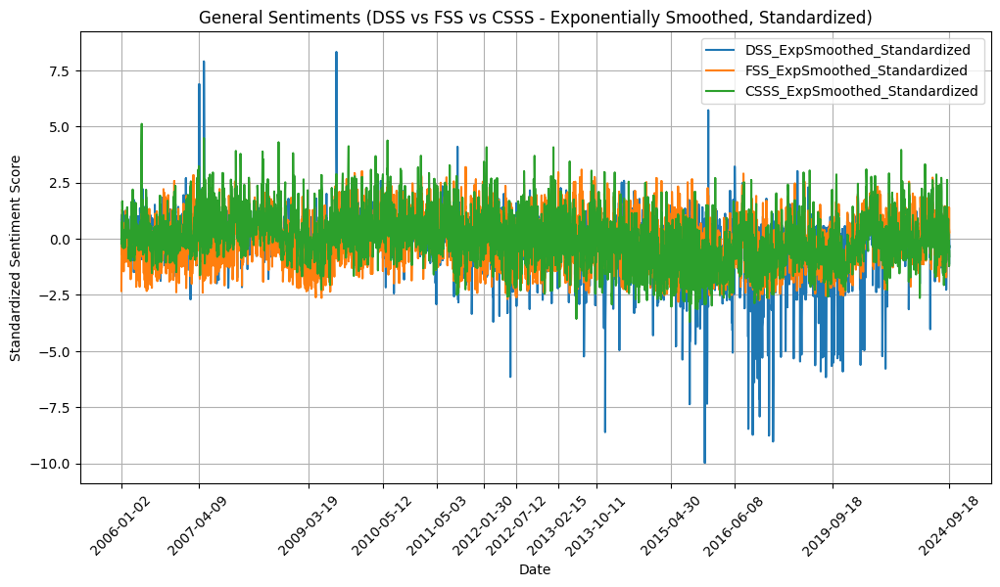

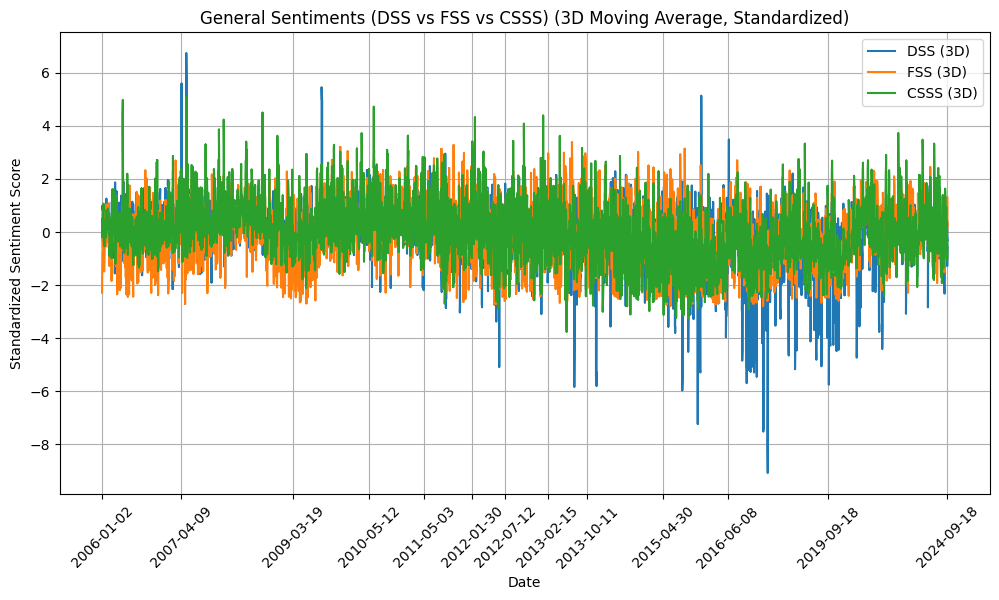

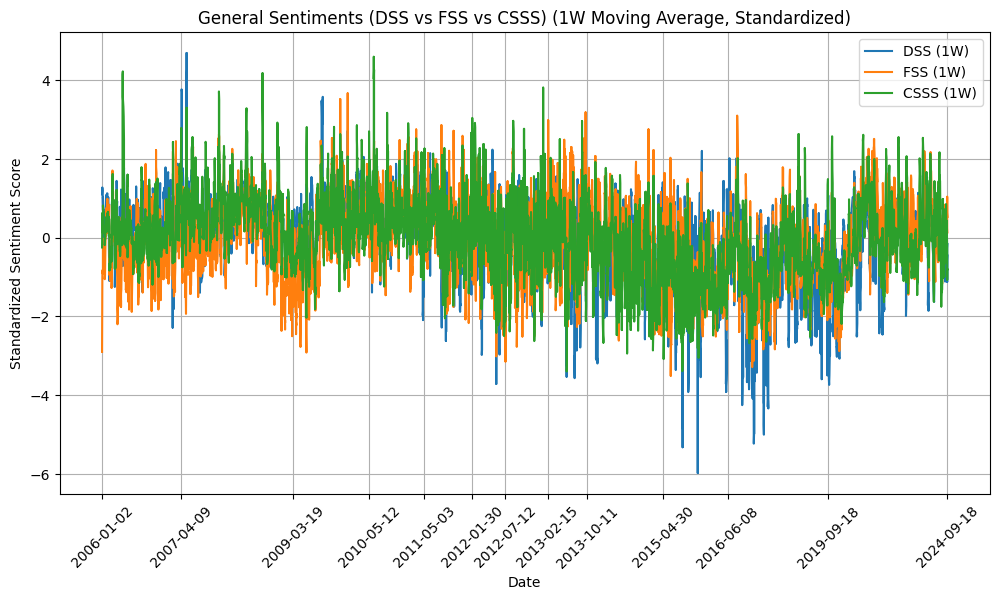

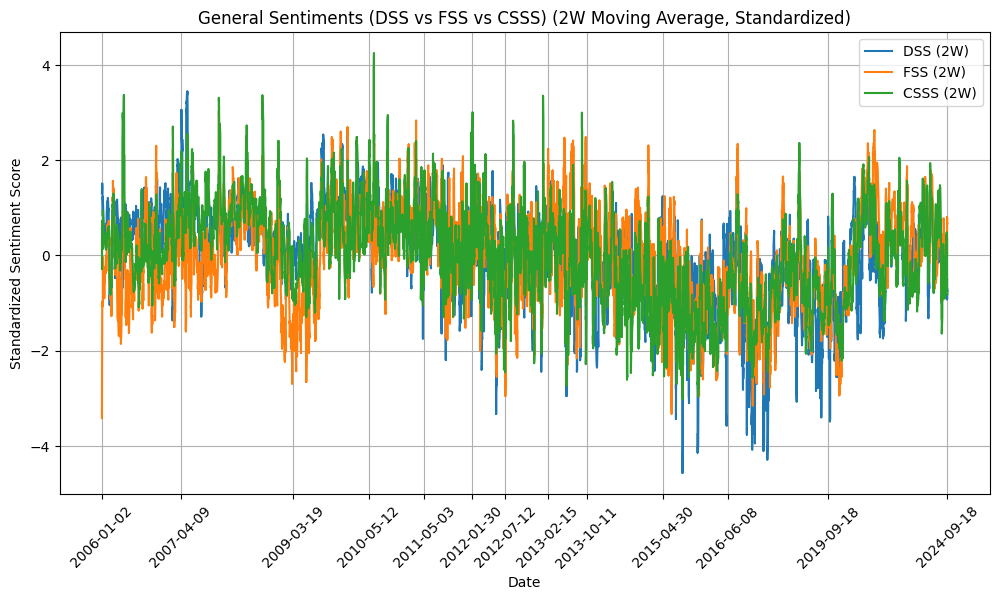

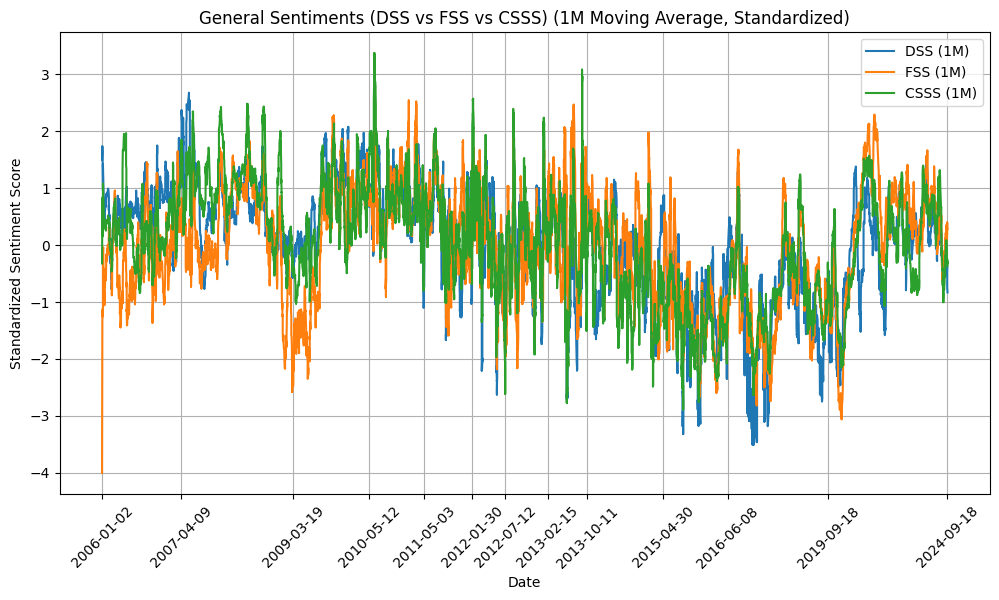

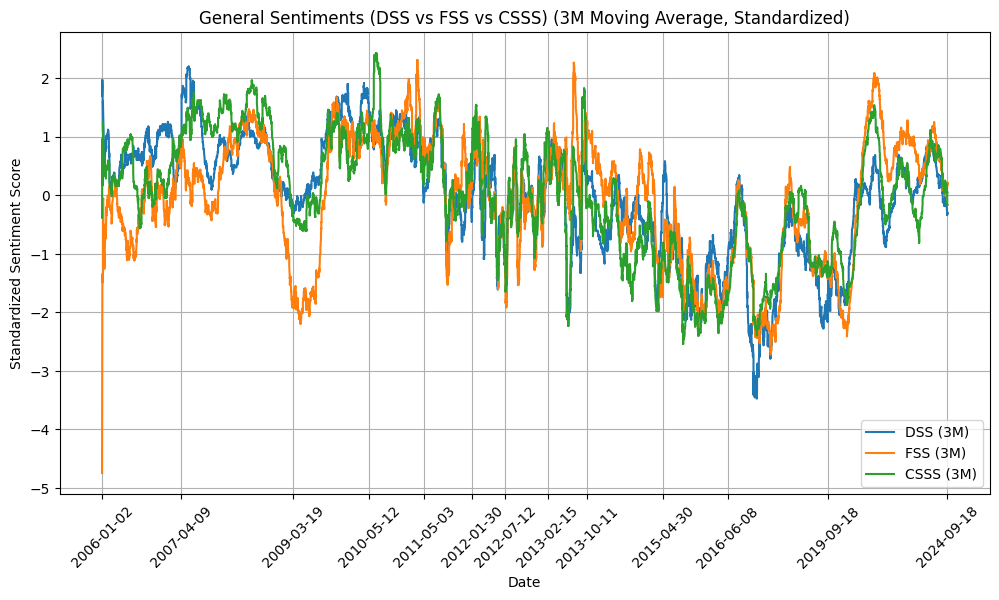

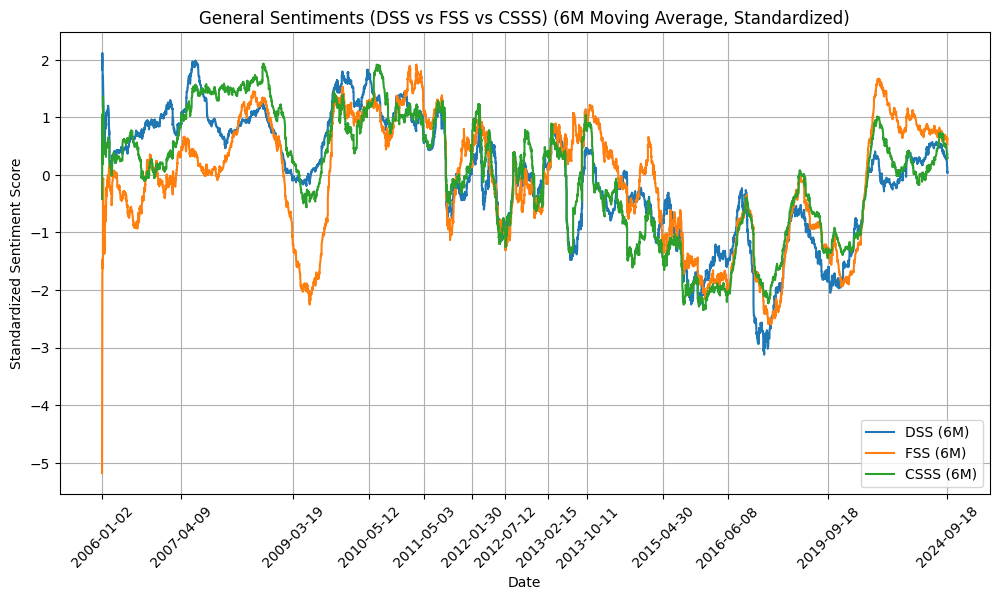

In [54]:
import matplotlib.pyplot as plt

# Define moving average periods
period_labels = ["3D", "1W", "2W", "1M", "3M", "6M"]
# Sentiment groups
general_sentiments = ["DSS", "FSS", "CSSS"]


# Standardize the values (z-scores) for a given DataFrame column
def standardize_column(df, column):
    mean = df[column].mean()
    std = df[column].std()
    return (df[column] - mean) / std

for col in sentiment_columns:
    daily_sentiments[f"{col}_ExpSmoothed"] = daily_sentiments[col].ewm(alpha=smoothing_factor).mean()

# Standardize the exponentially smoothed and moving average columns for each sentiment
for col in sentiment_columns:
    daily_sentiments[f"{col}_ExpSmoothed_Standardized"] = standardize_column(
        daily_sentiments, f"{col}_ExpSmoothed"
    )
    for period_label in period_labels:
        daily_sentiments[f"{col}_MA_{period_label}_Standardized"] = standardize_column(
            daily_sentiments, f"{col}_MA_{period_label}"
        )

# Function to plot standardized sentiments with reduced x-axis label frequency
def plot_standardized_sentiments(df, sentiment_columns, title):
    """
    Plots DSS, FSS, and CSSS for a given type (Title, Content, General) using standardized values.
    """
    plt.figure(figsize=(12, 6))
    for col in sentiment_columns:
        plt.plot(df["Date"], df[col], label=col)
    plt.title(title)
    plt.xlabel("Date")
    plt.ylabel("Standardized Sentiment Score")
    plt.xticks(df["Date"][::int(len(df) / 12)], rotation=45)  # Reduce x-axis labels to every 10% of the data
    plt.legend()
    plt.grid()
    plt.show()

# Plot standardized General sentiments (Exponentially Smoothed)
plot_standardized_sentiments(
    daily_sentiments,
    ["DSS_ExpSmoothed_Standardized", "FSS_ExpSmoothed_Standardized", "CSSS_ExpSmoothed_Standardized"],
    "General Sentiments (DSS vs FSS vs CSSS - Exponentially Smoothed, Standardized)"
)

# Function to plot moving averages for standardized values with reduced x-axis label frequency
def plot_standardized_moving_averages(df, sentiment_columns, title, period_label):
    """
    Plots standardized moving averages for DSS, FSS, and CSSS for a given type (Title, Content, General).
    """
    plt.figure(figsize=(12, 6))
    for col in sentiment_columns:
        standardized_col = f"{col}_MA_{period_label}_Standardized"
        plt.plot(df["Date"], df[standardized_col], label=f"{col} ({period_label})")
    plt.title(f"{title} ({period_label} Moving Average, Standardized)")
    plt.xlabel("Date")
    plt.ylabel("Standardized Sentiment Score")
    plt.xticks(df["Date"][::int(len(df) / 12)], rotation=45)  # Reduce x-axis labels to every 10% of the data
    plt.legend()
    plt.grid()
    plt.show()

# Plot standardized General Sentiments Moving Averages
for period in period_labels:
    plot_standardized_moving_averages(
        daily_sentiments,
        general_sentiments,
        "General Sentiments (DSS vs FSS vs CSSS)",
        period
    )


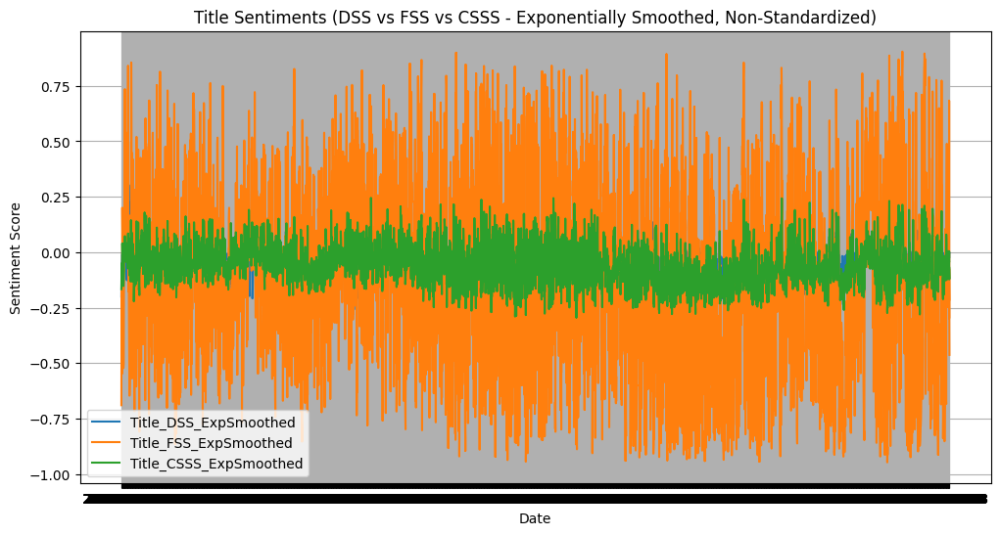

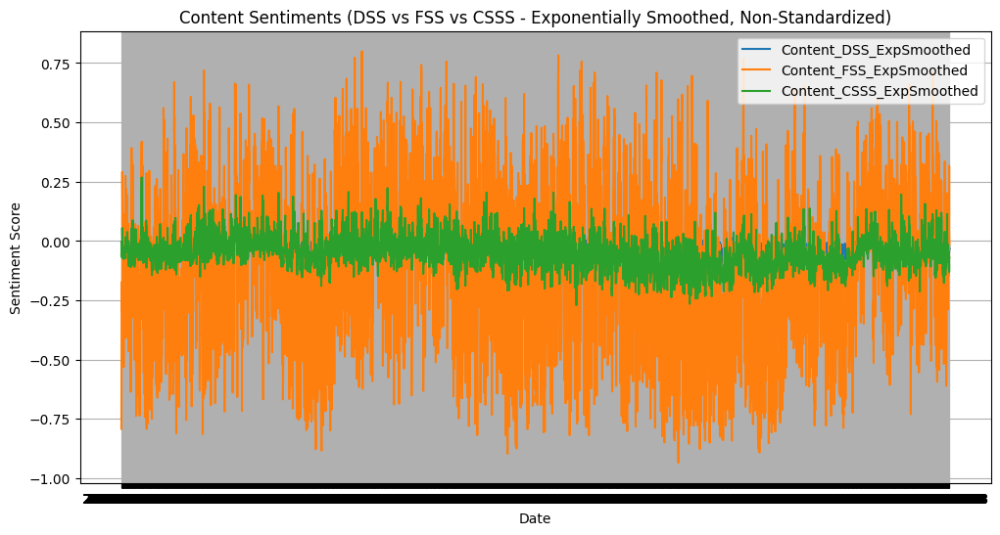

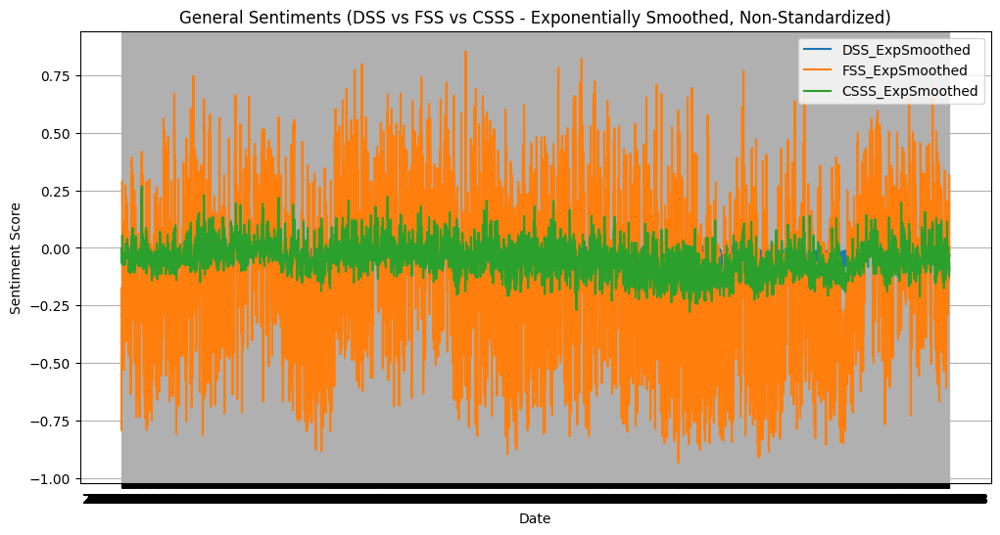

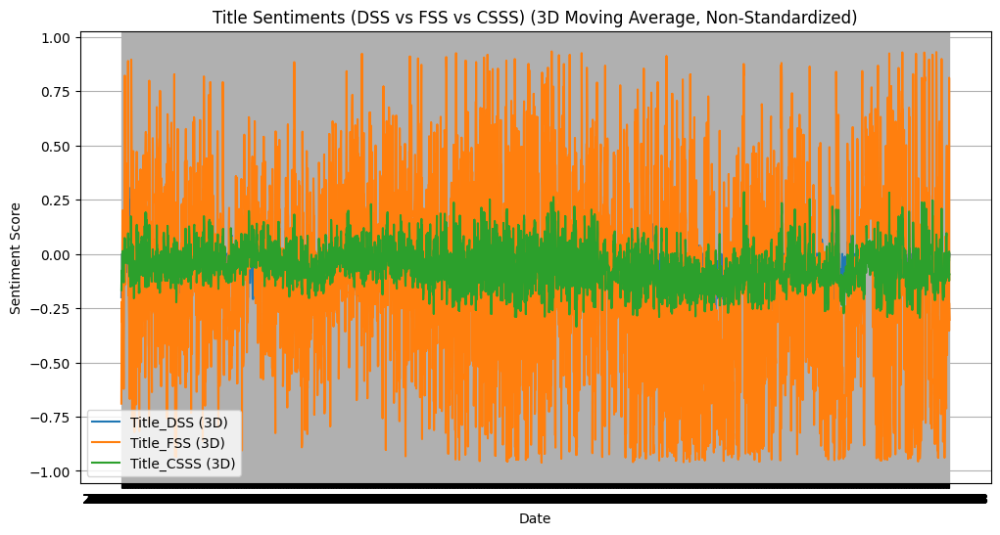

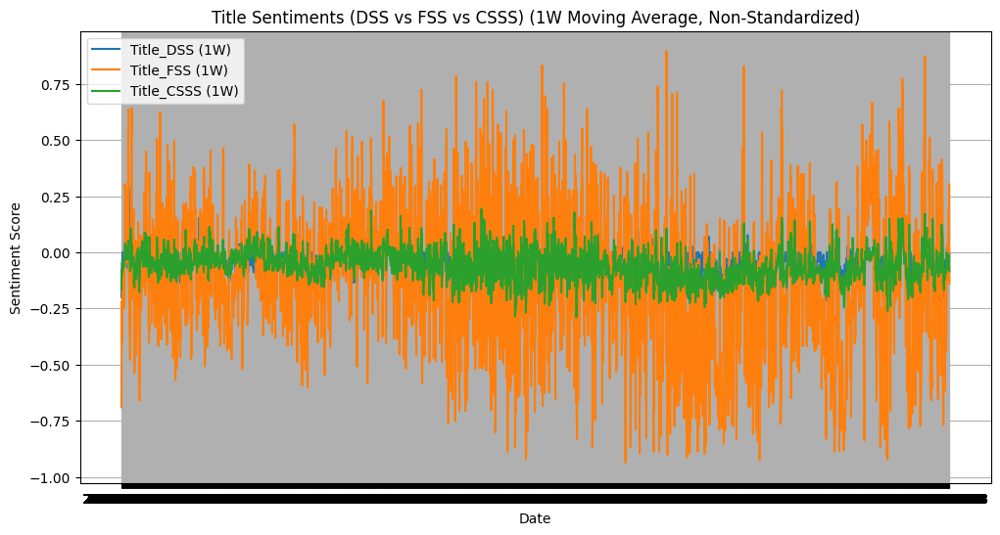

...

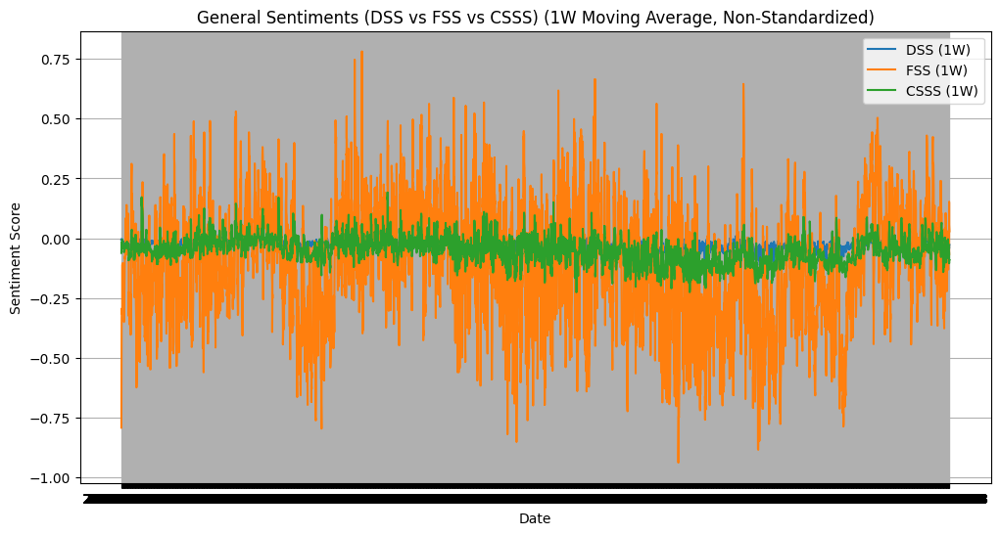

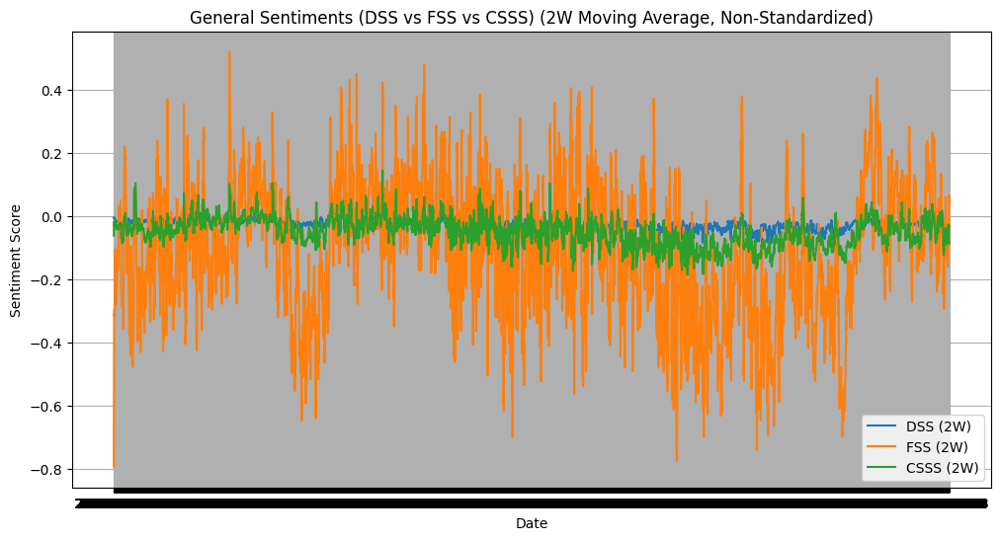

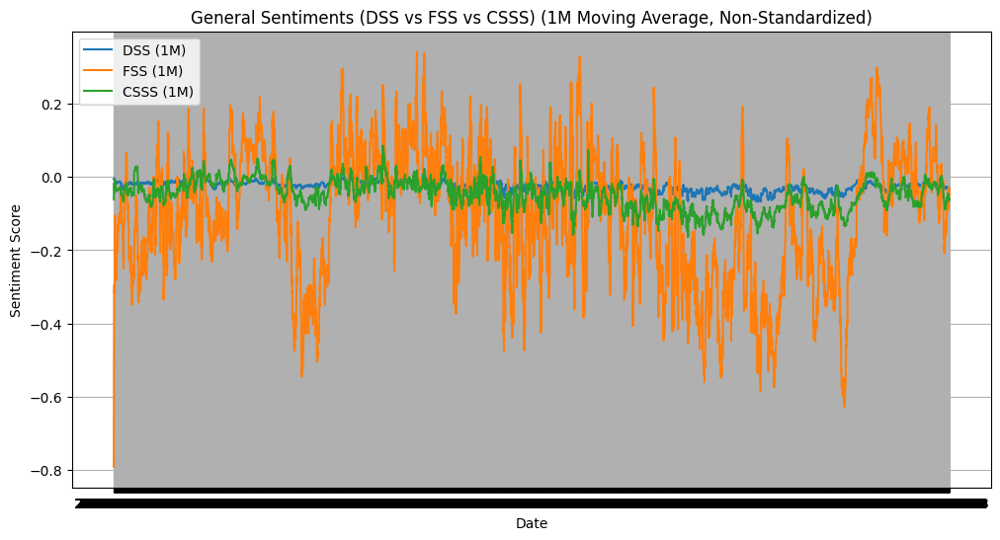

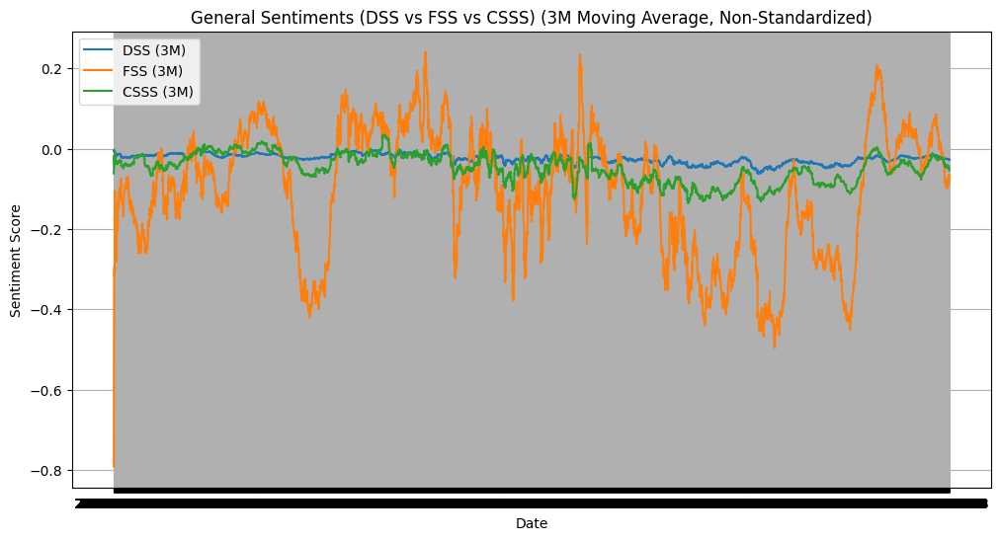

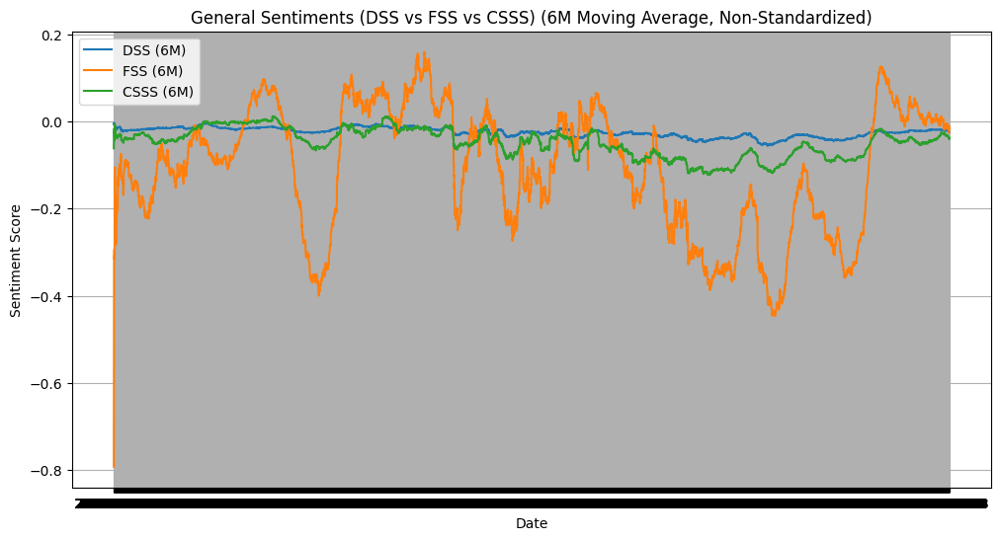

In [55]:
import matplotlib.pyplot as plt

# Define a function to plot non-standardized sentiments
def plot_non_standardized_sentiments(df, sentiment_columns, title):
    """
    Plots DSS, FSS, and CSSS for a given type (Title, Content, General).
    """
    plt.figure(figsize=(12, 6))
    for col in sentiment_columns:
        plt.plot(df["Date"], df[col], label=col)
    plt.title(title)
    plt.xlabel("Date")
    plt.ylabel("Sentiment Score")
    plt.legend()
    plt.grid()
    plt.show()

# Plot non-standardized Title sentiments (DSS, FSS, CSSS - Exponentially Smoothed)
plot_non_standardized_sentiments(
    daily_sentiments,
    ["Title_DSS_ExpSmoothed", "Title_FSS_ExpSmoothed", "Title_CSSS_ExpSmoothed"],
    "Title Sentiments (DSS vs FSS vs CSSS - Exponentially Smoothed, Non-Standardized)"
)

# Plot non-standardized Content sentiments (DSS, FSS, CSSS - Exponentially Smoothed)
plot_non_standardized_sentiments(
    daily_sentiments,
    ["Content_DSS_ExpSmoothed", "Content_FSS_ExpSmoothed", "Content_CSSS_ExpSmoothed"],
    "Content Sentiments (DSS vs FSS vs CSSS - Exponentially Smoothed, Non-Standardized)"
)

# Plot non-standardized General sentiments (DSS, FSS, CSSS - Exponentially Smoothed)
plot_non_standardized_sentiments(
    daily_sentiments,
    ["DSS_ExpSmoothed", "FSS_ExpSmoothed", "CSSS_ExpSmoothed"],
    "General Sentiments (DSS vs FSS vs CSSS - Exponentially Smoothed, Non-Standardized)"
)

# Define a function to plot moving averages for a given period (non-standardized)
def plot_non_standardized_moving_averages(df, sentiment_columns, title, period_label):
    """
    Plots moving averages for DSS, FSS, and CSSS for a given type (Title, Content, General).
    """
    plt.figure(figsize=(12, 6))
    for col in sentiment_columns:
        plt.plot(df["Date"], df[f"{col}_MA_{period_label}"], label=f"{col} ({period_label})")
    plt.title(f"{title} ({period_label} Moving Average, Non-Standardized)")
    plt.xlabel("Date")
    plt.ylabel("Sentiment Score")
    plt.legend()
    plt.grid()
    plt.show()

# List of moving average periods to plot
period_labels = ["3D", "1W", "2W", "1M", "3M", "6M"]

# Plot non-standardized Title Sentiments Moving Averages
for period in period_labels:
    plot_non_standardized_moving_averages(
        daily_sentiments,
        ["Title_DSS", "Title_FSS", "Title_CSSS"],
        "Title Sentiments (DSS vs FSS vs CSSS)",
        period
    )

# Plot non-standardized Content Sentiments Moving Averages
for period in period_labels:
    plot_non_standardized_moving_averages(
        daily_sentiments,
        ["Content_DSS", "Content_FSS", "Content_CSSS"],
        "Content Sentiments (DSS vs FSS vs CSSS)",
        period
    )

# Plot non-standardized General Sentiments Moving Averages
for period in period_labels:
    plot_non_standardized_moving_averages(
        daily_sentiments,
        ["DSS", "FSS", "CSSS"],
        "General Sentiments (DSS vs FSS vs CSSS)",
        period
    )


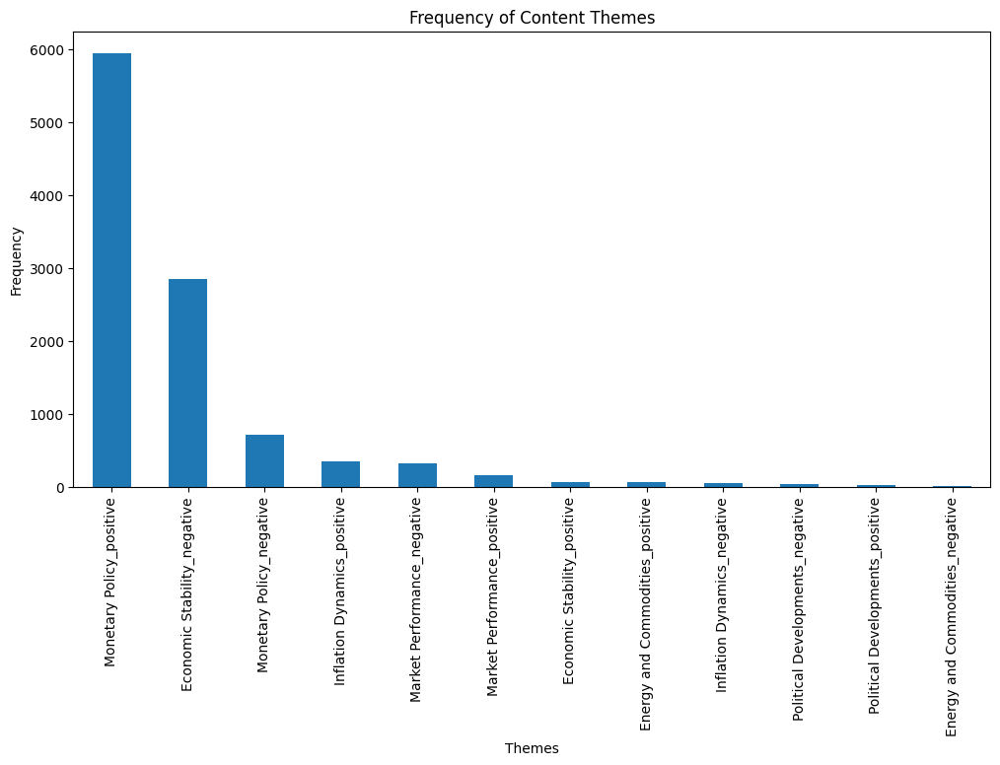

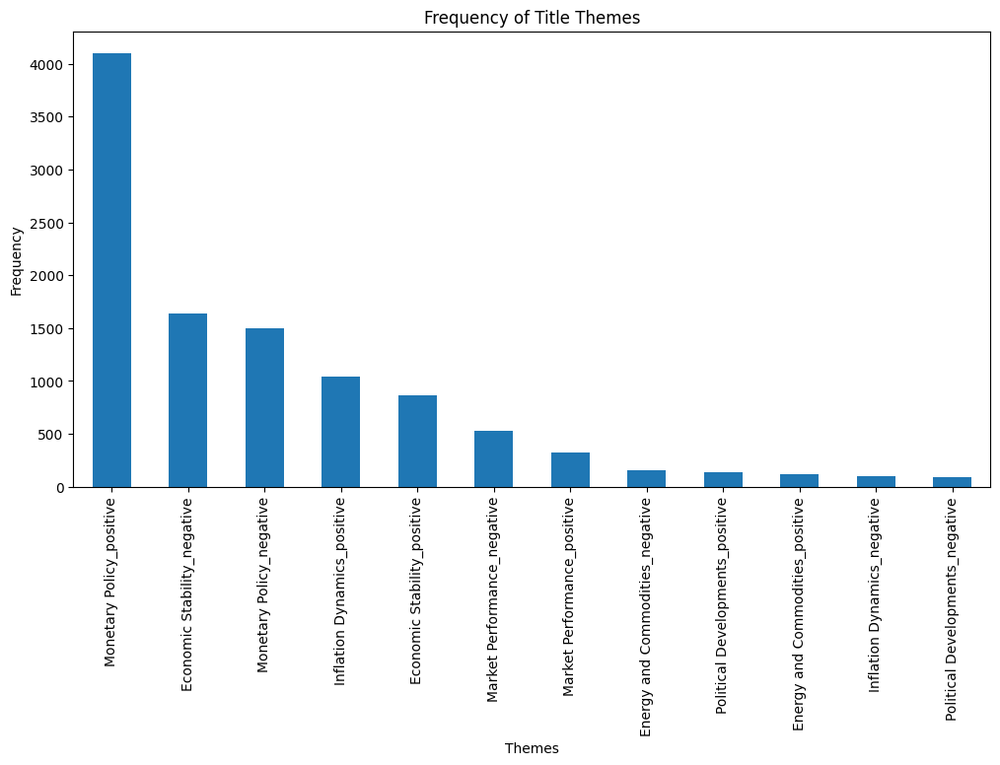

In [56]:
import matplotlib.pyplot as plt

# Frequency distribution for Content_Theme
content_theme_counts = daily_sentiments['Content_Theme'].value_counts()
content_theme_counts.plot(kind='bar', figsize=(12, 6), title='Frequency of Content Themes')
plt.xlabel('Themes')
plt.ylabel('Frequency')
plt.show()

# Frequency distribution for Title_Theme
title_theme_counts = daily_sentiments['Title_Theme'].value_counts()
title_theme_counts.plot(kind='bar', figsize=(12, 6), title='Frequency of Title Themes')
plt.xlabel('Themes')
plt.ylabel('Frequency')
plt.show()


In [57]:
# Compute average sentiment scores for Content_Theme
content_theme_sentiment = daily_sentiments.groupby('Content_Theme')[
    ['DSS', 'FSS', 'CSSS']
].mean().sort_values(by='CSSS', ascending=False)

# Compute average sentiment scores for Title_Theme
title_theme_sentiment = daily_sentiments.groupby('Title_Theme')[
    ['DSS', 'FSS', 'CSSS']
].mean().sort_values(by='CSSS', ascending=False)

# Display top 10 positive and negative themes
print("Top Positive Content Themes:")
print(content_theme_sentiment.head(10))

print("\nTop Negative Content Themes:")
print(content_theme_sentiment.tail(10))

print("\nTop Positive Title Themes:")
print(title_theme_sentiment.head(10))

print("\nTop Negative Title Themes:")
print(title_theme_sentiment.tail(10))


Top Positive Content Themes:
                                      DSS       FSS      CSSS
Content_Theme                                                
Energy and Commodities_positive  0.007434  0.479304  0.221041
Inflation Dynamics_positive     -0.006422  0.250436  0.142026
Inflation Dynamics_negative      0.007737  0.215519  0.134486
Economic Stability_positive     -0.014992 -0.095768 -0.023738
Monetary Policy_positive        -0.020620 -0.013461 -0.029704
Political Developments_positive -0.013255  0.070418 -0.035660
Market Performance_positive     -0.029961 -0.110167 -0.071954
Economic Stability_negative     -0.026644 -0.249607 -0.079800
Monetary Policy_negative        -0.047518 -0.283821 -0.137996
Market Performance_negative     -0.043340 -0.351987 -0.184860

Top Negative Content Themes:
                                      DSS       FSS      CSSS
Content_Theme                                                
Inflation Dynamics_negative      0.007737  0.215519  0.134486
Economic St

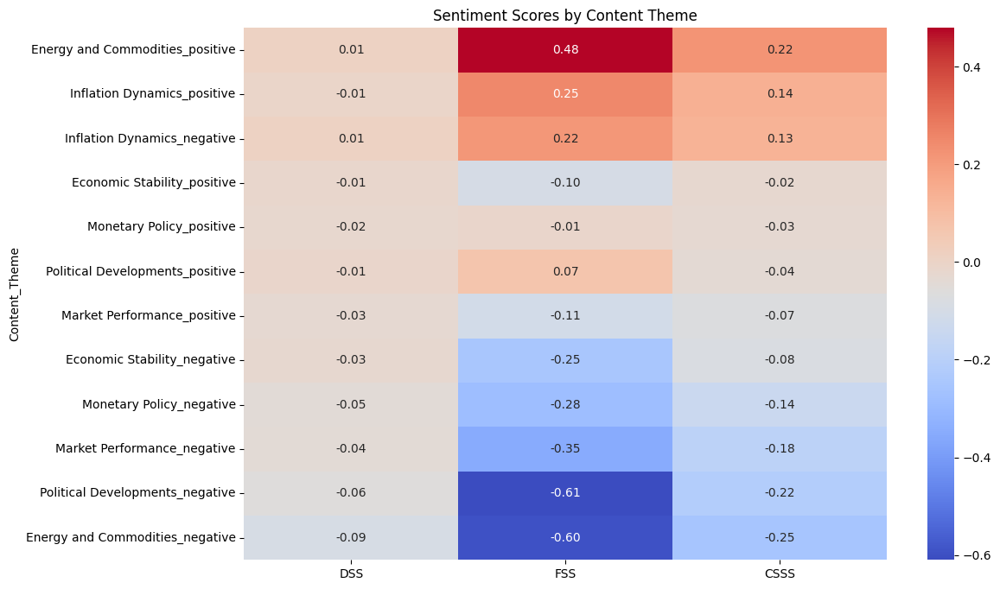

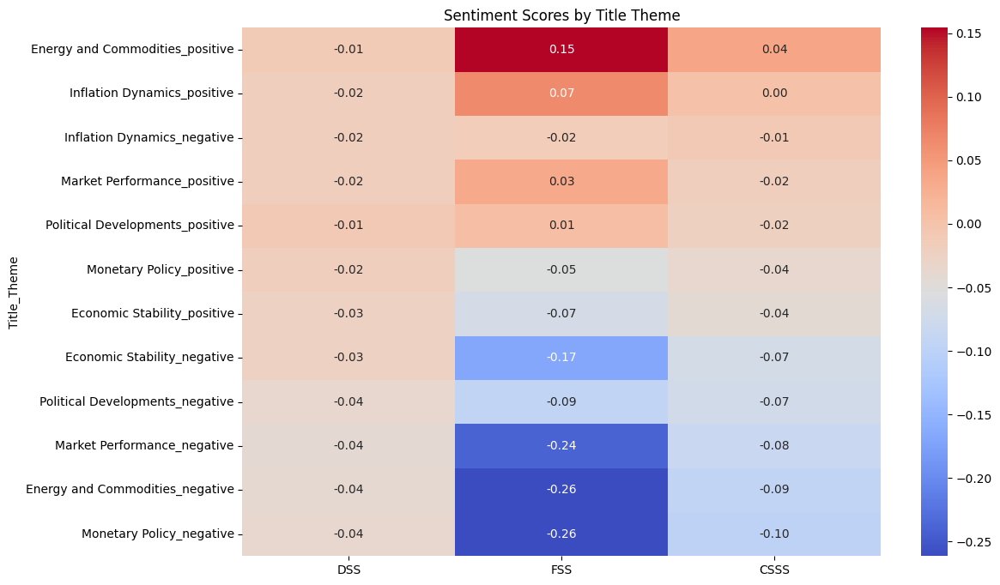

In [58]:
import seaborn as sns

# Heatmap for Content_Theme
plt.figure(figsize=(12, 8))
sns.heatmap(content_theme_sentiment, annot=True, fmt=".2f", cmap='coolwarm')
plt.title('Sentiment Scores by Content Theme')
plt.show()

# Heatmap for Title_Theme
plt.figure(figsize=(12, 8))
sns.heatmap(title_theme_sentiment, annot=True, fmt=".2f", cmap='coolwarm')
plt.title('Sentiment Scores by Title Theme')
plt.show()


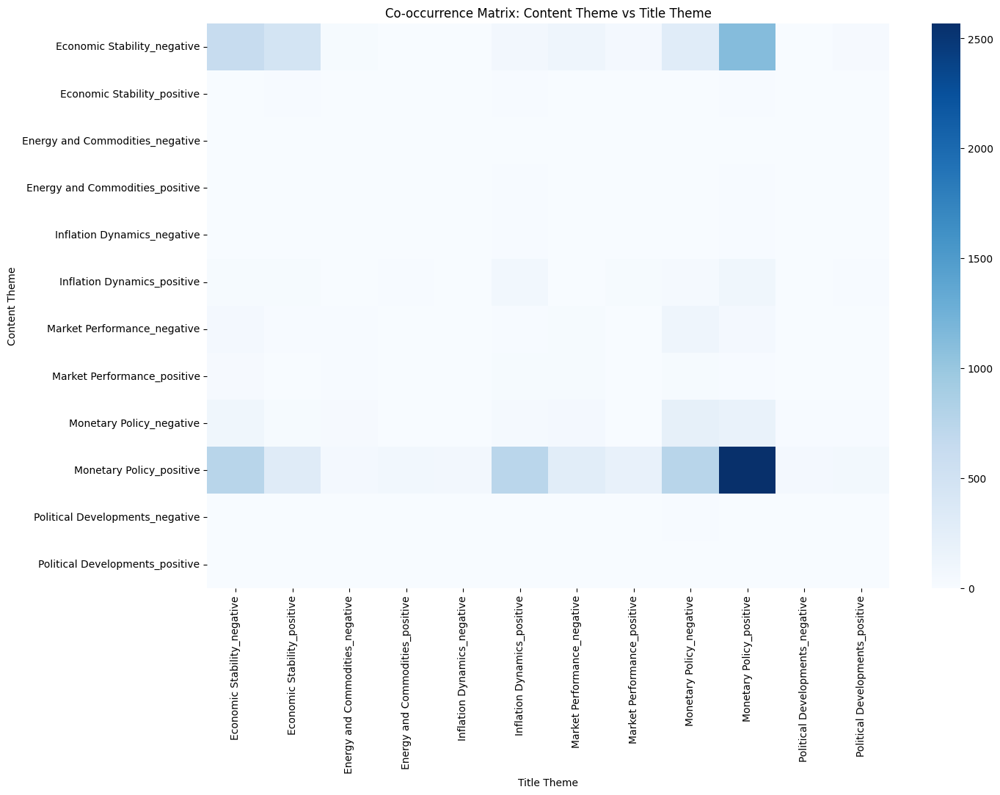

In [59]:
# Create a co-occurrence matrix
co_occurrence = pd.crosstab(
    daily_sentiments['Content_Theme'], daily_sentiments['Title_Theme']
)

# Plot the co-occurrence matrix
plt.figure(figsize=(15, 10))
sns.heatmap(co_occurrence, cmap='Blues', annot=False)
plt.title('Co-occurrence Matrix: Content Theme vs Title Theme')
plt.xlabel('Title Theme')
plt.ylabel('Content Theme')
plt.show()


In [60]:
# Transition matrix for Content_Theme
content_transition = pd.crosstab(
    daily_sentiments['Content_Theme'].shift(1), daily_sentiments['Content_Theme']
)

# Transition matrix for Title_Theme
title_transition = pd.crosstab(
    daily_sentiments['Title_Theme'].shift(1), daily_sentiments['Title_Theme']
)

# Display transition matrices
print("Content Theme Transition Matrix:")
print(content_transition)

print("\nTitle Theme Transition Matrix:")
print(title_transition)


Content Theme Transition Matrix:
Content_Theme                    Economic Stability_negative  \
Content_Theme                                                  
Economic Stability_negative                             1207   
Economic Stability_positive                                9   
Energy and Commodities_negative                            1   
Energy and Commodities_positive                           17   
Inflation Dynamics_negative                               12   
Inflation Dynamics_positive                               61   
Market Performance_negative                               66   
Market Performance_positive                               37   
Monetary Policy_negative                                 142   
Monetary Policy_positive                                1280   
Political Developments_negative                            7   
Political Developments_positive                            6   

Content_Theme                    Economic Stability_positive  \
Conten

In [61]:
daily_sentiments.head(1)

,Date,Year,Quarter,Content_Theme,Title_Theme,Title_DSS,Title_FSS,Title_CSSS,Content_DSS,Content_FSS,...,FSS_MA_1M_Standardized,FSS_MA_3M_Standardized,FSS_MA_6M_Standardized,CSSS_ExpSmoothed_Standardized,CSSS_MA_3D_Standardized,CSSS_MA_1W_Standardized,CSSS_MA_2W_Standardized,CSSS_MA_1M_Standardized,CSSS_MA_3M_Standardized,CSSS_MA_6M_Standardized
3428,2006-01-02,2006,2006Q1,Economic Stability_negative,Political Developments_positive,-0.2,-0.690112,-0.166818,-0.005848,-0.791858,...,-4.007364,-4.745347,-5.178161,-0.209821,-0.206845,-0.249605,-0.28758,-0.328783,-0.385215,-0.419445


In [63]:
econ_data = pd.read_csv("Sentiment Brazil Score/econ_data.csv")

In [64]:
# Convert Date to datetime
econ_data['Date'] = pd.to_datetime(econ_data['Date'])

# Remove '%' and convert rate columns to numeric
econ_data['Brazil_SELIC_Rate'] = pd.to_numeric(econ_data['Brazil_SELIC_Rate'].str.rstrip('%'))
econ_data['Fed_Funds_Rate'] = pd.to_numeric(econ_data['Fed_Funds_Rate'].str.rstrip('%'))

# Convert WTI_Price to numeric
econ_data['WTI_Price'] = pd.to_numeric(econ_data['WTI_Price'])

# Calculate interest rate differential
econ_data['Interest_Rate_Diff'] = econ_data['Brazil_SELIC_Rate'] - econ_data['Fed_Funds_Rate']

from sklearn.preprocessing import StandardScaler

# Now you can use StandardScaler
scaler = StandardScaler()
econ_data[['Interest_Rate_Diff_ST', 'WTI_Price_ST']] = scaler.fit_transform(
    econ_data[['Interest_Rate_Diff', 'WTI_Price']]
)

In [65]:
import pandas as pd

# Ensure the Date columns in both DataFrames are in datetime format
daily_sentiments["Date"] = pd.to_datetime(daily_sentiments["Date"])
econ_data["Date"] = pd.to_datetime(econ_data["Date"])

# Merge the two DataFrames on the Date column
merged_data = pd.merge(daily_sentiments, econ_data, on="Date", how="inner")


In [66]:
# Set pandas options to display the full output
pd.set_option('display.max_rows', None)  # Show all rows
pd.set_option('display.max_columns', None)  # Show all columns

# Display the count of non-null values for all columns
print(merged_data.count())

# Display the counts
print(non_empty_counts)


Date                                     10309
Year                                     10309
Quarter                                  10309
Content_Theme                            10309
Title_Theme                              10309
Title_DSS                                10309
Title_FSS                                10309
Title_CSSS                               10309
Content_DSS                              10309
Content_FSS                              10309
Content_CSSS                             10309
DSS                                      10309
FSS                                      10309
CSSS                                     10309
Title_DSS_ExpSmoothed                    10309
Title_FSS_ExpSmoothed                    10309
Title_CSSS_ExpSmoothed                   10309
Content_DSS_ExpSmoothed                  10309
Content_FSS_ExpSmoothed                  10309
Content_CSSS_ExpSmoothed                 10309
DSS_ExpSmoothed                          10309
FSS_ExpSmooth

NameError: name 'non_empty_counts' is not defined

In [67]:
import pandas as pd
from scipy.stats import spearmanr

# Define horizons for short-term and long-term predictions
short_term_horizons = [1, 7]  # 1-day, 1-week
long_term_horizons = [30, 90, 180, 365]  # 1-month, 3-months, 6-months, 1-year

# Define features with available moving averages (starting from 3-day MA)
features = [
    "DSS", "FSS", "CSSS",  # Sentiment scores
    "DSS_ExpSmoothed", "FSS_ExpSmoothed", "CSSS_ExpSmoothed",  # Exponential Smoothing
    "DSS_MA_3D", "FSS_MA_3D", "CSSS_MA_3D",  # Short-term MAs (3D and above)
    "DSS_MA_1W", "FSS_MA_1W", "CSSS_MA_1W",  # Short-term MAs (1 Week)
    "DSS_MA_1M", "FSS_MA_1M", "CSSS_MA_1M",  # Long-term MAs
    "DSS_MA_3M", "FSS_MA_3M", "CSSS_MA_3M",
    "DSS_MA_6M", "FSS_MA_6M", "CSSS_MA_6M"
]

# Create a DataFrame to store results
correlation_results = []

# Calculate returns for the target variable (BRL)
for horizon in short_term_horizons + long_term_horizons:
    merged_data[f"BRL_Return_{horizon}D"] = (
        merged_data["USDBRL"].shift(-horizon) - merged_data["USDBRL"]
    ) / merged_data["USDBRL"]

# Compute Spearman correlations for each feature with each horizon
for feature in features:
    for horizon in short_term_horizons + long_term_horizons:
        # Drop NA to ensure no issues in correlation calculation
        clean_data = merged_data[[feature, f"BRL_Return_{horizon}D"]].dropna()
        if not clean_data.empty:
            # Calculate Spearman correlation and p-value
            corr, p_value = spearmanr(clean_data[feature], clean_data[f"BRL_Return_{horizon}D"])
            correlation_results.append({
                "Feature": feature,
                "Horizon": f"{horizon}D",
                "Spearman Correlation": corr,
                "P-Value": p_value
            })

# Convert the results into a DataFrame for analysis
correlation_results_df = pd.DataFrame(correlation_results)

# Filter significant correlations (e.g., p-value < 0.05)
significant_results = correlation_results_df[correlation_results_df["P-Value"] < 0.05]

# Display the significant results
print(significant_results)

              Feature Horizon  Spearman Correlation       P-Value
2                 DSS     30D             -0.024522  1.291075e-02
3                 DSS     90D             -0.039311  7.040134e-05
4                 DSS    180D             -0.038845  9.213485e-05
5                 DSS    365D             -0.042831  1.932797e-05
10                FSS    180D              0.020005  4.408544e-02
14               CSSS     30D             -0.030207  2.192422e-03
15               CSSS     90D             -0.046837  2.172196e-06
16               CSSS    180D             -0.042074  2.277153e-05
17               CSSS    365D             -0.042901  1.872931e-05
19    DSS_ExpSmoothed      7D             -0.019350  4.953622e-02
20    DSS_ExpSmoothed     30D             -0.034994  3.873310e-04
21    DSS_ExpSmoothed     90D             -0.066851  1.336568e-11
22    DSS_ExpSmoothed    180D             -0.061873  4.596720e-10
23    DSS_ExpSmoothed    365D             -0.069920  2.949621e-12
27    FSS_

In [68]:
import pandas as pd
from scipy.stats import spearmanr

# Define smoothing functions
def exponential_smoothing(series, alpha=0.5):
    """Apply exponential smoothing to a pandas series."""
    return series.ewm(alpha=alpha, adjust=False).mean()

def moving_average(series, window):
    """Apply moving average to a pandas series."""
    return series.rolling(window=window).mean()

# Define horizons for short-term and long-term predictions
short_term_horizons = [1, 7, 30]  # 1-day, 1-week, 1-month
long_term_horizons = [30, 90, 180, 365]  # 1-month, 3-months, 6-months, 1-year

# Features to analyze
features = ["WTI_Price", "Interest_Rate_Diff"]

# Apply smoothing (Exponential Smoothing and Moving Averages)
for feature in features:
    merged_data[f"{feature}_ExpSmoothed"] = exponential_smoothing(merged_data[feature])
    merged_data[f"{feature}_MA_3D"] = moving_average(merged_data[feature], window=3)
    merged_data[f"{feature}_MA_1W"] = moving_average(merged_data[feature], window=7)
    merged_data[f"{feature}_MA_1M"] = moving_average(merged_data[feature], window=30)
    merged_data[f"{feature}_MA_3M"] = moving_average(merged_data[feature], window=90)
    merged_data[f"{feature}_MA_6M"] = moving_average(merged_data[feature], window=180)

# Create lagged features for short-term and long-term horizons
lagged_features = []
for feature in features + [f"{feature}_ExpSmoothed" for feature in features] + \
                  [f"{feature}_MA_3D" for feature in features] + \
                  [f"{feature}_MA_1W" for feature in features] + \
                  [f"{feature}_MA_1M" for feature in features] + \
                  [f"{feature}_MA_3M" for feature in features] + \
                  [f"{feature}_MA_6M" for feature in features]:
    for lag in short_term_horizons + long_term_horizons:
        lagged_col = f"{feature}_Lag_{lag}D"
        merged_data[lagged_col] = merged_data[feature].shift(lag)
        lagged_features.append(lagged_col)

# Calculate returns for the target variable (BRL)
for horizon in short_term_horizons + long_term_horizons:
    merged_data[f"BRL_Return_{horizon}D"] = (
        merged_data["USDBRL"].shift(-horizon) - merged_data["USDBRL"]
    ) / merged_data["USDBRL"]

# Initialize a DataFrame to store Spearman correlations
correlation_results = []

# Compute Spearman correlations
for feature in lagged_features:
    for horizon in short_term_horizons + long_term_horizons:
        target = f"BRL_Return_{horizon}D"
        # Drop NA to avoid issues in correlation calculation
        clean_data = merged_data[[feature, target]].dropna()
        if not clean_data.empty:
            # Calculate Spearman correlation and p-value
            corr, p_value = spearmanr(clean_data[feature], clean_data[target])
            correlation_results.append({
                "Feature": feature,
                "Horizon": f"{horizon}D",
                "Spearman Correlation": corr,
                "P-Value": p_value
            })

# Convert results to a DataFrame for analysis
correlation_results_df = pd.DataFrame(correlation_results)

# Filter results by p-value < 0.05
significant_results = correlation_results_df[correlation_results_df["P-Value"] < 0.05]

# Display the significant correlation results
print(significant_results)

C:\Users\gigan\AppData\Local\Temp\ipykernel_20100\2854609448.py:39: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  merged_data[lagged_col] = merged_data[feature].shift(lag)
C:\Users\gigan\AppData\Local\Temp\ipykernel_20100\2854609448.py:39: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  merged_data[lagged_col] = merged_data[feature].shift(lag)
C:\Users\gigan\AppData\Local\Temp\ipykernel_20100\2854609448.py:39: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, whic

                                     Feature Horizon  Spearman Correlation  \
1                           WTI_Price_Lag_1D      7D              0.035016   
2                           WTI_Price_Lag_1D     30D              0.074436   
3                           WTI_Price_Lag_1D     30D              0.074436   
4                           WTI_Price_Lag_1D     90D              0.126504   
5                           WTI_Price_Lag_1D    180D              0.204672   
6                           WTI_Price_Lag_1D    365D              0.290588   
8                           WTI_Price_Lag_7D      7D              0.036197   
9                           WTI_Price_Lag_7D     30D              0.074979   
10                          WTI_Price_Lag_7D     30D              0.074979   
11                          WTI_Price_Lag_7D     90D              0.127526   
12                          WTI_Price_Lag_7D    180D              0.208277   
13                          WTI_Price_Lag_7D    365D            

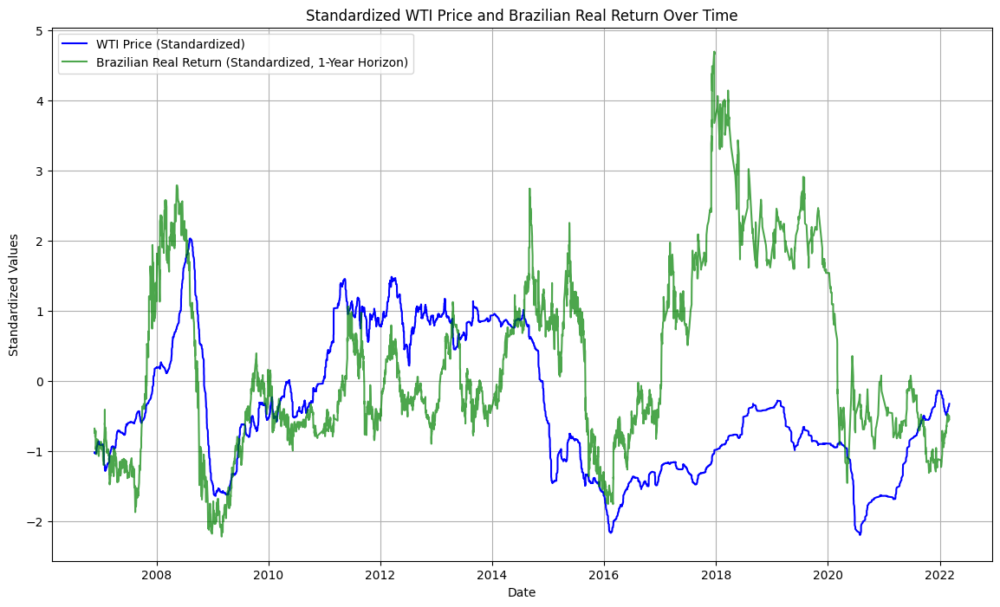

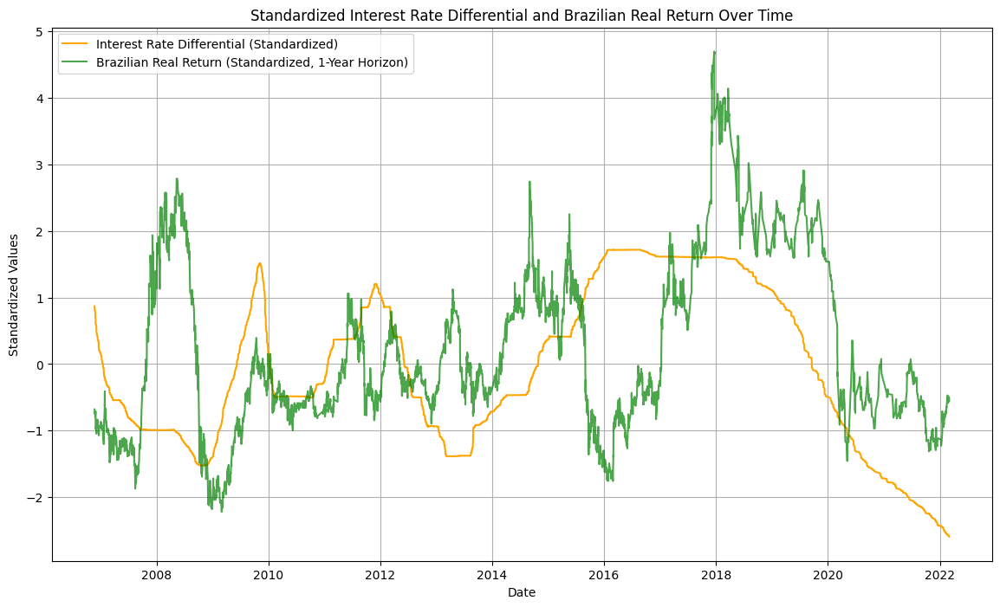

In [69]:
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

# Define the best-performing features and target variable
best_wti_feature = "WTI_Price_MA_1M_Lag_30D"  # Best WTI-related feature
best_interest_rate_feature = "Interest_Rate_Diff_MA_6M_Lag_365D"  # Best interest rate differential feature
target_variable = "BRL_Return_365D"  # Example: 1-year currency return

# Drop missing values to avoid issues in standardization and plotting
filtered_data = merged_data[[best_wti_feature, best_interest_rate_feature, target_variable, "Date"]].dropna()

# Convert 'Date' to datetime if not already
filtered_data["Date"] = pd.to_datetime(filtered_data["Date"])

# Standardize the features and target
scaler = StandardScaler()
standardized_data = scaler.fit_transform(filtered_data[[best_wti_feature, best_interest_rate_feature, target_variable]])
standardized_df = pd.DataFrame(
    standardized_data,
    columns=[best_wti_feature, best_interest_rate_feature, target_variable],
    index=filtered_data.index,
)
standardized_df["Date"] = filtered_data["Date"]

# Plot 1: Standardized WTI feature vs. Brazilian Real Return over time
plt.figure(figsize=(14, 8))
plt.plot(
    standardized_df["Date"],
    standardized_df[best_wti_feature],
    label="WTI Price (Standardized)",
    color="blue",
)
plt.plot(
    standardized_df["Date"],
    standardized_df[target_variable],
    label="Brazilian Real Return (Standardized, 1-Year Horizon)",
    color="green",
    alpha=0.7,
)
plt.title("Standardized WTI Price and Brazilian Real Return Over Time")
plt.xlabel("Date")
plt.ylabel("Standardized Values")
plt.legend()
plt.grid(True)
plt.show()

# Plot 2: Standardized Interest Rate Differential vs. Brazilian Real Return over time
plt.figure(figsize=(14, 8))
plt.plot(
    standardized_df["Date"],
    standardized_df[best_interest_rate_feature],
    label="Interest Rate Differential (Standardized)",
    color="orange",
)
plt.plot(
    standardized_df["Date"],
    standardized_df[target_variable],
    label="Brazilian Real Return (Standardized, 1-Year Horizon)",
    color="green",
    alpha=0.7,
)
plt.title("Standardized Interest Rate Differential and Brazilian Real Return Over Time")
plt.xlabel("Date")
plt.ylabel("Standardized Values")
plt.legend()
plt.grid(True)
plt.show()


In [71]:
option_data = pd.read_csv("Sentiment Brazil Score/options_market_data.csv")

In [72]:
import pandas as pd

# Ensure both datasets have the Date column in datetime format
option_data["Date"] = pd.to_datetime(option_data["Date"])
merged_data["Date"] = pd.to_datetime(merged_data["Date"])

# Perform an inner join on the Date column to merge the datasets
merged_data_with_options = pd.merge(merged_data, option_data, on="Date", how="inner")

# Display the structure and first few rows of the merged dataset
print(merged_data_with_options.info())
print(merged_data_with_options.head())


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10309 entries, 0 to 10308
Columns: 334 entries, Date to BRLBFIK5Y10D
dtypes: datetime64[ns](1), float64(327), int64(2), object(4)
memory usage: 26.3+ MB
None
        Date  Year Quarter                Content_Theme  \
0 2006-01-02  2006  2006Q1  Economic Stability_negative   
1 2006-01-05  2006  2006Q1     Monetary Policy_positive   
2 2006-01-09  2006  2006Q1  Economic Stability_negative   
3 2006-01-09  2006  2006Q1  Economic Stability_negative   
4 2006-01-11  2006  2006Q1  Economic Stability_negative   

                       Title_Theme  Title_DSS  Title_FSS  Title_CSSS  \
0  Political Developments_positive       -0.2  -0.690112   -0.166818   
1      Economic Stability_positive        0.0   0.088721    0.008830   
2         Monetary Policy_positive        0.0  -0.059169   -0.076523   
3  Political Developments_negative        0.0  -0.935544   -0.160816   
4         Monetary Policy_positive        0.0   0.050833   -0.031230   

   C

In [16]:
final_data = pd.read_csv("Sentiment Brazil Score/all_data.csv")

In [17]:
final_data

,Date,Year,Quarter,Content_Theme,Title_Theme,Title_DSS,Title_FSS,Title_CSSS,Content_DSS,Content_FSS,...,BRLBFIK1W10D,BRLBFIK2W10D,BRLBFIK1M10D,BRLBFIK2M10D,BRLBFIK3M10D,BRLBFIK6M10D,BRLBFIK9M10D,BRLBFIK1Y10D,BRLBFIK3Y10D,BRLBFIK5Y10D
0,2006-01-02,2006,2006Q1,Economic Stability_negative,Political Developments_positive,-0.2000,-0.690112,-0.166818,-0.005848,-0.791858,...,1.0202,NaN,1.5858,5.2959,1.6843,2.0079,5.5181,2.0031,1.8657,1.6753
1,2006-01-05,2006,2006Q1,Monetary Policy_positive,Economic Stability_positive,0.0000,0.088721,0.008830,0.000000,0.135889,...,2.0027,1.6680,1.5359,1.2346,1.6947,2.0180,2.0102,1.9948,1.8657,1.6753
2,2006-01-09,2006,2006Q1,Economic Stability_negative,Monetary Policy_positive,0.0000,-0.059169,-0.076523,-0.006803,-0.223803,...,2.0049,1.7185,1.5546,1.2384,1.6763,2.0180,5.3962,1.9866,1.8657,1.6753
3,2006-01-09,2006,2006Q1,Economic Stability_negative,Political Developments_negative,0.0000,-0.935544,-0.160816,-0.014870,-0.383756,...,2.0049,1.7185,1.5546,1.2384,1.6763,2.0180,5.3962,1.9866,1.8657,1.6753
4,2006-01-11,2006,2006Q1,Economic Stability_negative,Monetary Policy_positive,0.0000,0.050833,-0.031230,-0.035294,-0.252642,...,0.8751,0.9756,1.5522,1.2452,1.6614,1.9976,1.7115,1.9819,1.8678,1.6753
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10304,2023-12-13,2023,2023Q4,Monetary Policy_positive,Monetary Policy_negative,-0.0625,0.069429,-0.094199,-0.028409,-0.592835,...,1.0349,1.1925,1.1521,1.1681,1.3055,1.4316,1.4972,1.5661,1.9845,2.2927
10305,2023-12-13,2023,2023Q4,Economic Stability_negative,Monetary Policy_positive,0.0000,-0.581852,-0.096575,0.000000,-0.086564,...,1.0349,1.1925,1.1521,1.1681,1.3055,1.4316,1.4972,1.5661,1.9845,2.2927
10306,2023-12-13,2023,2023Q4,Monetary Policy_positive,Monetary Policy_negative,0.0000,-0.012767,-0.060324,-0.054545,-0.872048,...,1.0349,1.1925,1.1521,1.1681,1.3055,1.4316,1.4972,1.5661,1.9845,2.2927
10307,2023-12-15,2023,2023Q4,Economic Stability_negative,Monetary Policy_positive,0.0000,0.460811,0.099567,0.000000,0.146229,...,1.0068,1.2031,1.1509,1.1774,1.3028,1.4304,1.4891,1.5691,1.9983,2.2968


# ARIMA for Returns for 1 Day

In [7]:
pip install pmdarima


  Using cached pmdarima-2.0.4.tar.gz (630 kB)
  Installing build dependencies: started
  Installing build dependencies: finished with status 'done'
  Getting requirements to build wheel: started
  Getting requirements to build wheel: finished with status 'done'
  Preparing metadata (pyproject.toml): started
  Preparing metadata (pyproject.toml): finished with status 'done'
  Using cached Cython-3.0.12-cp313-cp313-win_amd64.whl.metadata (3.6 kB)
Using cached Cython-3.0.12-cp313-cp313-win_amd64.whl (2.8 MB)
Failed to build pmdarima
Note: you may need to restart the kernel to use updated packages.


  error: subprocess-exited-with-error
  
  × Building wheel for pmdarima (pyproject.toml) did not run successfully.
  │ exit code: 1
  ╰─> [43 lines of output]
      Partial import of pmdarima during the build process.
      
      Requirements: ['joblib>=0.11\nCython>=0.29,!=0.29.18,!=0.29.31\nnumpy>=1.21.2\npandas>=0.19\nscikit-learn>=0.22\nscipy>=1.3.2\nstatsmodels>=0.13.2\nurllib3\nsetuptools>=38.6.0,!=50.0.0\npackaging>=17.1  # Bundled with setuptools, but want to be explicit\n']
      Adding extra setuptools args
      Setting up with setuptools
      Traceback (most recent call last):
        File "c:\Users\gigan\AppData\Local\Programs\Python\Python313\Lib\site-packages\pip\_vendor\pyproject_hooks\_in_process\_in_process.py", line 389, in <module>
          main()
          ~~~~^^
        File "c:\Users\gigan\AppData\Local\Programs\Python\Python313\Lib\site-packages\pip\_vendor\pyproject_hooks\_in_process\_in_process.py", line 373, in main
          json_out["return_val"] = hook

In [13]:
pip install --upgrade --force-reinstall --no-cache-dir pmdarima

Note: you may need to restart the kernel to use updated packages.Collecting pmdarima
     ---------------------------------------- 0.0/630.3 kB ? eta -:--:--
     ------------------------------------- 630.3/630.3 kB 25.6 MB/s eta 0:00:00
  Installing build dependencies: started
  Installing build dependencies: finished with status 'done'
  Getting requirements to build wheel: started
  Getting requirements to build wheel: finished with status 'done'
  Preparing metadata (pyproject.toml): started
  Preparing metadata (pyproject.toml): finished with status 'done'
   ---------------------------------------- 0.0/2.8 MB ? eta -:--:--
   ---------------------------------------- 2.8/2.8 MB 30.8 MB/s eta 0:00:00
   ---------------------------------------- 0.0/12.6 MB ? eta -:--:--
   ----------------------- ---------------- 7.3/12.6 MB 34.5 MB/s eta 0:00:01
   ---------------------------------------- 12.6/12.6 MB 36.3 MB/s eta 0:00:00
   ---------------------------------------- 0.0/11.5 MB ? e

  error: subprocess-exited-with-error
  
  × Building wheel for pmdarima (pyproject.toml) did not run successfully.
  │ exit code: 1
  ╰─> [43 lines of output]
      Partial import of pmdarima during the build process.
      
      Requirements: ['joblib>=0.11\nCython>=0.29,!=0.29.18,!=0.29.31\nnumpy>=1.21.2\npandas>=0.19\nscikit-learn>=0.22\nscipy>=1.3.2\nstatsmodels>=0.13.2\nurllib3\nsetuptools>=38.6.0,!=50.0.0\npackaging>=17.1  # Bundled with setuptools, but want to be explicit\n']
      Adding extra setuptools args
      Setting up with setuptools
      Traceback (most recent call last):
        File "c:\Users\gigan\AppData\Local\Programs\Python\Python313\Lib\site-packages\pip\_vendor\pyproject_hooks\_in_process\_in_process.py", line 389, in <module>
          main()
          ~~~~^^
        File "c:\Users\gigan\AppData\Local\Programs\Python\Python313\Lib\site-packages\pip\_vendor\pyproject_hooks\_in_process\_in_process.py", line 373, in main
          json_out["return_val"] = hook

In [14]:
import pandas as pd
from statsmodels.tsa.arima.model import ARIMA
from sklearn.preprocessing import StandardScaler
from statsmodels.tsa.stattools import adfuller
from pmdarima import auto_arima
import warnings

warnings.filterwarnings("ignore")

# Ensure date is the index and sorted
final_data = final_data.sort_index()

# Define the target variables
currency_column = 'USDBRL'
returns_column = 'Return_1D'

# Calculate returns if not already present
if returns_column not in final_data.columns:
    final_data[returns_column] = final_data[currency_column].pct_change()
    final_data = final_data.dropna()

# Ensure stationarity for returns
def check_stationarity(series):
    result = adfuller(series)
    print(f"ADF Statistic: {result[0]}")
    print(f"p-value: {result[1]}")
    if result[1] > 0.05:
        print("Data is not stationary. Applying differencing.")
        return series.diff().dropna()
    else:
        print("Data is stationary.")
        return series

final_data[returns_column] = check_stationarity(final_data[returns_column])

# Scale the data for stability
scaler = StandardScaler()
final_data['Return_1D_scaled'] = scaler.fit_transform(final_data[[returns_column]])

# Split data into training and testing
train_size = int(0.8 * len(final_data))
train_data = final_data.iloc[:train_size]
test_data = final_data.iloc[train_size:]

# ARIMA modeling function
def arima_modeling(data, target_column, test_data, order=None):
    if order is None:  # Optimize ARIMA order
        print(f"Optimizing ARIMA parameters for {target_column}...")
        auto_model = auto_arima(
            data[target_column],
            start_p=0, start_q=0, max_p=3, max_q=3,
            start_d=0, max_d=2,
            seasonal=False, stepwise=True, trace=True, error_action="ignore",
            suppress_warnings=True, maxiter=1000
        )
        order = auto_model.order
        print(f"Optimal ARIMA order: {order}")

    # Fit ARIMA model
    print(f"Fitting ARIMA({order}) model for {target_column}...")
    model = ARIMA(data[target_column], order=order, enforce_stationarity=False, enforce_invertibility=False)
    result = model.fit()
    print(result.summary())

    # Forecast on test data
    forecast = result.forecast(steps=len(test_data))
    return forecast, result

# Run ARIMA for the currency
currency_forecast, currency_model = arima_modeling(train_data, currency_column, test_data)

# Run ARIMA for returns
returns_forecast, returns_model = arima_modeling(train_data, 'Return_1D_scaled', test_data)

# Evaluate results
def evaluate_arima(test_data, forecast, target_column):
    mse = ((test_data[target_column] - forecast) ** 2).mean()
    print(f"MSE for {target_column}: {mse}")

# Evaluate and print results
evaluate_arima(test_data, currency_forecast, currency_column)
evaluate_arima(test_data, returns_forecast, 'Return_1D_scaled')

# Plot results
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))
plt.plot(test_data[currency_column], label="Actual Currency")
plt.plot(currency_forecast, label="ARIMA Forecast", linestyle="--")
plt.title("ARIMA Model - Currency Forecast")
plt.legend()
plt.show()

plt.figure(figsize=(12, 6))
plt.plot(test_data['Return_1D_scaled'], label="Actual Returns")
plt.plot(returns_forecast, label="ARIMA Forecast", linestyle="--")
plt.title("ARIMA Model - Returns Forecast")
plt.legend()
plt.show()


ModuleNotFoundError: No module named 'pmdarima'

Running ARIMAX Model: ARIMAX Model 1...


c:\Users\gigan\AppData\Local\Programs\Python\Python313\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
c:\Users\gigan\AppData\Local\Programs\Python\Python313\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
c:\Users\gigan\AppData\Local\Programs\Python\Python313\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\Users\gigan\AppData\Local\Programs\Python\Python313\Lib\site-packages\statsmodels\tsa\base\tsa_model.p

Best ARIMA Order for ARIMAX Model 1: (2, 0, 0), MSE: 0.45352132521487737


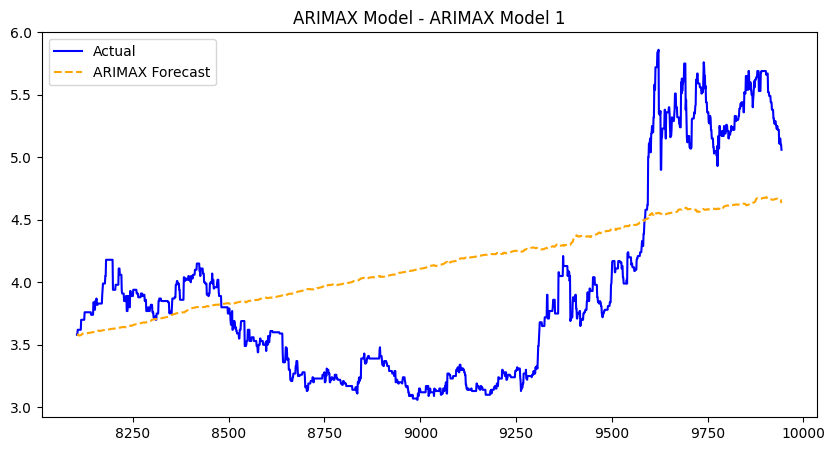

Running ARIMAX Model: ARIMAX Model 2...


c:\Users\gigan\AppData\Local\Programs\Python\Python313\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
c:\Users\gigan\AppData\Local\Programs\Python\Python313\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
c:\Users\gigan\AppData\Local\Programs\Python\Python313\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\Users\gigan\AppData\Local\Programs\Python\Python313\Lib\site-packages\statsmodels\tsa\base\tsa_model.p

Best ARIMA Order for ARIMAX Model 2: (2, 0, 0), MSE: 0.4729882539302971


c:\Users\gigan\AppData\Local\Programs\Python\Python313\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\Users\gigan\AppData\Local\Programs\Python\Python313\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:837: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
c:\Users\gigan\AppData\Local\Programs\Python\Python313\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\Users\gigan\AppData\Local\Programs\Python\Python313\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:837: FutureWarning: No supported index is available. In the n

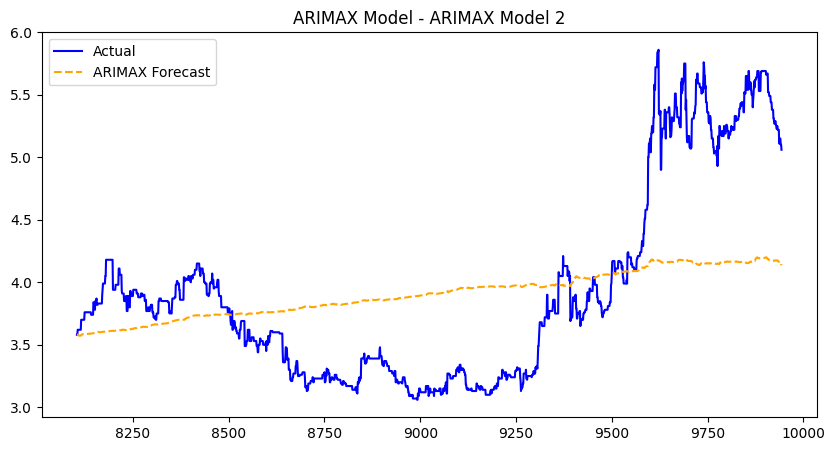


ARIMAX Model 1 MSE: 0.45352132521487737
ARIMAX Model 2 MSE: 0.4729882539302971


In [18]:
import pandas as pd
import numpy as np
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt

# Lagging function for exogenous variables
def lag_exogenous_variables(data, exogenous_vars, lag=1):
    """Lag specified exogenous variables by the given lag period."""
    lagged_data = data.copy()
    for var in exogenous_vars:
        if 'Lag' not in var:  # Skip already lagged variables
            lagged_data[f"{var}_Lag_{lag}"] = lagged_data[var].shift(lag)
    return lagged_data.dropna()  # Drop rows with NaN after lagging

# Define the first and second sets of exogenous variables
exogenous_vars_1 = ['CSSS_MA_3D', 'WTI_Price_MA_3D', 'USDBRLV1M', 'BRLBFIK1M25D']
exogenous_vars_2 = ['CSSS_ExpSmoothed', 'WTI_Price_ExpSmoothed_Lag_1D', 'BRLBFIK1M25D', 'USDBRLV1M']

# Lag exogenous variables
final_data = lag_exogenous_variables(final_data, exogenous_vars_1 + exogenous_vars_2, lag=1)

# Define train-test split
train_size = int(0.8 * len(final_data))
train_data = final_data.iloc[:train_size]
test_data = final_data.iloc[train_size:]

# Function to train and evaluate ARIMAX model
def run_arimax(train, test, target, exog_vars, model_name):
    """Train and evaluate an ARIMAX model."""
    print(f"Running ARIMAX Model: {model_name}...")
    # Extract train and test sets
    train_exog = train[exog_vars]
    test_exog = test[exog_vars]
    train_target = train[target]
    test_target = test[target]

    # Optimize ARIMA order
    best_order = None
    best_mse = float("inf")
    best_model = None

    for p in range(3):
        for d in range(2):
            for q in range(3):
                try:
                    model = SARIMAX(train_target, exog=train_exog, order=(p, d, q), enforce_stationarity=False, enforce_invertibility=False)
                    model_fit = model.fit(disp=False)
                    predictions = model_fit.predict(start=len(train_target), end=len(train_target) + len(test_target) - 1, exog=test_exog)
                    mse = mean_squared_error(test_target, predictions)
                    if mse < best_mse:
                        best_order = (p, d, q)
                        best_mse = mse
                        best_model = model_fit
                except Exception as e:
                    continue

    print(f"Best ARIMA Order for {model_name}: {best_order}, MSE: {best_mse}")

    # Forecast on test data
    predictions = best_model.predict(start=len(train_target), end=len(train_target) + len(test_target) - 1, exog=test_exog)

    # Plot actual vs predicted
    plt.figure(figsize=(10, 5))
    plt.plot(test.index, test_target, label='Actual', color='blue')
    plt.plot(test.index, predictions, label='ARIMAX Forecast', color='orange', linestyle='dashed')
    plt.title(f"ARIMAX Model - {model_name}")
    plt.legend()
    plt.show()

    return best_model, predictions, best_mse

# Run the first ARIMAX model
arimax1_model, arimax1_predictions, arimax1_mse = run_arimax(
    train_data, test_data, target='USDBRL', exog_vars=[f"{var}_Lag_1" if 'Lag' not in var else var for var in exogenous_vars_1], model_name="ARIMAX Model 1"
)

# Run the second ARIMAX model
arimax2_model, arimax2_predictions, arimax2_mse = run_arimax(
    train_data, test_data, target='USDBRL', exog_vars=[f"{var}_Lag_1" if 'Lag' not in var else var for var in exogenous_vars_2], model_name="ARIMAX Model 2"
)

# Results summary
print(f"\nARIMAX Model 1 MSE: {arimax1_mse}")
print(f"ARIMAX Model 2 MSE: {arimax2_mse}")


Running ARIMAX Model: ARIMAX Model 1...


c:\Users\gigan\AppData\Local\Programs\Python\Python313\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
c:\Users\gigan\AppData\Local\Programs\Python\Python313\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
c:\Users\gigan\AppData\Local\Programs\Python\Python313\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\Users\gigan\AppData\Local\Programs\Python\Python313\Lib\site-packages\statsmodels\tsa\base\tsa_model.p

Best ARIMA Order for ARIMAX Model 1: (1, 0, 1), MSE: 0.44992017633531245


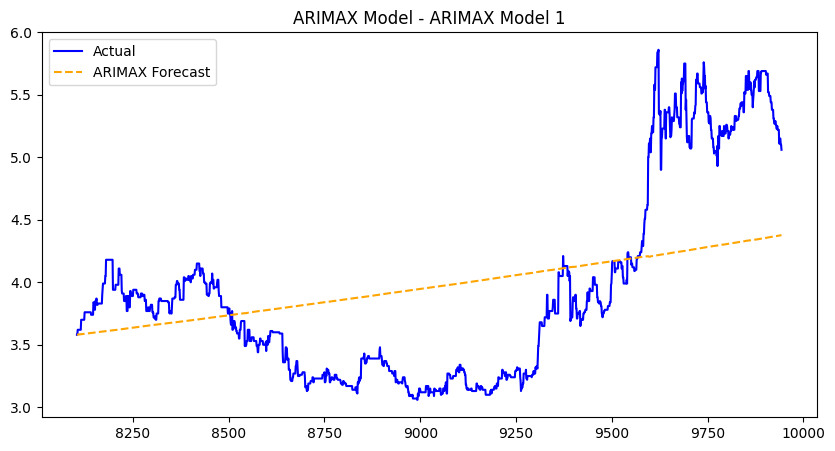

Running ARIMAX Model: ARIMAX Model 2...


c:\Users\gigan\AppData\Local\Programs\Python\Python313\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
c:\Users\gigan\AppData\Local\Programs\Python\Python313\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
c:\Users\gigan\AppData\Local\Programs\Python\Python313\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\Users\gigan\AppData\Local\Programs\Python\Python313\Lib\site-packages\statsmodels\tsa\base\tsa_model.p

Best ARIMA Order for ARIMAX Model 2: (1, 0, 1), MSE: 0.4708404846751753


c:\Users\gigan\AppData\Local\Programs\Python\Python313\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\Users\gigan\AppData\Local\Programs\Python\Python313\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:837: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
c:\Users\gigan\AppData\Local\Programs\Python\Python313\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\Users\gigan\AppData\Local\Programs\Python\Python313\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:837: FutureWarning: No supported index is available. In the n

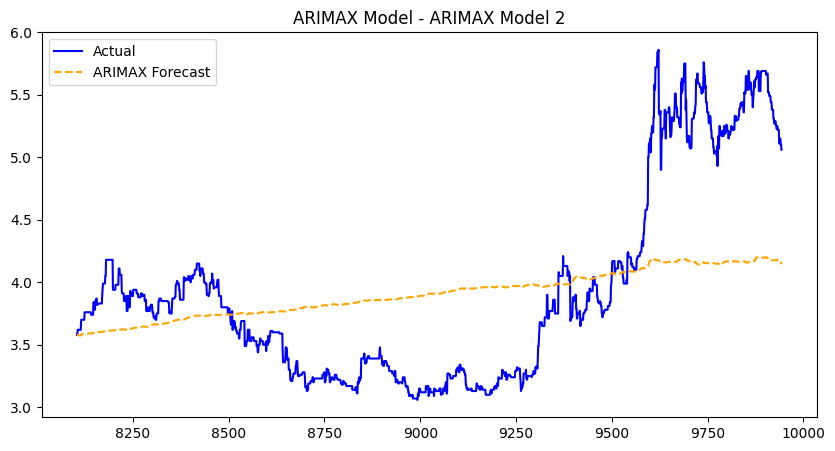


ARIMAX Model 1 MSE: 0.44992017633531245
ARIMAX Model 2 MSE: 0.4708404846751753


In [19]:
import pandas as pd
import numpy as np
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt

# Lagging function for exogenous variables
def lag_exogenous_variables(data, exogenous_vars, lag=1):
    """Lag specified exogenous variables by the given lag period."""
    lagged_data = data.copy()
    for var in exogenous_vars:
        if 'Lag' not in var:  # Skip already lagged variables
            lagged_data[f"{var}_Lag_{lag}"] = lagged_data[var].shift(lag)
    return lagged_data.dropna()  # Drop rows with NaN after lagging

# Define the first and second sets of exogenous variables
exogenous_vars_1 = ['CSSS_MA_3D', 'WTI_Price_MA_3D', 'USDBRLV1W', 'BRLBFIK1W25D']
exogenous_vars_2 = ['CSSS_ExpSmoothed', 'WTI_Price_ExpSmoothed_Lag_1D', 'BRLBFIK1W25D', 'USDBRLV1W']

# Lag exogenous variables
final_data = lag_exogenous_variables(final_data, exogenous_vars_1 + exogenous_vars_2, lag=1)

# Define train-test split
train_size = int(0.8 * len(final_data))
train_data = final_data.iloc[:train_size]
test_data = final_data.iloc[train_size:]

# Function to train and evaluate ARIMAX model
def run_arimax(train, test, target, exog_vars, model_name):
    """Train and evaluate an ARIMAX model."""
    print(f"Running ARIMAX Model: {model_name}...")
    # Extract train and test sets
    train_exog = train[exog_vars]
    test_exog = test[exog_vars]
    train_target = train[target]
    test_target = test[target]

    # Optimize ARIMA order
    best_order = None
    best_mse = float("inf")
    best_model = None

    for p in range(3):
        for d in range(2):
            for q in range(3):
                try:
                    model = SARIMAX(train_target, exog=train_exog, order=(p, d, q), enforce_stationarity=False, enforce_invertibility=False)
                    model_fit = model.fit(disp=False)
                    predictions = model_fit.predict(start=len(train_target), end=len(train_target) + len(test_target) - 1, exog=test_exog)
                    mse = mean_squared_error(test_target, predictions)
                    if mse < best_mse:
                        best_order = (p, d, q)
                        best_mse = mse
                        best_model = model_fit
                except Exception as e:
                    continue

    print(f"Best ARIMA Order for {model_name}: {best_order}, MSE: {best_mse}")

    # Forecast on test data
    predictions = best_model.predict(start=len(train_target), end=len(train_target) + len(test_target) - 1, exog=test_exog)

    # Plot actual vs predicted
    plt.figure(figsize=(10, 5))
    plt.plot(test.index, test_target, label='Actual', color='blue')
    plt.plot(test.index, predictions, label='ARIMAX Forecast', color='orange', linestyle='dashed')
    plt.title(f"ARIMAX Model - {model_name}")
    plt.legend()
    plt.show()

    return best_model, predictions, best_mse

# Run the first ARIMAX model
arimax1_model, arimax1_predictions, arimax1_mse = run_arimax(
    train_data, test_data, target='USDBRL', exog_vars=[f"{var}_Lag_1" if 'Lag' not in var else var for var in exogenous_vars_1], model_name="ARIMAX Model 1"
)

# Run the second ARIMAX model
arimax2_model, arimax2_predictions, arimax2_mse = run_arimax(
    train_data, test_data, target='USDBRL', exog_vars=[f"{var}_Lag_1" if 'Lag' not in var else var for var in exogenous_vars_2], model_name="ARIMAX Model 2"
)

# Results summary
print(f"\nARIMAX Model 1 MSE: {arimax1_mse}")
print(f"ARIMAX Model 2 MSE: {arimax2_mse}")


Running ARIMAX Model 1...
ARIMAX Model 1 MSE: 0.000102384160909778
Running ARIMAX Model 2...
ARIMAX Model 2 MSE: 0.00010217300307152392


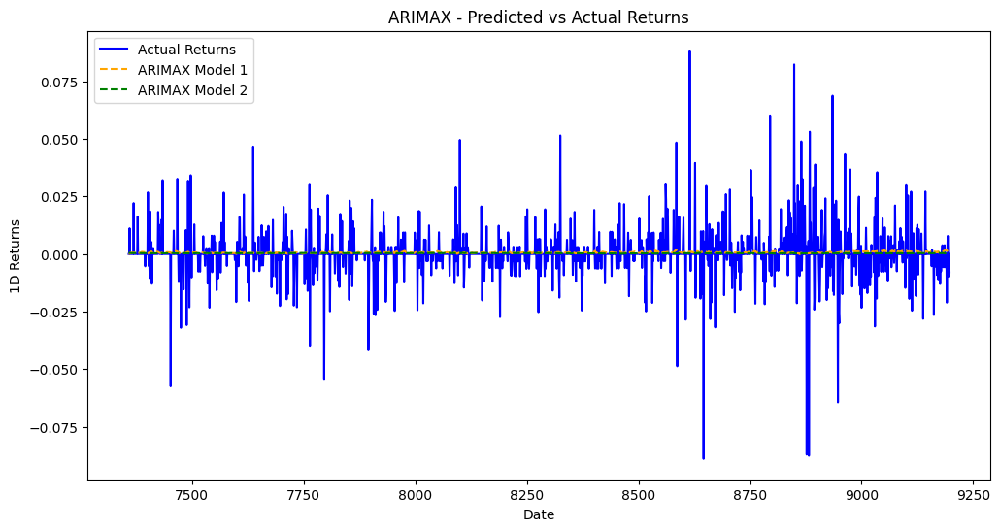

In [ ]:
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_squared_error
import numpy as np
import matplotlib.pyplot as plt

# Define a function to create lagged features only for specific variables
def create_lagged_features(data, features, lag=1):
    lagged_data = data.copy()
    for feature in features:
        lagged_data[f'{feature}_Lag_{lag}'] = lagged_data[feature].shift(lag)
    return lagged_data

# Define the ARIMAX model function
def arimax_model(train_data, test_data, target_column, exogenous_columns, order=(1, 1, 1)):
    """Fit ARIMAX model and return predictions and MSE."""
    # Drop NaN values resulting from lagging
    train_data = train_data.dropna()
    test_data = test_data.dropna()

    # Fit ARIMAX model
    model = SARIMAX(train_data[target_column],
                    exog=train_data[exogenous_columns],
                    order=order,
                    enforce_stationarity=False,
                    enforce_invertibility=False)
    results = model.fit(disp=False)

    # Forecast
    predictions = results.forecast(steps=len(test_data), exog=test_data[exogenous_columns])
    mse = mean_squared_error(test_data[target_column], predictions)
    return predictions, mse, results

# Specify which variables to lag (excluding already lagged variables like WTI_Price_ExpSmoothed_Lag_1D)
to_lag_1 = ['CSSS_MA_3D', 'WTI_Price_MA_3D', 'USDBRLV1M', 'BRLBFIK1M25D']
to_lag_2 = ['CSSS_ExpSmoothed', 'BRLBFIK1M25D', 'USDBRLV1M']  # WTI_Price_ExpSmoothed_Lag_1D is already lagged

# Add lagged features to the dataset
lag = 1
lagged_data_1 = create_lagged_features(final_data, to_lag_1, lag)
lagged_data_2 = create_lagged_features(final_data, to_lag_2, lag)

# Split the data into training and testing sets
train_size = int(0.8 * len(final_data))
train_data_1 = lagged_data_1.iloc[:train_size]
test_data_1 = lagged_data_1.iloc[train_size:]

train_data_2 = lagged_data_2.iloc[:train_size]
test_data_2 = lagged_data_2.iloc[train_size:]

# ARIMAX Model 1
print("Running ARIMAX Model 1...")
exogenous_columns_1 = [f'{col}_Lag_{lag}' if col != 'WTI_Price_ExpSmoothed_Lag_1D' else col for col in to_lag_1]
predictions_1, mse_1, results_1 = arimax_model(
    train_data_1, test_data_1, target_column='Return_1D', exogenous_columns=exogenous_columns_1
)
print(f"ARIMAX Model 1 MSE: {mse_1}")

# ARIMAX Model 2
print("Running ARIMAX Model 2...")
exogenous_columns_2 = [f'{col}_Lag_{lag}' if col != 'WTI_Price_ExpSmoothed_Lag_1D' else col for col in to_lag_2]
predictions_2, mse_2, results_2 = arimax_model(
    train_data_2, test_data_2, target_column='Return_1D', exogenous_columns=exogenous_columns_2
)
print(f"ARIMAX Model 2 MSE: {mse_2}")

# Plot predictions
plt.figure(figsize=(12, 6))
plt.plot(test_data_1['Return_1D'].index, test_data_1['Return_1D'], label="Actual Returns", color='blue')
plt.plot(test_data_1['Return_1D'].index, predictions_1, label="ARIMAX Model 1", color='orange', linestyle='--')
plt.plot(test_data_2['Return_1D'].index, predictions_2, label="ARIMAX Model 2", color='green', linestyle='--')
plt.title("ARIMAX - Predicted vs Actual Returns")
plt.xlabel("Date")
plt.ylabel("1D Returns")
plt.legend()
plt.show()


Running ARIMAX Model 1...
ARIMAX Model 1 MSE: 0.00013630017240808751
Running ARIMAX Model 2...
ARIMAX Model 2 MSE: 0.00010210190167112922


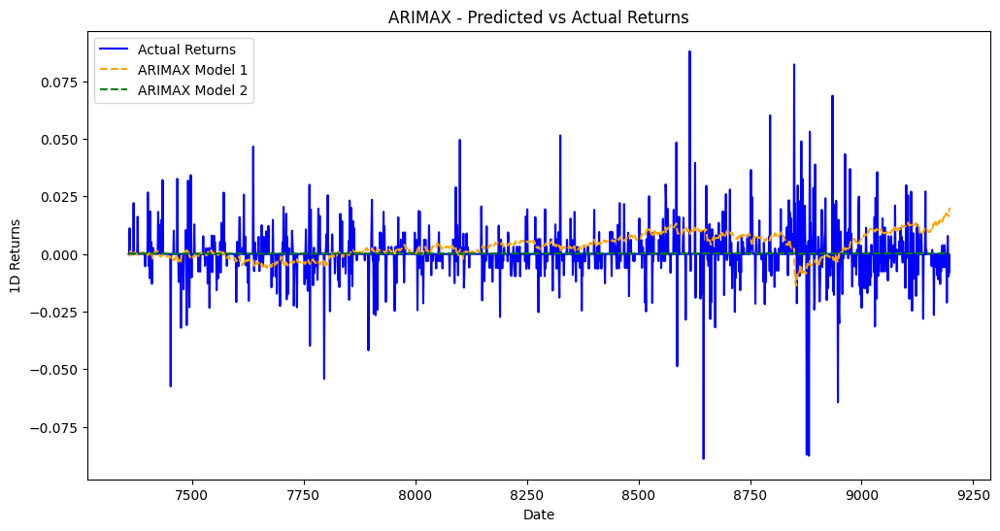

In [ ]:
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_squared_error
import numpy as np
import matplotlib.pyplot as plt

# Define a function to create lagged features only for specific variables
def create_lagged_features(data, features, lag=1):
    lagged_data = data.copy()
    for feature in features:
        lagged_data[f'{feature}_Lag_{lag}'] = lagged_data[feature].shift(lag)
    return lagged_data

# Define the ARIMAX model function
def arimax_model(train_data, test_data, target_column, exogenous_columns, order=(1, 1, 1)):
    """Fit ARIMAX model and return predictions and MSE."""
    # Drop NaN values resulting from lagging
    train_data = train_data.dropna()
    test_data = test_data.dropna()

    # Fit ARIMAX model
    model = SARIMAX(train_data[target_column],
                    exog=train_data[exogenous_columns],
                    order=order,
                    enforce_stationarity=False,
                    enforce_invertibility=False)
    results = model.fit(disp=False)

    # Forecast
    predictions = results.forecast(steps=len(test_data), exog=test_data[exogenous_columns])
    mse = mean_squared_error(test_data[target_column], predictions)
    return predictions, mse, results

# Specify which variables to lag (excluding already lagged variables like WTI_Price_ExpSmoothed_Lag_1D)
to_lag_1 = ['CSSS_MA_3D', 'WTI_Price_MA_3D', 'USDBRLV1W', 'BRLBFIK1W25D']
to_lag_2 = ['CSSS_ExpSmoothed', 'BRLBFIK1W25D', 'USDBRLV1W']  # WTI_Price_ExpSmoothed_Lag_1D is already lagged

# Add lagged features to the dataset
lag = 1
lagged_data_1 = create_lagged_features(final_data, to_lag_1, lag)
lagged_data_2 = create_lagged_features(final_data, to_lag_2, lag)

# Split the data into training and testing sets
train_size = int(0.8 * len(final_data))
train_data_1 = lagged_data_1.iloc[:train_size]
test_data_1 = lagged_data_1.iloc[train_size:]

train_data_2 = lagged_data_2.iloc[:train_size]
test_data_2 = lagged_data_2.iloc[train_size:]

# ARIMAX Model 1
print("Running ARIMAX Model 1...")
exogenous_columns_1 = [f'{col}_Lag_{lag}' if col != 'WTI_Price_ExpSmoothed_Lag_1D' else col for col in to_lag_1]
predictions_1, mse_1, results_1 = arimax_model(
    train_data_1, test_data_1, target_column='Return_1D', exogenous_columns=exogenous_columns_1
)
print(f"ARIMAX Model 1 MSE: {mse_1}")

# ARIMAX Model 2
print("Running ARIMAX Model 2...")
exogenous_columns_2 = [f'{col}_Lag_{lag}' if col != 'WTI_Price_ExpSmoothed_Lag_1D' else col for col in to_lag_2]
predictions_2, mse_2, results_2 = arimax_model(
    train_data_2, test_data_2, target_column='Return_1D', exogenous_columns=exogenous_columns_2
)
print(f"ARIMAX Model 2 MSE: {mse_2}")

# Plot predictions
plt.figure(figsize=(12, 6))
plt.plot(test_data_1['Return_1D'].index, test_data_1['Return_1D'], label="Actual Returns", color='blue')
plt.plot(test_data_1['Return_1D'].index, predictions_1, label="ARIMAX Model 1", color='orange', linestyle='--')
plt.plot(test_data_2['Return_1D'].index, predictions_2, label="ARIMAX Model 2", color='green', linestyle='--')
plt.title("ARIMAX - Predicted vs Actual Returns")
plt.xlabel("Date")
plt.ylabel("1D Returns")
plt.legend()
plt.show()


# Econometric Modeling

In [ ]:
import statsmodels.api as sm
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt

# Lag the necessary variables
final_data['USDBRL_Lag_1'] = final_data['USDBRL'].shift(1)
final_data['Return_1D_Lag_1'] = final_data['Return_1D'].shift(1)
final_data['CSSS_MA_3D_Lag_1'] = final_data['CSSS_MA_3D'].shift(1)
final_data['WTI_Price_MA_3D_Lag_1'] = final_data['WTI_Price_MA_3D'].shift(1)
final_data['USDBRLV1M_Lag_1'] = final_data['USDBRLV1M'].shift(1)
final_data['BRLBFIK1M25D_Lag_1'] = final_data['BRLBFIK1M25D'].shift(1)

# Drop NaN rows due to lagging
final_data = final_data.dropna()

# Define train-test split
train_size = int(0.8 * len(final_data))
train_data = final_data.iloc[:train_size]
test_data = final_data.iloc[train_size:]

# Define predictors for econometric models with lagged variables
predictors_currency = ['USDBRL_Lag_1', 'CSSS_MA_3D_Lag_1', 'WTI_Price_MA_3D_Lag_1', 'USDBRLV1M_Lag_1', 'BRLBFIK1M25D_Lag_1']
predictors_returns = ['Return_1D_Lag_1', 'CSSS_MA_3D_Lag_1', 'WTI_Price_MA_3D_Lag_1', 'USDBRLV1M_Lag_1', 'BRLBFIK1M25D_Lag_1']

# Econometric Model Function
def econometric_model(train_data, test_data, target_column, predictors, model_name):
    """Perform econometric modeling and return predictions and MSE."""
    # Split into predictors (X) and target (y)
    X_train = train_data[predictors]
    y_train = train_data[target_column]
    X_test = test_data[predictors]
    y_test = test_data[target_column]

    # Add constant for OLS regression
    X_train = sm.add_constant(X_train)
    X_test = sm.add_constant(X_test)

    # Fit OLS model
    model = sm.OLS(y_train, X_train).fit()
    predictions = model.predict(X_test)

    # Calculate MSE
    mse = mean_squared_error(y_test, predictions)

    # Print model summary
    print(f"\nEconometric Model: {model_name}")
    print(model.summary())

    # Plot Actual vs Predicted
    plt.figure(figsize=(10, 5))
    plt.plot(test_data.index, y_test, label='Actual', color='blue')
    plt.plot(test_data.index, predictions, label='Predicted', color='orange', linestyle='dashed')
    plt.title(f"Econometric Model - {model_name}")
    plt.legend()
    plt.show()

    return model, predictions, mse

# Run econometric model for USD/BRL
currency_model, currency_predictions, currency_mse = econometric_model(
    train_data, test_data, target_column='USDBRL', predictors=predictors_currency, model_name='Econometric Model (USD/BRL)'
)

# Run econometric model for 1D Returns
returns_model, returns_predictions, returns_mse = econometric_model(
    train_data, test_data, target_column='Return_1D', predictors=predictors_returns, model_name='Econometric Model (1D Returns)'
)

# Print MSE results
print(f"\nEconometric Modeling Results:")
print(f"USD/BRL MSE: {currency_mse}")
print(f"1D Returns MSE: {returns_mse}")


KeyboardInterrupt: 


Econometric Model: Econometric Model (USD/BRL)
                            OLS Regression Results                            
Dep. Variable:                 USDBRL   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.999
Method:                 Least Squares   F-statistic:                 1.209e+06
Date:                Tue, 03 Dec 2024   Prob (F-statistic):               0.00
Time:                        07:23:52   Log-Likelihood:                 21380.
No. Observations:                7355   AIC:                        -4.275e+04
Df Residuals:                    7349   BIC:                        -4.271e+04
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                            coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------

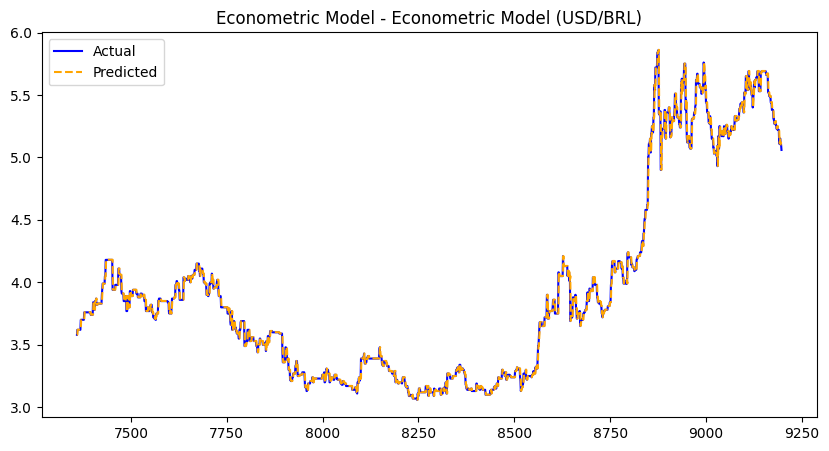


Econometric Model: Econometric Model (1D Returns)
                            OLS Regression Results                            
Dep. Variable:              Return_1D   R-squared:                       0.002
Model:                            OLS   Adj. R-squared:                  0.001
Method:                 Least Squares   F-statistic:                     2.265
Date:                Tue, 03 Dec 2024   Prob (F-statistic):             0.0455
Time:                        07:23:53   Log-Likelihood:                 27152.
No. Observations:                7355   AIC:                        -5.429e+04
Df Residuals:                    7349   BIC:                        -5.425e+04
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                            coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------

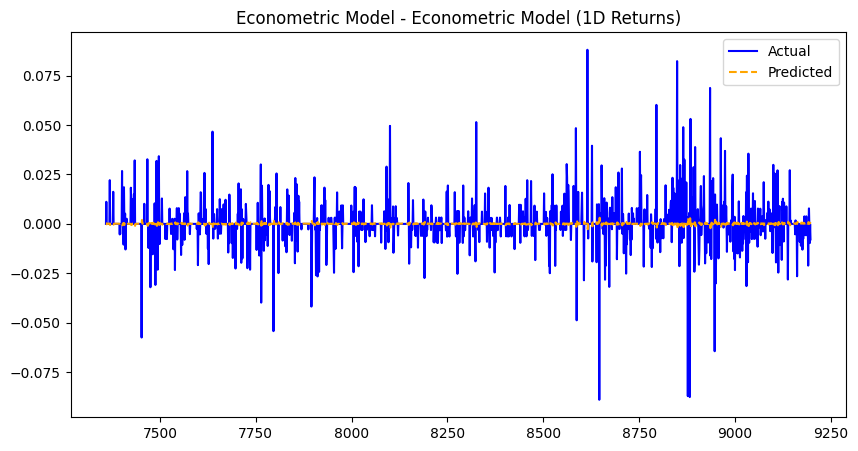


Econometric Modeling Results:
USD/BRL MSE: 0.001986157259688592
1D Returns MSE: 0.00010208739973524261


In [ ]:
import statsmodels.api as sm
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt

# Lag the necessary variables
final_data['USDBRL_Lag_1'] = final_data['USDBRL'].shift(1)
final_data['Return_1D_Lag_1'] = final_data['Return_1D'].shift(1)
final_data['CSSS_MA_3D_Lag_1'] = final_data['CSSS_MA_3D'].shift(1)
final_data['WTI_Price_MA_3D_Lag_1'] = final_data['WTI_Price_MA_3D'].shift(1)
final_data['USDBRLV1W_Lag_1'] = final_data['USDBRLV1W'].shift(1)
final_data['BRLBFIK1W25D_Lag_1'] = final_data['BRLBFIK1W25D'].shift(1)

# Drop NaN rows due to lagging
final_data = final_data.dropna()

# Define train-test split
train_size = int(0.8 * len(final_data))
train_data = final_data.iloc[:train_size]
test_data = final_data.iloc[train_size:]

# Define predictors for econometric models with lagged variables
predictors_currency = ['USDBRL_Lag_1', 'CSSS_MA_3D_Lag_1', 'WTI_Price_MA_3D_Lag_1', 'USDBRLV1W_Lag_1', 'BRLBFIK1W25D_Lag_1']
predictors_returns = ['Return_1D_Lag_1', 'CSSS_MA_3D_Lag_1', 'WTI_Price_MA_3D_Lag_1', 'USDBRLV1W_Lag_1', 'BRLBFIK1W25D_Lag_1']

# Econometric Model Function
def econometric_model(train_data, test_data, target_column, predictors, model_name):
    """Perform econometric modeling and return predictions and MSE."""
    # Split into predictors (X) and target (y)
    X_train = train_data[predictors]
    y_train = train_data[target_column]
    X_test = test_data[predictors]
    y_test = test_data[target_column]

    # Add constant for OLS regression
    X_train = sm.add_constant(X_train)
    X_test = sm.add_constant(X_test)

    # Fit OLS model
    model = sm.OLS(y_train, X_train).fit()
    predictions = model.predict(X_test)

    # Calculate MSE
    mse = mean_squared_error(y_test, predictions)

    # Print model summary
    print(f"\nEconometric Model: {model_name}")
    print(model.summary())

    # Plot Actual vs Predicted
    plt.figure(figsize=(10, 5))
    plt.plot(test_data.index, y_test, label='Actual', color='blue')
    plt.plot(test_data.index, predictions, label='Predicted', color='orange', linestyle='dashed')
    plt.title(f"Econometric Model - {model_name}")
    plt.legend()
    plt.show()

    return model, predictions, mse

# Run econometric model for USD/BRL
currency_model, currency_predictions, currency_mse = econometric_model(
    train_data, test_data, target_column='USDBRL', predictors=predictors_currency, model_name='Econometric Model (USD/BRL)'
)

# Run econometric model for 1D Returns
returns_model, returns_predictions, returns_mse = econometric_model(
    train_data, test_data, target_column='Return_1D', predictors=predictors_returns, model_name='Econometric Model (1D Returns)'
)

# Print MSE results
print(f"\nEconometric Modeling Results:")
print(f"USD/BRL MSE: {currency_mse}")
print(f"1D Returns MSE: {returns_mse}")



Econometric Model: Econometric Model 2 (USD/BRL)
                            OLS Regression Results                            
Dep. Variable:                 USDBRL   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.999
Method:                 Least Squares   F-statistic:                 1.209e+06
Date:                Tue, 03 Dec 2024   Prob (F-statistic):               0.00
Time:                        07:26:10   Log-Likelihood:                 21379.
No. Observations:                7355   AIC:                        -4.275e+04
Df Residuals:                    7349   BIC:                        -4.271e+04
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                                   coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------

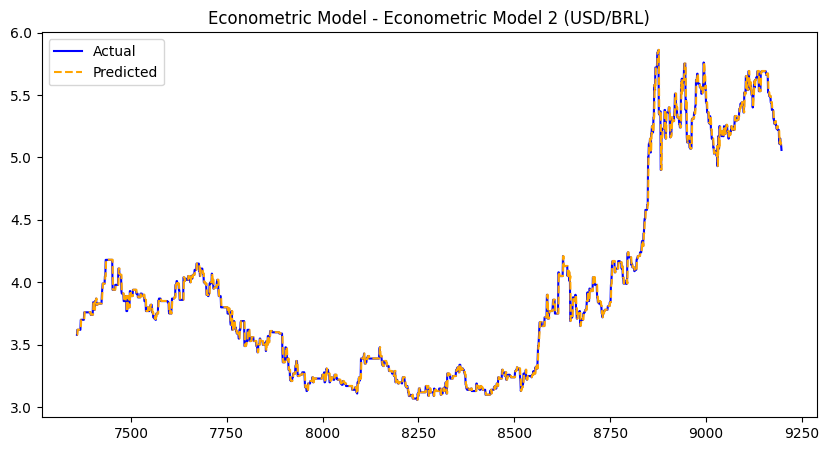


Econometric Model: Econometric Model 2 (1D Returns)
                            OLS Regression Results                            
Dep. Variable:              Return_1D   R-squared:                       0.001
Model:                            OLS   Adj. R-squared:                  0.001
Method:                 Least Squares   F-statistic:                     2.197
Date:                Tue, 03 Dec 2024   Prob (F-statistic):             0.0518
Time:                        07:26:11   Log-Likelihood:                 27151.
No. Observations:                7355   AIC:                        -5.429e+04
Df Residuals:                    7349   BIC:                        -5.425e+04
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                                   coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------

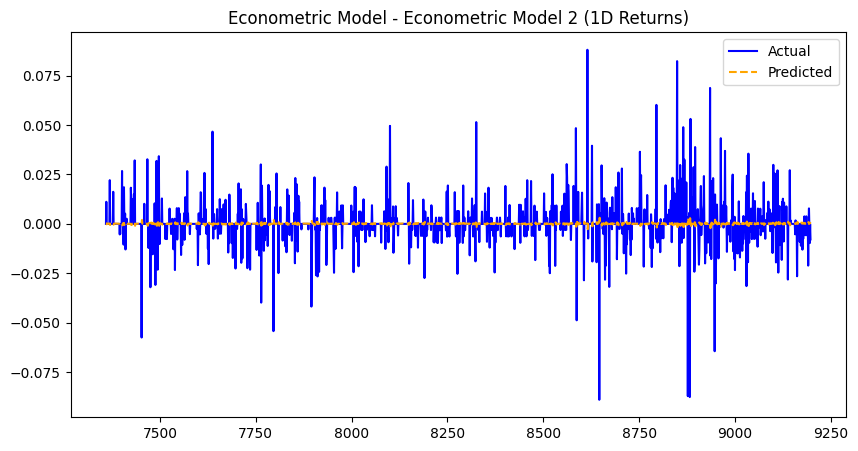


Econometric Modeling Results (Second Set of Predictors):
USD/BRL MSE (Model 2): 0.0019860399276762997
1D Returns MSE (Model 2): 0.00010207866174405672


In [ ]:
# Lag the necessary variables for the second set
final_data['CSSS_ExpSmoothed_Lag_1'] = final_data['CSSS_ExpSmoothed'].shift(1)
final_data['WTI_Price_ExpSmoothed_Lag_1'] = final_data['WTI_Price_ExpSmoothed_Lag_1D'].shift(1)
final_data['USDBRLV1W_Lag_1'] = final_data['USDBRLV1W'].shift(1)
final_data['BRLBFIK1W25D_Lag_1'] = final_data['BRLBFIK1W25D'].shift(1)

# Drop NaN rows due to lagging
final_data = final_data.dropna()

# Define predictors for the second econometric model
predictors_currency_second = ['USDBRL_Lag_1', 'CSSS_ExpSmoothed_Lag_1', 'WTI_Price_ExpSmoothed_Lag_1D', 'USDBRLV1W_Lag_1', 'BRLBFIK1W25D_Lag_1']
predictors_returns_second = ['Return_1D_Lag_1', 'CSSS_ExpSmoothed_Lag_1', 'WTI_Price_ExpSmoothed_Lag_1D', 'USDBRLV1W_Lag_1', 'BRLBFIK1W25D_Lag_1']

# Run econometric model for USD/BRL with the second set of predictors
currency_model_second, currency_predictions_second, currency_mse_second = econometric_model(
    train_data, test_data, target_column='USDBRL', predictors=predictors_currency_second, model_name='Econometric Model 2 (USD/BRL)'
)

# Run econometric model for 1D Returns with the second set of predictors
returns_model_second, returns_predictions_second, returns_mse_second = econometric_model(
    train_data, test_data, target_column='Return_1D', predictors=predictors_returns_second, model_name='Econometric Model 2 (1D Returns)'
)

# Print MSE results for the second set
print(f"\nEconometric Modeling Results (Second Set of Predictors):")
print(f"USD/BRL MSE (Model 2): {currency_mse_second}")
print(f"1D Returns MSE (Model 2): {returns_mse_second}")


In [ ]:
print(final_data[['USDBRL', 'USDBRL_Lag_1']].corr())


                USDBRL  USDBRL_Lag_1
USDBRL        1.000000      0.999672
USDBRL_Lag_1  0.999672      1.000000


Fitting Model 1: CSSS_MA_3D, WTI_Price_MA_3D, USDBRLV1M, BRLBFIK1M25D, USDBRL_Lag_7


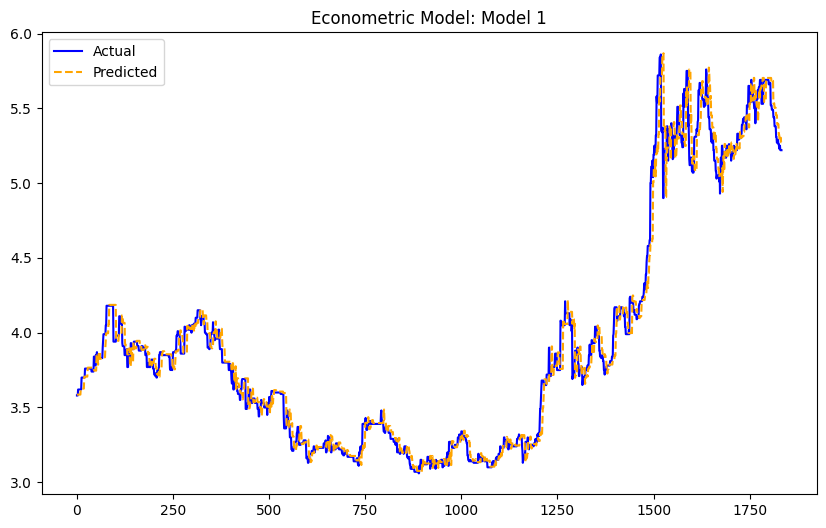

                            OLS Regression Results                            
Dep. Variable:                 USDBRL   R-squared:                       0.992
Model:                            OLS   Adj. R-squared:                  0.992
Method:                 Least Squares   F-statistic:                 1.802e+05
Date:                Tue, 03 Dec 2024   Prob (F-statistic):               0.00
Time:                        07:35:13   Log-Likelihood:                 14386.
No. Observations:                7336   AIC:                        -2.876e+04
Df Residuals:                    7330   BIC:                        -2.872e+04
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                    -0.00

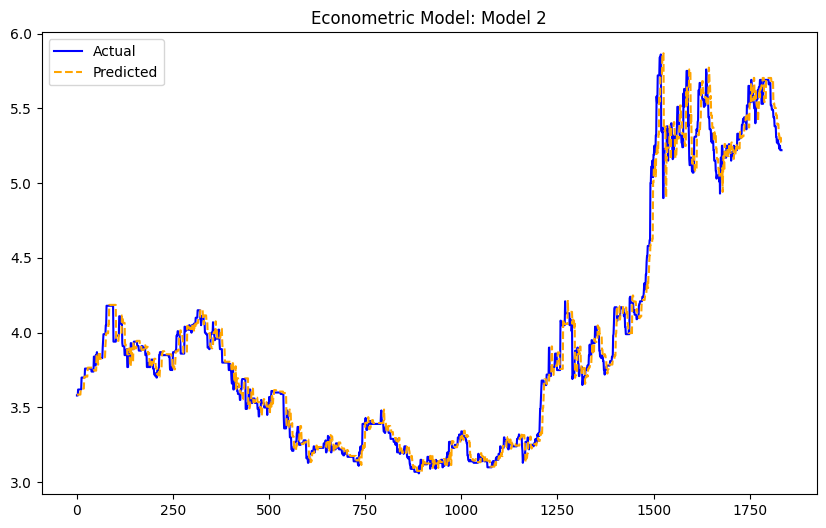

                            OLS Regression Results                            
Dep. Variable:                 USDBRL   R-squared:                       0.992
Model:                            OLS   Adj. R-squared:                  0.992
Method:                 Least Squares   F-statistic:                 1.802e+05
Date:                Tue, 03 Dec 2024   Prob (F-statistic):               0.00
Time:                        07:35:14   Log-Likelihood:                 14387.
No. Observations:                7336   AIC:                        -2.876e+04
Df Residuals:                    7330   BIC:                        -2.872e+04
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                                  coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
const             

In [ ]:
import statsmodels.api as sm
import matplotlib.pyplot as plt

# Include 7D lagged USD/BRL
final_data['USDBRL_Lag_7'] = final_data['USDBRL'].shift(7)

# Drop rows with NaN due to lagging
final_data = final_data.dropna()

# Define the predictors
predictors_model_1 = ['CSSS_MA_3D_Lag_7', 'WTI_Price_MA_3D_Lag_7', 'USDBRLV1M_Lag_7', 'BRLBFIK1M25D_Lag_7', 'USDBRL_Lag_7']
predictors_model_2 = ['CSSS_ExpSmoothed_Lag_7', 'WTI_Price_ExpSmoothed_Lag_7', 'BRLBFIK1M25D_Lag_7', 'USDBRLV1M_Lag_7', 'USDBRL_Lag_7']

# Define the target variable
target_column = 'USDBRL'

# Split the data into train and test sets (80-20 split)
train_size = int(0.8 * len(final_data))
train_data = final_data.iloc[:train_size]
test_data = final_data.iloc[train_size:]

# Function to fit and evaluate econometric models
def econometric_modeling(train_data, test_data, target_column, predictors, model_name):
    # Prepare the data
    X_train = train_data[predictors]
    y_train = train_data[target_column]
    X_test = test_data[predictors]
    y_test = test_data[target_column]

    # Add constant term for OLS regression
    X_train = sm.add_constant(X_train)
    X_test = sm.add_constant(X_test)

    # Fit the model
    model = sm.OLS(y_train, X_train).fit()

    # Generate predictions
    predictions = model.predict(X_test)

    # Plot the results
    plt.figure(figsize=(10, 6))
    plt.plot(test_data[target_column].values, label='Actual', color='blue')
    plt.plot(predictions.values, label='Predicted', linestyle='dashed', color='orange')
    plt.title(f"Econometric Model: {model_name}")
    plt.legend()
    plt.show()

    # Print the model summary
    print(model.summary())
    return model

# Fit and evaluate Model 1
print("Fitting Model 1: CSSS_MA_3D, WTI_Price_MA_3D, USDBRLV1M, BRLBFIK1M25D, USDBRL_Lag_7")
model_1 = econometric_modeling(train_data, test_data, target_column, predictors_model_1, "Model 1")

# Fit and evaluate Model 2
print("Fitting Model 2: CSSS_ExpSmoothed, WTI_Price_ExpSmoothed, BRLBFIK1M25D, USDBRLV1M, USDBRL_Lag_7")
model_2 = econometric_modeling(train_data, test_data, target_column, predictors_model_2, "Model 2")


In [ ]:
print(final_data[['USDBRL', 'USDBRL_Lag_7']].corr())

                USDBRL  USDBRL_Lag_7
USDBRL        1.000000      0.997829
USDBRL_Lag_7  0.997829      1.000000


Fitting Model 1: CSSS_MA_3D, WTI_Price_MA_3D, USDBRLV1M, BRLBFIK1M25D, USDBRL_Lag_30


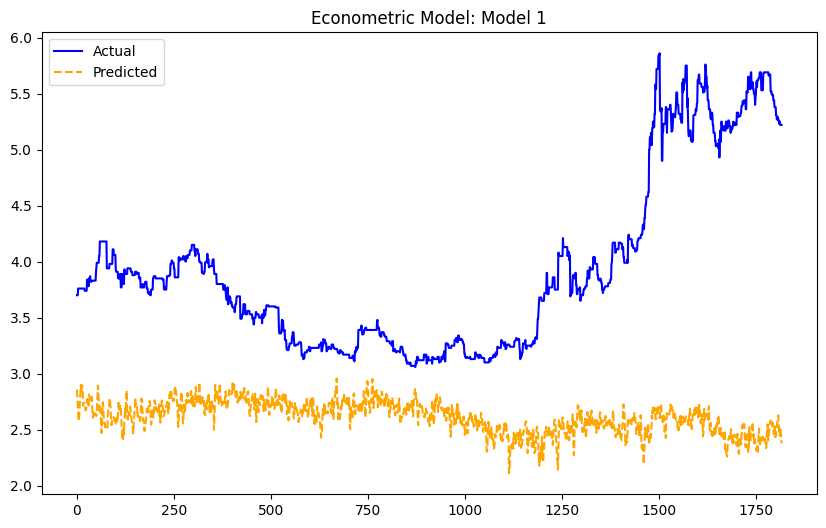

                            OLS Regression Results                            
Dep. Variable:                 USDBRL   R-squared:                       0.507
Model:                            OLS   Adj. R-squared:                  0.507
Method:                 Least Squares   F-statistic:                     1868.
Date:                Tue, 03 Dec 2024   Prob (F-statistic):               0.00
Time:                        07:45:18   Log-Likelihood:                -879.05
No. Observations:                7264   AIC:                             1768.
Df Residuals:                    7259   BIC:                             1803.
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      3

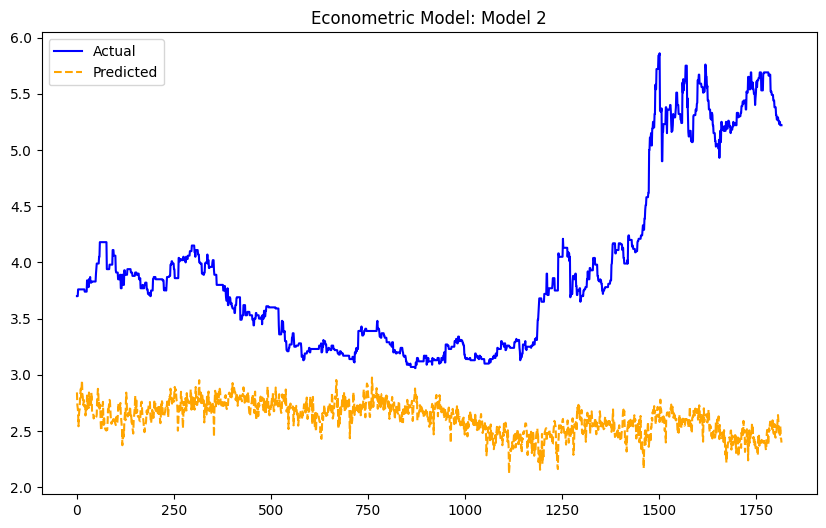

                            OLS Regression Results                            
Dep. Variable:                 USDBRL   R-squared:                       0.509
Model:                            OLS   Adj. R-squared:                  0.508
Method:                 Least Squares   F-statistic:                     1879.
Date:                Tue, 03 Dec 2024   Prob (F-statistic):               0.00
Time:                        07:45:19   Log-Likelihood:                -868.34
No. Observations:                7264   AIC:                             1747.
Df Residuals:                    7259   BIC:                             1781.
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                                   coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------
const           

In [ ]:
import statsmodels.api as sm
import matplotlib.pyplot as plt

# Create lagged variables
lags = 30
final_data['CSSS_MA_3D_Lag_30'] = final_data['CSSS_MA_3D'].shift(lags)
final_data['WTI_Price_MA_3D_Lag_30'] = final_data['WTI_Price_MA_3D'].shift(lags)
final_data['USDBRLV1M_Lag_30'] = final_data['USDBRLV1M'].shift(lags)
final_data['BRLBFIK1M25D_Lag_30'] = final_data['BRLBFIK1M25D'].shift(lags)
final_data['CSSS_ExpSmoothed_Lag_30'] = final_data['CSSS_ExpSmoothed'].shift(lags)
final_data['WTI_Price_ExpSmoothed_Lag_30'] = final_data['WTI_Price_ExpSmoothed_Lag_1D'].shift(29)
final_data['USDBRL_Lag_30'] = final_data['USDBRL'].shift(lags)

# Drop rows with NaN due to lagging
final_data = final_data.dropna()

# Define the predictors
predictors_model_1 = ['CSSS_MA_3D_Lag_30', 'WTI_Price_MA_3D_Lag_30', 'USDBRLV1M_Lag_30', 'BRLBFIK1M25D_Lag_30','USDBRL_Lag_30']
predictors_model_2 = ['CSSS_ExpSmoothed_Lag_30', 'WTI_Price_ExpSmoothed_Lag_30', 'BRLBFIK1M25D_Lag_30', 'USDBRLV1M_Lag_30','USDBRL_Lag_30']

# Define the target variable
target_column = 'USDBRL'

# Split the data into train and test sets (80-20 split)
train_size = int(0.8 * len(final_data))
train_data = final_data.iloc[:train_size]
test_data = final_data.iloc[train_size:]

# Function to fit and evaluate econometric models
def econometric_modeling(train_data, test_data, target_column, predictors, model_name):
    # Prepare the data
    X_train = train_data[predictors]
    y_train = train_data[target_column]
    X_test = test_data[predictors]
    y_test = test_data[target_column]

    # Add constant term for OLS regression
    X_train = sm.add_constant(X_train)
    X_test = sm.add_constant(X_test)

    # Fit the model
    model = sm.OLS(y_train, X_train).fit()

    # Generate predictions
    predictions = model.predict(X_test)

    # Plot the results
    plt.figure(figsize=(10, 6))
    plt.plot(test_data[target_column].values, label='Actual', color='blue')
    plt.plot(predictions.values, label='Predicted', linestyle='dashed', color='orange')
    plt.title(f"Econometric Model: {model_name}")
    plt.legend()
    plt.show()

    # Print the model summary
    print(model.summary())
    return model

# Fit and evaluate Model 1
print("Fitting Model 1: CSSS_MA_3D, WTI_Price_MA_3D, USDBRLV1M, BRLBFIK1M25D, USDBRL_Lag_30")
model_1 = econometric_modeling(train_data, test_data, target_column, predictors_model_1, "Model 1")

# Fit and evaluate Model 2
print("Fitting Model 2: CSSS_ExpSmoothed, WTI_Price_ExpSmoothed, BRLBFIK1M25D, USDBRLV1M, USDBRL_Lag_30")
model_2 = econometric_modeling(train_data, test_data, target_column, predictors_model_2, "Model 2")


Fitting Model 1: CSSS_MA_3D, WTI_Price_MA_3D, USDBRLV1M, BRLBFIK1M25D, Return_30D_Lag_30


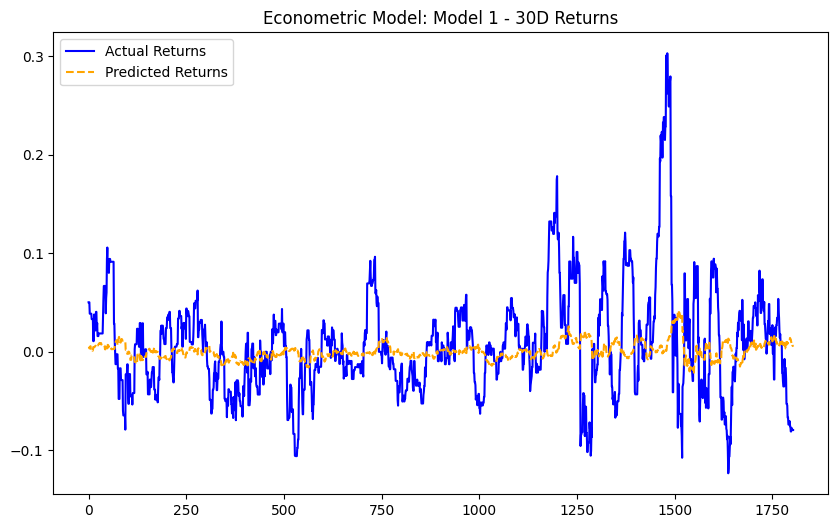

                            OLS Regression Results                            
Dep. Variable:             Return_30D   R-squared:                       0.062
Model:                            OLS   Adj. R-squared:                  0.061
Method:                 Least Squares   F-statistic:                     95.48
Date:                Tue, 03 Dec 2024   Prob (F-statistic):           1.06e-97
Time:                        07:50:17   Log-Likelihood:                 14805.
No. Observations:                7216   AIC:                        -2.960e+04
Df Residuals:                    7210   BIC:                        -2.956e+04
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                     -0

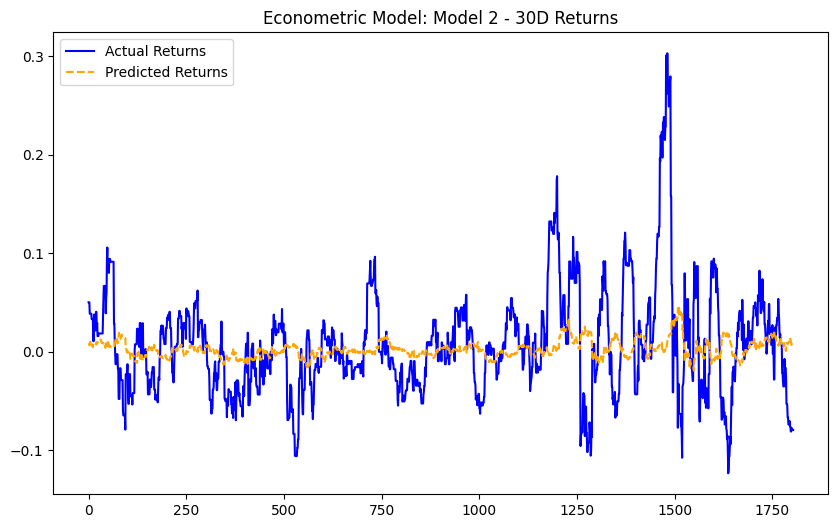

                            OLS Regression Results                            
Dep. Variable:             Return_30D   R-squared:                       0.054
Model:                            OLS   Adj. R-squared:                  0.053
Method:                 Least Squares   F-statistic:                     81.67
Date:                Tue, 03 Dec 2024   Prob (F-statistic):           1.13e-83
Time:                        07:50:18   Log-Likelihood:                 14773.
No. Observations:                7216   AIC:                        -2.953e+04
Df Residuals:                    7210   BIC:                        -2.949e+04
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                                   coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------
const           

In [ ]:
import statsmodels.api as sm
import matplotlib.pyplot as plt

# Compute 30-day returns
final_data['Return_30D'] = final_data['USDBRL'].shift(-30) / final_data['USDBRL'] - 1


# Include 30D lagged return
final_data['Return_30D_Lag_30'] = final_data['Return_30D'].shift(30)

# Drop rows with NaN due to lagging
final_data = final_data.dropna()

# Define the predictors
predictors_model_1 = ['CSSS_MA_3D_Lag_30', 'WTI_Price_MA_3D_Lag_30', 'USDBRLV1M_Lag_30', 'BRLBFIK1M25D_Lag_30', 'Return_30D_Lag_30']
predictors_model_2 = ['CSSS_ExpSmoothed_Lag_30', 'WTI_Price_ExpSmoothed_Lag_1D', 'BRLBFIK1M25D_Lag_30', 'USDBRLV1M_Lag_30', 'Return_30D_Lag_30']

# Define the target variable
target_column = 'Return_30D'

# Split the data into train and test sets (80-20 split)
train_size = int(0.8 * len(final_data))
train_data = final_data.iloc[:train_size]
test_data = final_data.iloc[train_size:]

# Function to fit and evaluate econometric models
def econometric_modeling(train_data, test_data, target_column, predictors, model_name):
    # Prepare the data
    X_train = train_data[predictors]
    y_train = train_data[target_column]
    X_test = test_data[predictors]
    y_test = test_data[target_column]

    # Add constant term for OLS regression
    X_train = sm.add_constant(X_train)
    X_test = sm.add_constant(X_test)

    # Fit the model
    model = sm.OLS(y_train, X_train).fit()

    # Generate predictions
    predictions = model.predict(X_test)

    # Plot the results
    plt.figure(figsize=(10, 6))
    plt.plot(test_data[target_column].values, label='Actual Returns', color='blue')
    plt.plot(predictions.values, label='Predicted Returns', linestyle='dashed', color='orange')
    plt.title(f"Econometric Model: {model_name} - 30D Returns")
    plt.legend()
    plt.show()

    # Print the model summary
    print(model.summary())
    return model

# Fit and evaluate Model 1
print("Fitting Model 1: CSSS_MA_3D, WTI_Price_MA_3D, USDBRLV1M, BRLBFIK1M25D, Return_30D_Lag_30")
model_1 = econometric_modeling(train_data, test_data, target_column, predictors_model_1, "Model 1")

# Fit and evaluate Model 2
print("Fitting Model 2: CSSS_ExpSmoothed, WTI_Price_ExpSmoothed, BRLBFIK1M25D, USDBRLV1M, Return_30D_Lag_30")
model_2 = econometric_modeling(train_data, test_data, target_column, predictors_model_2, "Model 2")


# Logistic Regression (5% crash)


Selected Features:
['CSSS_MA_3M', 'WTI_Price_MA_3M', 'Interest_Rate_Diff_MA_3M', 'USDBRLV3M', 'USDBRLV1M', 'USDBRLV1Y', 'BRLBFIK1Y25D', 'BRLBFIK6M25D', 'BRLBFIK3M25D', 'BRLRRIS3M25D']

Logistic Regression Coefficients:
                    Variable  Coefficient
0                  Intercept     0.305179
1                 CSSS_MA_3M    -6.512117
2            WTI_Price_MA_3M     0.013683
3   Interest_Rate_Diff_MA_3M    -0.033377
4                  USDBRLV3M    -0.930057
5                  USDBRLV1M     0.464564
6                  USDBRLV1Y     0.443436
7               BRLBFIK1Y25D     1.234549
8               BRLBFIK6M25D    -1.405530
9               BRLBFIK3M25D    -0.567525
10              BRLRRIS3M25D     0.014720

Accuracy: 0.7038043478260869

Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.69      0.80      1556
           1       0.32      0.80      0.45       284

    accuracy                           0.70      1840
   m

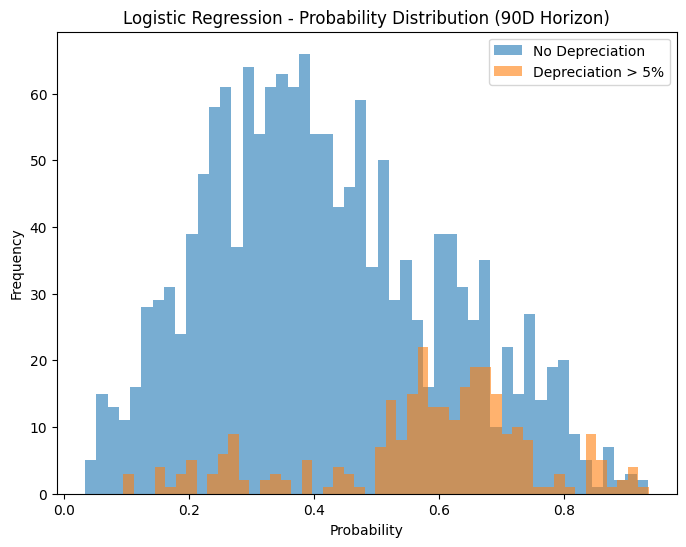

In [ ]:
 from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, roc_auc_score, confusion_matrix
from imblearn.over_sampling import SMOTE
import matplotlib.pyplot as plt
import pandas as pd

# Define the predictors and target
all_predictors = [
    'CSSS_MA_3M',
    'WTI_Price_MA_3M',
    'Interest_Rate_Diff_MA_3M',
    'USDBRLV3M', 'USDBRLV1M', 'USDBRLV1Y', 'BRLBFIK1Y25D',
    'BRLBFIK6M25D', 'BRLBFIK3M25D','BRLRRIS3M25D'
]
target = 'Depreciate_5pct_90D'
final_data = pd.read_csv("/content/drive/My Drive/Sentiment Brazil Score/all_data.csv")
# Ensure the dataset is sorted and target variable is created
final_data = final_data.sort_index()

# Compute returns and create the target variable
final_data['Return_90D'] = final_data['USDBRL'].shift(-90) / final_data['USDBRL'] - 1
final_data['Depreciate_5pct_90D'] = (final_data['Return_90D'] > 0.05).astype(int)

# Drop rows with NaN (from shift operations)
final_data = final_data.dropna()

# Split data into train and test sets
X = final_data[all_predictors]
y = final_data[target]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Apply SMOTE to balance the training data
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

# Feature Selection with Recursive Feature Elimination (RFE)
logistic = LogisticRegression(max_iter=1000, random_state=42)
rfe = RFE(logistic, n_features_to_select=10)  # Select the top 5 features
rfe.fit(X_train_smote, y_train_smote)

# Get selected features
selected_features = X_train.columns[rfe.support_].tolist()
print("\nSelected Features:")
print(selected_features)

# Train Logistic Regression with Selected Features
X_train_selected = X_train_smote[selected_features]
X_test_selected = X_test[selected_features]

model = LogisticRegression(max_iter=1000, random_state=42)
model.fit(X_train_selected, y_train_smote)

# Get variable coefficients
coefficients = pd.DataFrame({'Variable': ['Intercept'] + selected_features, 'Coefficient': [model.intercept_[0]] + list(model.coef_[0])})
print("\nLogistic Regression Coefficients:")
print(coefficients)

# Make predictions
probabilities = model.predict_proba(X_test_selected)[:, 1]
predictions = (probabilities > 0.5).astype(int)

# Evaluate the model
accuracy = model.score(X_test_selected, y_test)
roc_auc = roc_auc_score(y_test, probabilities)
report = classification_report(y_test, predictions)
cm = confusion_matrix(y_test, predictions)

# Print results
print(f"\nAccuracy: {accuracy}")
print("\nClassification Report:")
print(report)
print(f"\nROC-AUC: {roc_auc}")
print("\nConfusion Matrix:")
print(cm)

# Plot probabilities
plt.figure(figsize=(8, 6))
plt.hist(probabilities[y_test == 0], bins=50, alpha=0.6, label='No Depreciation')
plt.hist(probabilities[y_test == 1], bins=50, alpha=0.6, label='Depreciation > 5%')
plt.title("Logistic Regression - Probability Distribution (90D Horizon)")
plt.xlabel('Probability')
plt.ylabel('Frequency')
plt.legend()
plt.show()


In [ ]:
import numpy as np
from ipywidgets import interact, FloatSlider

# Interactive threshold evaluation function
def evaluate_threshold(threshold):
    # Convert probabilities into predictions based on the threshold
    predictions = (probabilities >= threshold).astype(int)

    # Calculate confusion matrix
    cm = confusion_matrix(y_test, predictions)

    # Calculate metrics
    accuracy = np.mean(predictions == y_test)
    roc_auc = roc_auc_score(y_test, probabilities)
    report = classification_report(y_test, predictions, target_names=["No Depreciation", "Depreciation"])

    # Print the confusion matrix and metrics
    print(f"Threshold: {threshold:.2f}")
    print("\nConfusion Matrix:")
    print(cm)
    print("\nClassification Report:")
    print(report)
    print(f"ROC-AUC: {roc_auc:.4f}")

    # Plot confusion matrix
    plt.figure(figsize=(6, 5))
    plt.matshow(cm, cmap='coolwarm', fignum=1)
    plt.title('Confusion Matrix', pad=20)
    plt.colorbar()
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.xticks([0, 1], ['No Depreciation', 'Depreciation'])
    plt.yticks([0, 1], ['No Depreciation', 'Depreciation'])
    for (i, j), value in np.ndenumerate(cm):
        plt.text(j, i, f'{value}', ha='center', va='center', color='white' if value > cm.max()/2 else 'black')
    plt.show()

# Interactive widget to choose threshold
interact(evaluate_threshold, threshold=FloatSlider(value=0.5, min=0.0, max=1.0, step=0.01, description='Threshold'));


interactive(children=(FloatSlider(value=0.5, description='Threshold', max=1.0, step=0.01), Output()), _dom_cla…

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _c


Selected Features:
['CSSS_MA_6M', 'FSS_MA_6M', 'Interest_Rate_Diff_MA_3M', 'Interest_Rate_Diff_MA_6M', 'BRLBFIK1Y25D', 'BRLBFIK3M25D', 'BRLBFIK1M25D', 'BRLRRIS6M25D', 'BRLRRIS3M25D', 'BRLRRIS1M25D']

Logistic Regression Coefficients:
                    Variable  Coefficient
0                  Intercept     0.335781
1                 CSSS_MA_6M    -3.317944
2                  FSS_MA_6M     4.855326
3   Interest_Rate_Diff_MA_3M    -0.809466
4   Interest_Rate_Diff_MA_6M     0.917905
5               BRLBFIK1Y25D     1.669285
6               BRLBFIK3M25D    -0.656064
7               BRLBFIK1M25D    -0.689653
8               BRLRRIS6M25D    -7.359904
9               BRLRRIS3M25D     5.687591
10              BRLRRIS1M25D    -0.609101

Accuracy: 0.654891304347826

Classification Report:
              precision    recall  f1-score   support

           0       0.86      0.65      0.74      1408
           1       0.37      0.66      0.47       432

    accuracy                           0.65 

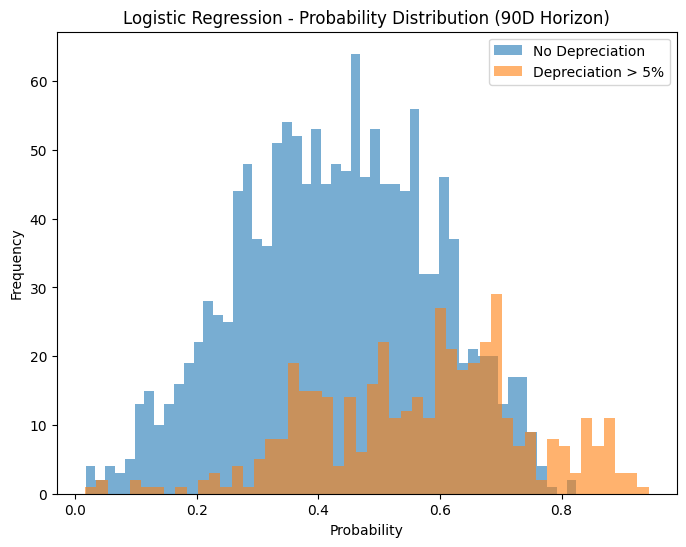

In [ ]:
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, roc_auc_score, confusion_matrix
from imblearn.over_sampling import SMOTE
import matplotlib.pyplot as plt
import pandas as pd

# Define the predictors and target
all_predictors = [
    'CSSS_MA_6M', 'FSS_MA_6M',
    'WTI_Price_MA_3M', 'WTI_Price_MA_6M', 'WTI_Price_MA_1M',
    'Interest_Rate_Diff_MA_3M', 'Interest_Rate_Diff_MA_6M',
    'USDBRLV6M', 'USDBRLV3M', 'USDBRLV1M', 'USDBRLV1Y', 'BRLBFIK1Y25D',
    'BRLBFIK6M25D', 'BRLBFIK3M25D', 'BRLBFIK1M25D', 'BRLRRIS1Y25D',
    'BRLRRIS6M25D', 'BRLRRIS3M25D', 'BRLRRIS1M25D'
]
target = 'Depreciate_5pct_180D'
final_data = pd.read_csv("/content/drive/My Drive/Sentiment Brazil Score/all_data.csv")
# Ensure the dataset is sorted and target variable is created
final_data = final_data.sort_index()

# Compute returns and create the target variable
final_data['Return_180D'] = final_data['USDBRL'].shift(-180) / final_data['USDBRL'] - 1
final_data['Depreciate_5pct_180D'] = (final_data['Return_180D']  > 0.05).astype(int)

# Drop rows with NaN (from shift operations)
final_data = final_data.dropna()

# Split data into train and test sets
X = final_data[all_predictors]
y = final_data[target]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Apply SMOTE to balance the training data
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

# Feature Selection with Recursive Feature Elimination (RFE)
logistic = LogisticRegression(max_iter=1000, random_state=42)
rfe = RFE(logistic, n_features_to_select=10)  # Select the top 5 features
rfe.fit(X_train_smote, y_train_smote)

# Get selected features
selected_features = X_train.columns[rfe.support_].tolist()
print("\nSelected Features:")
print(selected_features)

# Train Logistic Regression with Selected Features
X_train_selected = X_train_smote[selected_features]
X_test_selected = X_test[selected_features]

model = LogisticRegression(max_iter=1000, random_state=42)
model.fit(X_train_selected, y_train_smote)

# Get variable coefficients
coefficients = pd.DataFrame({'Variable': ['Intercept'] + selected_features, 'Coefficient': [model.intercept_[0]] + list(model.coef_[0])})
print("\nLogistic Regression Coefficients:")
print(coefficients)

# Make predictions
probabilities = model.predict_proba(X_test_selected)[:, 1]
predictions = (probabilities > 0.5).astype(int)

# Evaluate the model
accuracy = model.score(X_test_selected, y_test)
roc_auc = roc_auc_score(y_test, probabilities)
report = classification_report(y_test, predictions)
cm = confusion_matrix(y_test, predictions)

# Print results
print(f"\nAccuracy: {accuracy}")
print("\nClassification Report:")
print(report)
print(f"\nROC-AUC: {roc_auc}")
print("\nConfusion Matrix:")
print(cm)

# Plot probabilities
plt.figure(figsize=(8, 6))
plt.hist(probabilities[y_test == 0], bins=50, alpha=0.6, label='No Depreciation')
plt.hist(probabilities[y_test == 1], bins=50, alpha=0.6, label='Depreciation > 5%')
plt.title("Logistic Regression - Probability Distribution (90D Horizon)")
plt.xlabel('Probability')
plt.ylabel('Frequency')
plt.legend()
plt.show()


In [ ]:
import numpy as np
from ipywidgets import interact, FloatSlider

# Interactive threshold evaluation function
def evaluate_threshold(threshold):
    # Convert probabilities into predictions based on the threshold
    predictions = (probabilities >= threshold).astype(int)

    # Calculate confusion matrix
    cm = confusion_matrix(y_test, predictions)

    # Calculate metrics
    accuracy = np.mean(predictions == y_test)
    roc_auc = roc_auc_score(y_test, probabilities)
    report = classification_report(y_test, predictions, target_names=["No Depreciation", "Depreciation"])

    # Print the confusion matrix and metrics
    print(f"Threshold: {threshold:.2f}")
    print("\nConfusion Matrix:")
    print(cm)
    print("\nClassification Report:")
    print(report)
    print(f"ROC-AUC: {roc_auc:.4f}")

    # Plot confusion matrix
    plt.figure(figsize=(6, 5))
    plt.matshow(cm, cmap='coolwarm', fignum=1)
    plt.title('Confusion Matrix', pad=20)
    plt.colorbar()
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.xticks([0, 1], ['No Depreciation', 'Depreciation'])
    plt.yticks([0, 1], ['No Depreciation', 'Depreciation'])
    for (i, j), value in np.ndenumerate(cm):
        plt.text(j, i, f'{value}', ha='center', va='center', color='white' if value > cm.max()/2 else 'black')
    plt.show()

# Interactive widget to choose threshold
interact(evaluate_threshold, threshold=FloatSlider(value=0.5, min=0.0, max=1.0, step=0.01, description='Threshold'));


interactive(children=(FloatSlider(value=0.5, description='Threshold', max=1.0, step=0.01), Output()), _dom_cla…

# Logistic Regression (10% Crash)


Selected Features:
['CSSS_MA_3M', 'WTI_Price_MA_3M', 'Interest_Rate_Diff_MA_3M', 'USDBRLV3M', 'USDBRLV1M', 'USDBRLV1Y', 'BRLBFIK1Y25D', 'BRLBFIK6M25D', 'BRLBFIK3M25D', 'BRLRRIS3M25D']

Logistic Regression Coefficients:
                    Variable  Coefficient
0                  Intercept     1.866227
1                 CSSS_MA_3M   -12.054025
2            WTI_Price_MA_3M     0.022710
3   Interest_Rate_Diff_MA_3M    -0.052270
4                  USDBRLV3M    -1.825340
5                  USDBRLV1M     0.878977
6                  USDBRLV1Y     0.863153
7               BRLBFIK1Y25D     1.519052
8               BRLBFIK6M25D    -3.579496
9               BRLBFIK3M25D     0.882959
10              BRLRRIS3M25D    -0.458118

Accuracy: 0.741304347826087

Classification Report:
              precision    recall  f1-score   support

           0       0.99      0.74      0.84      1739
           1       0.15      0.82      0.26       101

    accuracy                           0.74      1840
   ma

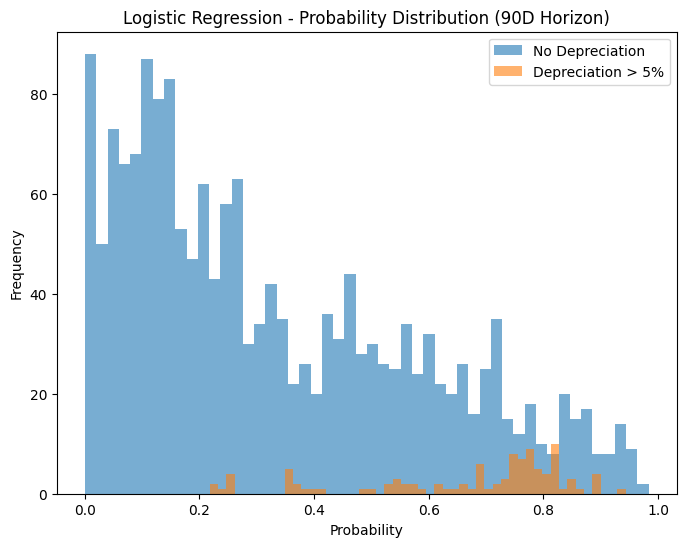

In [ ]:
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, roc_auc_score, confusion_matrix
from imblearn.over_sampling import SMOTE
import matplotlib.pyplot as plt
import pandas as pd

final_data = pd.read_csv("/content/drive/My Drive/Sentiment Brazil Score/all_data.csv")

# Define the predictors and target
all_predictors = [
    'CSSS_MA_3M',
    'WTI_Price_MA_3M',
    'Interest_Rate_Diff_MA_3M',
    'USDBRLV3M', 'USDBRLV1M', 'USDBRLV1Y', 'BRLBFIK1Y25D',
    'BRLBFIK6M25D', 'BRLBFIK3M25D','BRLRRIS3M25D'
]
target = 'Depreciate_10pct_90D'

# Ensure the dataset is sorted and target variable is created
final_data = final_data.sort_index()

# Compute returns and create the target variable
final_data['Return_90D'] = final_data['USDBRL'].shift(-90) / final_data['USDBRL'] - 1
final_data['Depreciate_10pct_90D'] = (final_data['Return_90D']  > 0.10).astype(int)

# Drop rows with NaN (from shift operations)
final_data = final_data.dropna()

# Split data into train and test sets
X = final_data[all_predictors]
y = final_data[target]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Apply SMOTE to balance the training data
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

# Feature Selection with Recursive Feature Elimination (RFE)
logistic = LogisticRegression(max_iter=1000, random_state=42)
rfe = RFE(logistic, n_features_to_select=10)  # Select the top 5 features
rfe.fit(X_train_smote, y_train_smote)

# Get selected features
selected_features = X_train.columns[rfe.support_].tolist()
print("\nSelected Features:")
print(selected_features)

# Train Logistic Regression with Selected Features
X_train_selected = X_train_smote[selected_features]
X_test_selected = X_test[selected_features]

model = LogisticRegression(max_iter=1000, random_state=42)
model.fit(X_train_selected, y_train_smote)

# Get variable coefficients
coefficients = pd.DataFrame({'Variable': ['Intercept'] + selected_features, 'Coefficient': [model.intercept_[0]] + list(model.coef_[0])})
print("\nLogistic Regression Coefficients:")
print(coefficients)

# Make predictions
probabilities = model.predict_proba(X_test_selected)[:, 1]
predictions = (probabilities > 0.5).astype(int)

# Evaluate the model
accuracy = model.score(X_test_selected, y_test)
roc_auc = roc_auc_score(y_test, probabilities)
report = classification_report(y_test, predictions)
cm = confusion_matrix(y_test, predictions)

# Print results
print(f"\nAccuracy: {accuracy}")
print("\nClassification Report:")
print(report)
print(f"\nROC-AUC: {roc_auc}")
print("\nConfusion Matrix:")
print(cm)

# Plot probabilities
plt.figure(figsize=(8, 6))
plt.hist(probabilities[y_test == 0], bins=50, alpha=0.6, label='No Depreciation')
plt.hist(probabilities[y_test == 1], bins=50, alpha=0.6, label='Depreciation > 5%')
plt.title("Logistic Regression - Probability Distribution (90D Horizon)")
plt.xlabel('Probability')
plt.ylabel('Frequency')
plt.legend()
plt.show()


In [ ]:
import numpy as np
from ipywidgets import interact, FloatSlider

# Interactive threshold evaluation function
def evaluate_threshold(threshold):
    # Convert probabilities into predictions based on the threshold
    predictions = (probabilities >= threshold).astype(int)

    # Calculate confusion matrix
    cm = confusion_matrix(y_test, predictions)

    # Calculate metrics
    accuracy = np.mean(predictions == y_test)
    roc_auc = roc_auc_score(y_test, probabilities)
    report = classification_report(y_test, predictions, target_names=["No Depreciation", "Depreciation"])

    # Print the confusion matrix and metrics
    print(f"Threshold: {threshold:.2f}")
    print("\nConfusion Matrix:")
    print(cm)
    print("\nClassification Report:")
    print(report)
    print(f"ROC-AUC: {roc_auc:.4f}")

    # Plot confusion matrix
    plt.figure(figsize=(6, 5))
    plt.matshow(cm, cmap='coolwarm', fignum=1)
    plt.title('Confusion Matrix', pad=20)
    plt.colorbar()
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.xticks([0, 1], ['No Depreciation', 'Depreciation'])
    plt.yticks([0, 1], ['No Depreciation', 'Depreciation'])
    for (i, j), value in np.ndenumerate(cm):
        plt.text(j, i, f'{value}', ha='center', va='center', color='white' if value > cm.max()/2 else 'black')
    plt.show()

# Interactive widget to choose threshold
interact(evaluate_threshold, threshold=FloatSlider(value=0.5, min=0.0, max=1.0, step=0.01, description='Threshold'));


interactive(children=(FloatSlider(value=0.5, description='Threshold', max=1.0, step=0.01), Output()), _dom_cla…


Selected Features:
['CSSS_MA_6M', 'USDBRLV6M', 'USDBRLV3M', 'USDBRLV1Y', 'BRLBFIK1Y25D', 'BRLBFIK6M25D', 'BRLBFIK3M25D', 'BRLRRIS3M25D', 'BRLRRIS6M25D', 'BRLRRIS1Y25D']

Logistic Regression Coefficients:
        Variable  Coefficient
0      Intercept     6.082025
1     CSSS_MA_6M     3.583866
2      USDBRLV6M    -1.291247
3      USDBRLV3M     0.379052
4      USDBRLV1Y     0.706391
5   BRLBFIK1Y25D    -0.160169
6   BRLBFIK6M25D     1.263468
7   BRLBFIK3M25D    -2.059299
8   BRLRRIS3M25D     4.349361
9   BRLRRIS6M25D    -8.739789
10  BRLRRIS1Y25D     3.533601

Accuracy: 0.7304347826086957

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.71      0.82      1620
           1       0.29      0.88      0.44       220

    accuracy                           0.73      1840
   macro avg       0.63      0.79      0.63      1840
weighted avg       0.90      0.73      0.78      1840


ROC-AUC: 0.8384736251402917

Confusion Matrix:
[[1151

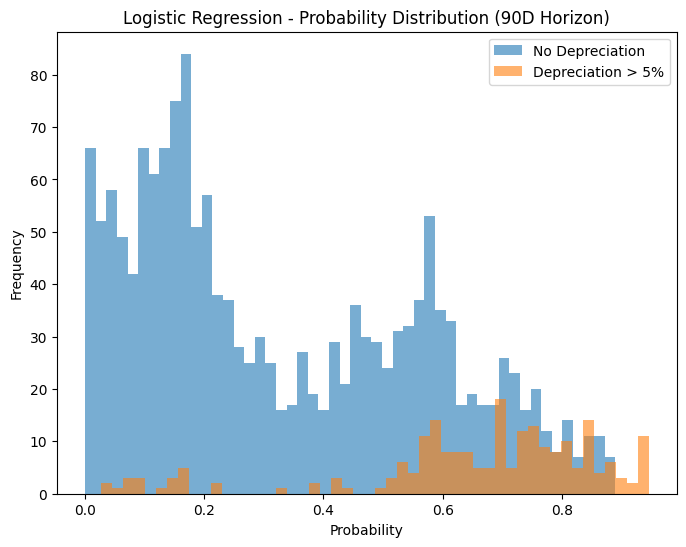

In [ ]:
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, roc_auc_score, confusion_matrix
from imblearn.over_sampling import SMOTE
import matplotlib.pyplot as plt
import pandas as pd

# Define the predictors and target
all_predictors = ['CSSS_MA_6M',
    'WTI_Price_MA_6M',
    'Interest_Rate_Diff_MA_6M',
    'USDBRLV6M', 'USDBRLV3M', 'USDBRLV1Y', 'BRLBFIK1Y25D',
    'BRLBFIK6M25D', 'BRLBFIK3M25D','BRLRRIS3M25D','BRLRRIS6M25D','BRLRRIS1Y25D']
target = 'Depreciate_10pct_180D'
final_data = pd.read_csv("/content/drive/My Drive/Sentiment Brazil Score/all_data.csv")
# Ensure the dataset is sorted and target variable is created
final_data = final_data.sort_index()

# Compute returns and create the target variable
final_data['Return_180D'] = final_data['USDBRL'].shift(-180) / final_data['USDBRL'] - 1
final_data['Depreciate_10pct_180D'] = (final_data['Return_180D'] > 0.10).astype(int)

# Drop rows with NaN (from shift operations)
final_data = final_data.dropna()

# Split data into train and test sets
X = final_data[all_predictors]
y = final_data[target]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Apply SMOTE to balance the training data
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

# Feature Selection with Recursive Feature Elimination (RFE)
logistic = LogisticRegression(max_iter=1000, random_state=42)
rfe = RFE(logistic, n_features_to_select=10)  # Select the top 5 features
rfe.fit(X_train_smote, y_train_smote)

# Get selected features
selected_features = X_train.columns[rfe.support_].tolist()
print("\nSelected Features:")
print(selected_features)

# Train Logistic Regression with Selected Features
X_train_selected = X_train_smote[selected_features]
X_test_selected = X_test[selected_features]

model = LogisticRegression(max_iter=1000, random_state=42)
model.fit(X_train_selected, y_train_smote)

# Get variable coefficients
coefficients = pd.DataFrame({'Variable': ['Intercept'] + selected_features, 'Coefficient': [model.intercept_[0]] + list(model.coef_[0])})
print("\nLogistic Regression Coefficients:")
print(coefficients)

# Make predictions
probabilities = model.predict_proba(X_test_selected)[:, 1]
predictions = (probabilities > 0.5).astype(int)

# Evaluate the model
accuracy = model.score(X_test_selected, y_test)
roc_auc = roc_auc_score(y_test, probabilities)
report = classification_report(y_test, predictions)
cm = confusion_matrix(y_test, predictions)

# Print results
print(f"\nAccuracy: {accuracy}")
print("\nClassification Report:")
print(report)
print(f"\nROC-AUC: {roc_auc}")
print("\nConfusion Matrix:")
print(cm)

# Plot probabilities
plt.figure(figsize=(8, 6))
plt.hist(probabilities[y_test == 0], bins=50, alpha=0.6, label='No Depreciation')
plt.hist(probabilities[y_test == 1], bins=50, alpha=0.6, label='Depreciation > 5%')
plt.title("Logistic Regression - Probability Distribution (90D Horizon)")
plt.xlabel('Probability')
plt.ylabel('Frequency')
plt.legend()
plt.show()


In [ ]:
import numpy as np
from ipywidgets import interact, FloatSlider

# Interactive threshold evaluation function
def evaluate_threshold(threshold):
    # Convert probabilities into predictions based on the threshold
    predictions = (probabilities >= threshold).astype(int)

    # Calculate confusion matrix
    cm = confusion_matrix(y_test, predictions)

    # Calculate metrics
    accuracy = np.mean(predictions == y_test)
    roc_auc = roc_auc_score(y_test, probabilities)
    report = classification_report(y_test, predictions, target_names=["No Depreciation", "Depreciation"])

    # Print the confusion matrix and metrics
    print(f"Threshold: {threshold:.2f}")
    print("\nConfusion Matrix:")
    print(cm)
    print("\nClassification Report:")
    print(report)
    print(f"ROC-AUC: {roc_auc:.4f}")

    # Plot confusion matrix
    plt.figure(figsize=(6, 5))
    plt.matshow(cm, cmap='coolwarm', fignum=1)
    plt.title('Confusion Matrix', pad=20)
    plt.colorbar()
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.xticks([0, 1], ['No Depreciation', 'Depreciation'])
    plt.yticks([0, 1], ['No Depreciation', 'Depreciation'])
    for (i, j), value in np.ndenumerate(cm):
        plt.text(j, i, f'{value}', ha='center', va='center', color='white' if value > cm.max()/2 else 'black')
    plt.show()

# Interactive widget to choose threshold
interact(evaluate_threshold, threshold=FloatSlider(value=0.5, min=0.0, max=1.0, step=0.01, description='Threshold'));


interactive(children=(FloatSlider(value=0.5, description='Threshold', max=1.0, step=0.01), Output()), _dom_cla…

# Logistic Regression (15% Crash)


Selected Features:
['CSSS_MA_3M', 'WTI_Price_MA_3M', 'Interest_Rate_Diff_MA_3M', 'USDBRLV3M', 'USDBRLV1M', 'USDBRLV1Y', 'BRLBFIK1Y25D', 'BRLBFIK6M25D', 'BRLBFIK3M25D', 'BRLRRIS3M25D']
Optimization terminated successfully.
         Current function value: 0.302402
         Iterations 8

Logistic Regression Coefficients with P-Values:
                              Coef.          P>|z|
const                      2.801954   1.167429e-20
CSSS_MA_3M               -65.804888  6.783173e-268
WTI_Price_MA_3M            0.065720  7.237649e-218
Interest_Rate_Diff_MA_3M  -0.326989  1.646309e-124
USDBRLV3M                 -2.612128  4.818382e-154
USDBRLV1M                  1.410826  2.097802e-191
USDBRLV1Y                  1.013221   2.962390e-64
BRLBFIK1Y25D              -1.897959   3.929181e-50
BRLBFIK6M25D              -5.142264  6.406773e-146
BRLBFIK3M25D               4.655267  5.705210e-173
BRLRRIS3M25D               0.422154   4.086003e-02

Accuracy: 0.8521739130434782

Classification Report

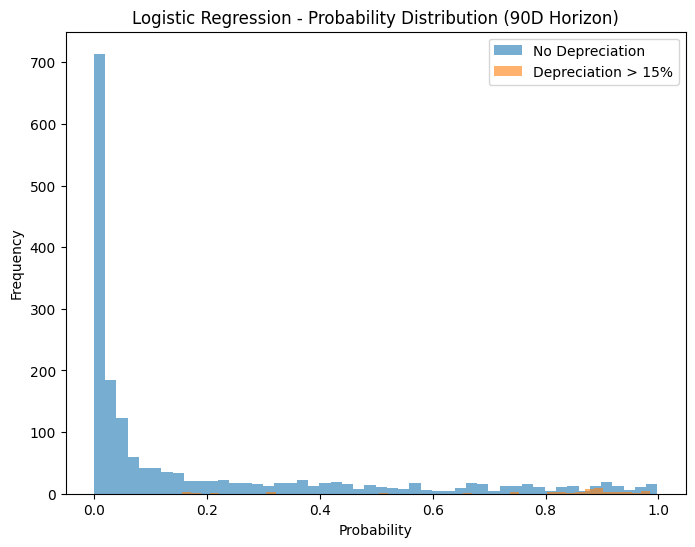

In [ ]:
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, roc_auc_score, confusion_matrix
from imblearn.over_sampling import SMOTE
import matplotlib.pyplot as plt
import pandas as pd
import statsmodels.api as sm
from sklearn.model_selection import train_test_split

final_data = pd.read_csv("/content/drive/My Drive/Sentiment Brazil Score/all_data.csv")

# Define the predictors and target
all_predictors = [
    'CSSS_MA_3M',
    'WTI_Price_MA_3M',
    'Interest_Rate_Diff_MA_3M',
    'USDBRLV3M', 'USDBRLV1M', 'USDBRLV1Y', 'BRLBFIK1Y25D',
    'BRLBFIK6M25D', 'BRLBFIK3M25D','BRLRRIS3M25D'
]
target = 'Depreciate_15pct_90D'

# Ensure the dataset is sorted and target variable is created
final_data = final_data.sort_index()

# Compute returns and create the target variable
final_data['Return_90D'] = final_data['USDBRL'].shift(-90) / final_data['USDBRL'] - 1
final_data['Depreciate_15pct_90D'] = (final_data['Return_90D'] > 0.15).astype(int)

# Drop rows with NaN (from shift operations)
final_data = final_data.dropna()

# Split data into train and test sets
X = final_data[all_predictors]
y = final_data[target]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Apply SMOTE to balance the training data
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

# Feature Selection with Recursive Feature Elimination (RFE)
logistic = LogisticRegression(max_iter=1000, random_state=42)
rfe = RFE(logistic, n_features_to_select=10)  # Select the top 10 features
rfe.fit(X_train_smote, y_train_smote)

# Get selected features
selected_features = X_train.columns[rfe.support_].tolist()
print("\nSelected Features:")
print(selected_features)

# Train Logistic Regression with Selected Features (using statsmodels for detailed analysis)
X_train_selected = X_train_smote[selected_features]
X_test_selected = X_test[selected_features]

# Add constant for intercept
X_train_selected = sm.add_constant(X_train_selected)
X_test_selected = sm.add_constant(X_test_selected)

logit_model = sm.Logit(y_train_smote, X_train_selected)
result = logit_model.fit()

# Get variable coefficients, p-values, and F-statistics
summary_table = result.summary2().tables[1]  # Summary table with coefficients and p-values
coefficients = summary_table[['Coef.', 'P>|z|']]  # Coefficients and p-values

# Print coefficients, p-values, and F-statistics
print("\nLogistic Regression Coefficients with P-Values:")
print(coefficients)

# Make predictions
probabilities = result.predict(X_test_selected)
predictions = (probabilities > 0.5).astype(int)

# Evaluate the model
accuracy = (predictions == y_test).mean()
roc_auc = roc_auc_score(y_test, probabilities)
report = classification_report(y_test, predictions)
cm = confusion_matrix(y_test, predictions)

# Print evaluation metrics
print(f"\nAccuracy: {accuracy}")
print("\nClassification Report:")
print(report)
print(f"\nROC-AUC: {roc_auc}")
print("\nConfusion Matrix:")
print(cm)

# Plot probability distribution
plt.figure(figsize=(8, 6))
plt.hist(probabilities[y_test == 0], bins=50, alpha=0.6, label='No Depreciation')
plt.hist(probabilities[y_test == 1], bins=50, alpha=0.6, label='Depreciation > 15%')
plt.title("Logistic Regression - Probability Distribution (90D Horizon)")
plt.xlabel('Probability')
plt.ylabel('Frequency')
plt.legend()
plt.show()


In [ ]:
import numpy as np
from ipywidgets import interact, FloatSlider

# Interactive threshold evaluation function
def evaluate_threshold(threshold):
    # Convert probabilities into predictions based on the threshold
    predictions = (probabilities >= threshold).astype(int)

    # Calculate confusion matrix
    cm = confusion_matrix(y_test, predictions)

    # Calculate metrics
    accuracy = np.mean(predictions == y_test)
    roc_auc = roc_auc_score(y_test, probabilities)
    report = classification_report(y_test, predictions, target_names=["No Depreciation", "Depreciation"])

    # Print the confusion matrix and metrics
    print(f"Threshold: {threshold:.2f}")
    print("\nConfusion Matrix:")
    print(cm)
    print("\nClassification Report:")
    print(report)
    print(f"ROC-AUC: {roc_auc:.4f}")

    # Plot confusion matrix
    plt.figure(figsize=(6, 5))
    plt.matshow(cm, cmap='coolwarm', fignum=1)
    plt.title('Confusion Matrix', pad=20)
    plt.colorbar()
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.xticks([0, 1], ['No Depreciation', 'Depreciation'])
    plt.yticks([0, 1], ['No Depreciation', 'Depreciation'])
    for (i, j), value in np.ndenumerate(cm):
        plt.text(j, i, f'{value}', ha='center', va='center', color='white' if value > cm.max()/2 else 'black')
    plt.show()

# Interactive widget to choose threshold
interact(evaluate_threshold, threshold=FloatSlider(value=0.5, min=0.0, max=1.0, step=0.01, description='Threshold'));


interactive(children=(FloatSlider(value=0.5, description='Threshold', max=1.0, step=0.01), Output()), _dom_cla…

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(



Selected Features:
['CSSS_MA_6M', 'USDBRLV6M', 'USDBRLV3M', 'USDBRLV1Y', 'BRLBFIK1Y25D', 'BRLBFIK6M25D', 'BRLBFIK3M25D', 'BRLRRIS3M25D', 'BRLRRIS6M25D', 'BRLRRIS1Y25D']

Logistic Regression Coefficients:
        Variable  Coefficient
0      Intercept     6.466494
1     CSSS_MA_6M     2.528989
2      USDBRLV6M    -1.838064
3      USDBRLV3M     0.571974
4      USDBRLV1Y     1.059597
5   BRLBFIK1Y25D    -0.322021
6   BRLBFIK6M25D     0.563677
7   BRLBFIK3M25D    -1.160582
8   BRLRRIS3M25D     3.542604
9   BRLRRIS6M25D    -7.003577
10  BRLRRIS1Y25D     2.269290

Accuracy: 0.741304347826087

Classification Report:
              precision    recall  f1-score   support

           0       0.99      0.73      0.84      1730
           1       0.17      0.85      0.28       110

    accuracy                           0.74      1840
   macro avg       0.58      0.79      0.56      1840
weighted avg       0.94      0.74      0.81      1840


ROC-AUC: 0.8648817656332107

Confusion Matrix:
[[1271 

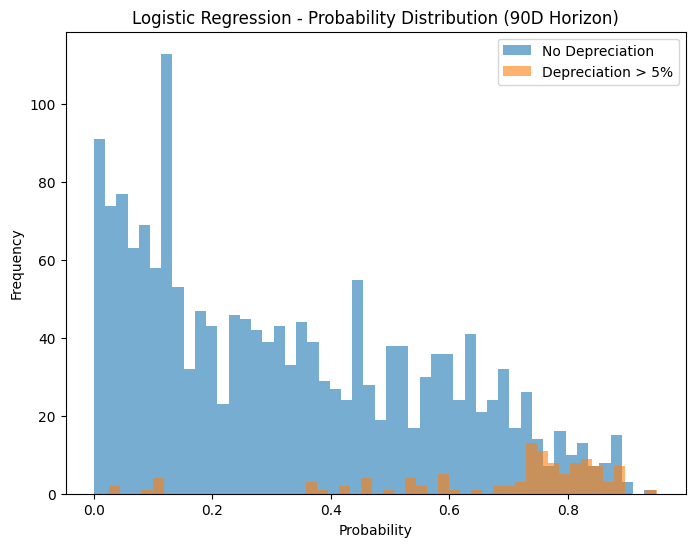

In [ ]:
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, roc_auc_score, confusion_matrix
from imblearn.over_sampling import SMOTE
import matplotlib.pyplot as plt
import pandas as pd

# Define the predictors and target
all_predictors = ['CSSS_MA_6M',
    'WTI_Price_MA_6M',
    'Interest_Rate_Diff_MA_6M',
    'USDBRLV6M', 'USDBRLV3M', 'USDBRLV1Y', 'BRLBFIK1Y25D',
    'BRLBFIK6M25D', 'BRLBFIK3M25D','BRLRRIS3M25D','BRLRRIS6M25D','BRLRRIS1Y25D']
target = 'Depreciate_15pct_180D'
final_data = pd.read_csv("/content/drive/My Drive/Sentiment Brazil Score/all_data.csv")
# Ensure the dataset is sorted and target variable is created
final_data = final_data.sort_index()

# Compute returns and create the target variable
final_data['Return_180D'] = final_data['USDBRL'].shift(-180) / final_data['USDBRL'] - 1
final_data['Depreciate_15pct_180D'] = (final_data['Return_180D'] > 0.15).astype(int)

# Drop rows with NaN (from shift operations)
final_data = final_data.dropna()

# Split data into train and test sets
X = final_data[all_predictors]
y = final_data[target]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Apply SMOTE to balance the training data
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

# Feature Selection with Recursive Feature Elimination (RFE)
logistic = LogisticRegression(max_iter=1000, random_state=42)
rfe = RFE(logistic, n_features_to_select=10)  # Select the top 5 features
rfe.fit(X_train_smote, y_train_smote)

# Get selected features
selected_features = X_train.columns[rfe.support_].tolist()
print("\nSelected Features:")
print(selected_features)

# Train Logistic Regression with Selected Features
X_train_selected = X_train_smote[selected_features]
X_test_selected = X_test[selected_features]

model = LogisticRegression(max_iter=1000, random_state=42)
model.fit(X_train_selected, y_train_smote)

# Get variable coefficients
coefficients = pd.DataFrame({'Variable': ['Intercept'] + selected_features, 'Coefficient': [model.intercept_[0]] + list(model.coef_[0])})
print("\nLogistic Regression Coefficients:")
print(coefficients)

# Make predictions
probabilities = model.predict_proba(X_test_selected)[:, 1]
predictions = (probabilities > 0.5).astype(int)

# Evaluate the model
accuracy = model.score(X_test_selected, y_test)
roc_auc = roc_auc_score(y_test, probabilities)
report = classification_report(y_test, predictions)
cm = confusion_matrix(y_test, predictions)

# Print results
print(f"\nAccuracy: {accuracy}")
print("\nClassification Report:")
print(report)
print(f"\nROC-AUC: {roc_auc}")
print("\nConfusion Matrix:")
print(cm)

# Plot probabilities
plt.figure(figsize=(8, 6))
plt.hist(probabilities[y_test == 0], bins=50, alpha=0.6, label='No Depreciation')
plt.hist(probabilities[y_test == 1], bins=50, alpha=0.6, label='Depreciation > 5%')
plt.title("Logistic Regression - Probability Distribution (90D Horizon)")
plt.xlabel('Probability')
plt.ylabel('Frequency')
plt.legend()
plt.show()


In [ ]:
import numpy as np
from ipywidgets import interact, FloatSlider

# Interactive threshold evaluation function
def evaluate_threshold(threshold):
    # Convert probabilities into predictions based on the threshold
    predictions = (probabilities >= threshold).astype(int)

    # Calculate confusion matrix
    cm = confusion_matrix(y_test, predictions)

    # Calculate metrics
    accuracy = np.mean(predictions == y_test)
    roc_auc = roc_auc_score(y_test, probabilities)
    report = classification_report(y_test, predictions, target_names=["No Depreciation", "Depreciation"])

    # Print the confusion matrix and metrics
    print(f"Threshold: {threshold:.2f}")
    print("\nConfusion Matrix:")
    print(cm)
    print("\nClassification Report:")
    print(report)
    print(f"ROC-AUC: {roc_auc:.4f}")

    # Plot confusion matrix
    plt.figure(figsize=(6, 5))
    plt.matshow(cm, cmap='coolwarm', fignum=1)
    plt.title('Confusion Matrix', pad=20)
    plt.colorbar()
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.xticks([0, 1], ['No Depreciation', 'Depreciation'])
    plt.yticks([0, 1], ['No Depreciation', 'Depreciation'])
    for (i, j), value in np.ndenumerate(cm):
        plt.text(j, i, f'{value}', ha='center', va='center', color='white' if value > cm.max()/2 else 'black')
    plt.show()

# Interactive widget to choose threshold
interact(evaluate_threshold, threshold=FloatSlider(value=0.5, min=0.0, max=1.0, step=0.01, description='Threshold'));


interactive(children=(FloatSlider(value=0.5, description='Threshold', max=1.0, step=0.01), Output()), _dom_cla…

# XGBoost (5% crash)

In [ ]:
final_data = pd.read_csv("/content/drive/My Drive/Sentiment Brazil Score/all_data.csv")

In [ ]:
final_data

,Date,Year,Quarter,Content_Theme,Title_Theme,Title_DSS,Title_FSS,Title_CSSS,Content_DSS,Content_FSS,...,BRLBFIK1W10D,BRLBFIK2W10D,BRLBFIK1M10D,BRLBFIK2M10D,BRLBFIK3M10D,BRLBFIK6M10D,BRLBFIK9M10D,BRLBFIK1Y10D,BRLBFIK3Y10D,BRLBFIK5Y10D
0,2006-01-02,2006,2006Q1,Economic Stability_negative,Political Developments_positive,-0.2000,-0.690112,-0.166818,-0.005848,-0.791858,...,1.0202,NaN,1.5858,5.2959,1.6843,2.0079,5.5181,2.0031,1.8657,1.6753
1,2006-01-05,2006,2006Q1,Monetary Policy_positive,Economic Stability_positive,0.0000,0.088721,0.008830,0.000000,0.135889,...,2.0027,1.6680,1.5359,1.2346,1.6947,2.0180,2.0102,1.9948,1.8657,1.6753
2,2006-01-09,2006,2006Q1,Economic Stability_negative,Monetary Policy_positive,0.0000,-0.059169,-0.076523,-0.006803,-0.223803,...,2.0049,1.7185,1.5546,1.2384,1.6763,2.0180,5.3962,1.9866,1.8657,1.6753
3,2006-01-09,2006,2006Q1,Economic Stability_negative,Political Developments_negative,0.0000,-0.935544,-0.160816,-0.014870,-0.383756,...,2.0049,1.7185,1.5546,1.2384,1.6763,2.0180,5.3962,1.9866,1.8657,1.6753
4,2006-01-11,2006,2006Q1,Economic Stability_negative,Monetary Policy_positive,0.0000,0.050833,-0.031230,-0.035294,-0.252642,...,0.8751,0.9756,1.5522,1.2452,1.6614,1.9976,1.7115,1.9819,1.8678,1.6753
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10304,2023-12-13,2023,2023Q4,Monetary Policy_positive,Monetary Policy_negative,-0.0625,0.069429,-0.094199,-0.028409,-0.592835,...,1.0349,1.1925,1.1521,1.1681,1.3055,1.4316,1.4972,1.5661,1.9845,2.2927
10305,2023-12-13,2023,2023Q4,Economic Stability_negative,Monetary Policy_positive,0.0000,-0.581852,-0.096575,0.000000,-0.086564,...,1.0349,1.1925,1.1521,1.1681,1.3055,1.4316,1.4972,1.5661,1.9845,2.2927
10306,2023-12-13,2023,2023Q4,Monetary Policy_positive,Monetary Policy_negative,0.0000,-0.012767,-0.060324,-0.054545,-0.872048,...,1.0349,1.1925,1.1521,1.1681,1.3055,1.4316,1.4972,1.5661,1.9845,2.2927
10307,2023-12-15,2023,2023Q4,Economic Stability_negative,Monetary Policy_positive,0.0000,0.460811,0.099567,0.000000,0.146229,...,1.0068,1.2031,1.1509,1.1774,1.3028,1.4304,1.4891,1.5691,1.9983,2.2968


Fitting 3 folds for each of 324 candidates, totalling 972 fits


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [18:02:15] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)



Best Parameters from GridSearchCV:
{'colsample_bytree': 0.8, 'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 200, 'scale_pos_weight': 5, 'subsample': 0.8}


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [18:02:16] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)



Accuracy: 0.9853260869565217

Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.99      0.99      1556
           1       0.93      0.98      0.95       284

    accuracy                           0.99      1840
   macro avg       0.96      0.98      0.97      1840
weighted avg       0.99      0.99      0.99      1840


ROC-AUC: 0.9989794163438213

Confusion Matrix:
[[1534   22]
 [   5  279]]

Total Gain: 455.56981229782104

Feature Importance (Gain and Percent Contribution):
                     Feature       Gain  Percent Contribution
18              BRLBFIK1M25D  62.135204             13.639008
9   Interest_Rate_Diff_MA_3M  33.780216              7.414937
19              BRLRRIS1Y25D  29.696939              6.518636
17              BRLBFIK3M25D  27.530924              6.043184
8            WTI_Price_MA_1M  24.380077              5.351557
7            WTI_Price_MA_6M  23.668036              5.195260
10  Interest_Rate_Diff_MA

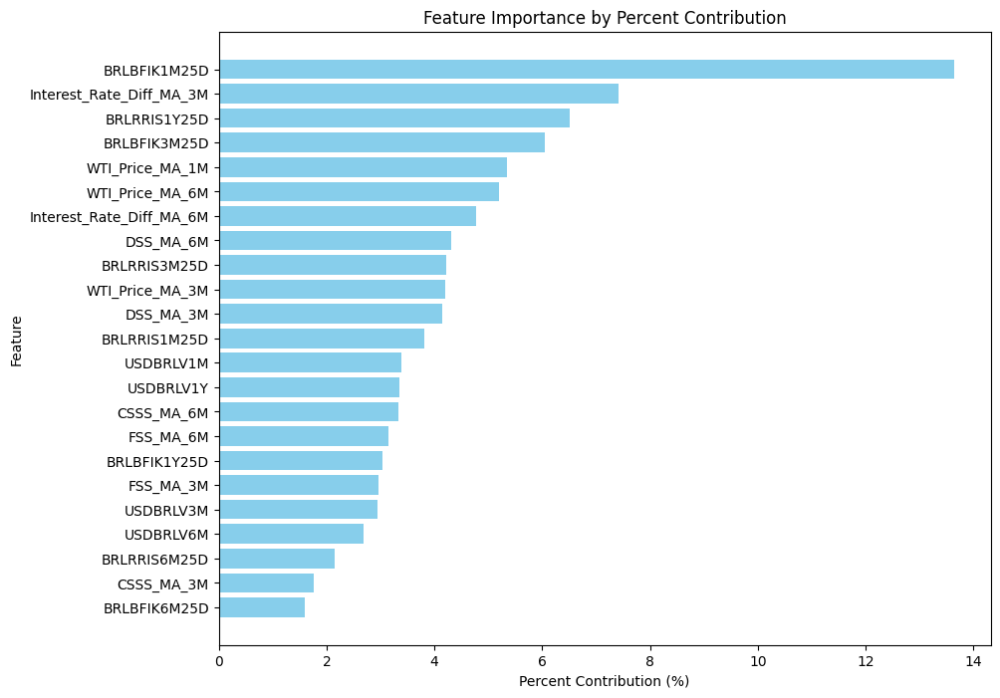

In [ ]:
from xgboost import XGBClassifier, plot_importance
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.metrics import classification_report, roc_auc_score, confusion_matrix
from imblearn.over_sampling import SMOTE
import matplotlib.pyplot as plt
import pandas as pd

# Define the predictors and target
all_predictors = [
    'DSS_MA_6M', 'CSSS_MA_6M', 'FSS_MA_6M', 'DSS_MA_3M', 'CSSS_MA_3M', 'FSS_MA_3M',
    'WTI_Price_MA_3M', 'WTI_Price_MA_6M', 'WTI_Price_MA_1M',
    'Interest_Rate_Diff_MA_3M', 'Interest_Rate_Diff_MA_6M',
    'USDBRLV6M', 'USDBRLV3M', 'USDBRLV1M', 'USDBRLV1Y', 'BRLBFIK1Y25D',
    'BRLBFIK6M25D', 'BRLBFIK3M25D', 'BRLBFIK1M25D', 'BRLRRIS1Y25D',
    'BRLRRIS6M25D', 'BRLRRIS3M25D', 'BRLRRIS1M25D'
]
target = 'Depreciate_5pct_90D'

# Ensure the dataset is sorted and target variable is created
final_data = final_data.sort_index()

# Compute returns and create the target variable
final_data['Return_90D'] = final_data['USDBRL'].shift(-90) / final_data['USDBRL'] - 1
final_data['Depreciate_5pct_90D'] = (final_data['Return_90D'] > 0.05).astype(int)

# Drop rows with NaN (from shift operations)
final_data = final_data.dropna()

# Split data into train and test sets
X = final_data[all_predictors]
y = final_data[target]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Apply SMOTE to balance the training data
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

# Hyperparameter tuning using GridSearchCV
xgb = XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42)

param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [3, 5, 7],
    'learning_rate': [0.01, 0.1, 0.3],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8, 1.0],
    'scale_pos_weight': [1, 2, 5]  # Adjust for class imbalance
}

grid_search = GridSearchCV(estimator=xgb, param_grid=param_grid, scoring='roc_auc', cv=3, verbose=2, n_jobs=-1)
grid_search.fit(X_train_smote, y_train_smote)

# Best parameters and model
best_params = grid_search.best_params_
best_model = grid_search.best_estimator_

print("\nBest Parameters from GridSearchCV:")
print(best_params)

# Train final model with the best parameters
best_model.fit(X_train_smote, y_train_smote)

# Make predictions
probabilities = best_model.predict_proba(X_test)[:, 1]
predictions = (probabilities > 0.5).astype(int)

# Evaluate the model
accuracy = best_model.score(X_test, y_test)
roc_auc = roc_auc_score(y_test, probabilities)
report = classification_report(y_test, predictions)
cm = confusion_matrix(y_test, predictions)

# Print results
print(f"\nAccuracy: {accuracy}")
print("\nClassification Report:")
print(report)
print(f"\nROC-AUC: {roc_auc}")
print("\nConfusion Matrix:")
print(cm)

# Extract and compute feature importance
feature_importance = best_model.get_booster().get_score(importance_type='gain')
total_gain = sum(feature_importance.values())

# Convert to DataFrame for better readability
feature_importance_df = pd.DataFrame({
    'Feature': feature_importance.keys(),
    'Gain': feature_importance.values()
})
feature_importance_df['Percent Contribution'] = (feature_importance_df['Gain'] / total_gain) * 100

# Sort by gain in descending order
feature_importance_df = feature_importance_df.sort_values(by='Gain', ascending=False)

# Print total gain and feature contributions
print("\nTotal Gain:", total_gain)
print("\nFeature Importance (Gain and Percent Contribution):")
print(feature_importance_df)

# Plot feature importance
plt.figure(figsize=(10, 8))
plt.barh(feature_importance_df['Feature'], feature_importance_df['Percent Contribution'], color='skyblue')
plt.xlabel('Percent Contribution (%)')
plt.ylabel('Feature')
plt.title('Feature Importance by Percent Contribution')
plt.gca().invert_yaxis()
plt.show()


In [ ]:
final_data = pd.read_csv("/content/drive/My Drive/Sentiment Brazil Score/all_data.csv")

Fitting 3 folds for each of 324 candidates, totalling 972 fits


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [18:04:00] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)



Best Parameters from GridSearchCV:
{'colsample_bytree': 0.8, 'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 200, 'scale_pos_weight': 5, 'subsample': 0.8}


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [18:04:00] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)



Accuracy: 0.9896739130434783

Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.99      0.99      1739
           1       0.87      0.95      0.91       101

    accuracy                           0.99      1840
   macro avg       0.93      0.97      0.95      1840
weighted avg       0.99      0.99      0.99      1840


ROC-AUC: 0.9863356088340289

Confusion Matrix:
[[1725   14]
 [   5   96]]

Total Gain: 1192.6001796722412

Feature Importance (Gain and Percent Contribution):
                     Feature        Gain  Percent Contribution
16              BRLBFIK6M25D  299.494873             25.112764
9   Interest_Rate_Diff_MA_3M  104.888176              8.794915
10  Interest_Rate_Diff_MA_6M   97.926819              8.211203
17              BRLBFIK3M25D   76.368279              6.403511
13                 USDBRLV1M   60.758537              5.094628
7            WTI_Price_MA_6M   59.322994              4.974257
15              BR

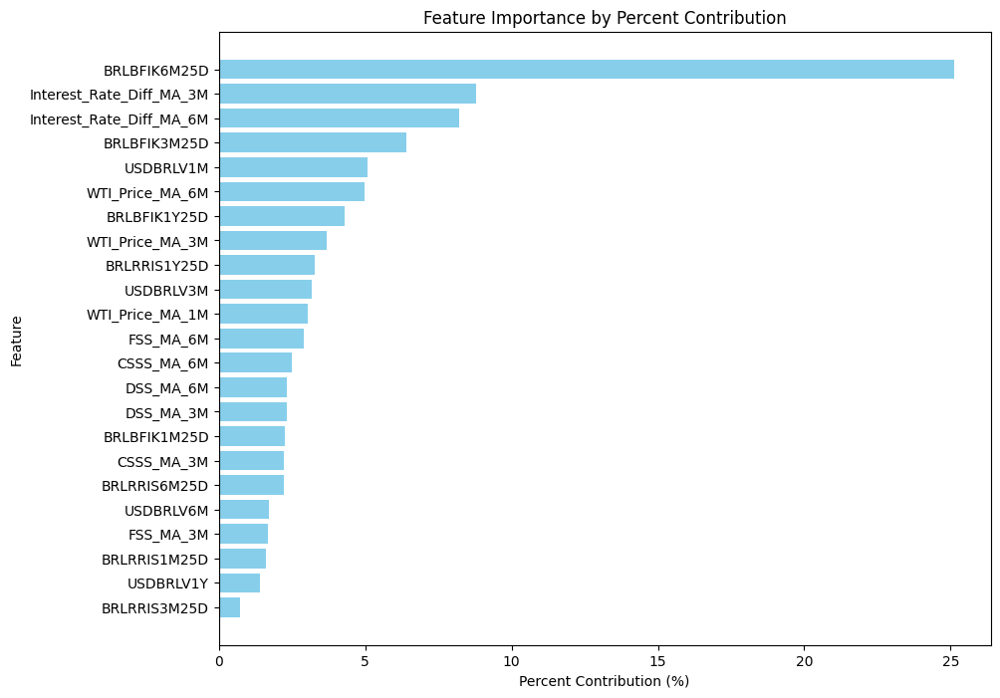

In [ ]:
from xgboost import XGBClassifier, plot_importance
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.metrics import classification_report, roc_auc_score, confusion_matrix
from imblearn.over_sampling import SMOTE
import matplotlib.pyplot as plt
import pandas as pd

# Define the predictors and target
all_predictors = [
    'DSS_MA_6M', 'CSSS_MA_6M', 'FSS_MA_6M', 'DSS_MA_3M', 'CSSS_MA_3M', 'FSS_MA_3M',
    'WTI_Price_MA_3M', 'WTI_Price_MA_6M', 'WTI_Price_MA_1M',
    'Interest_Rate_Diff_MA_3M', 'Interest_Rate_Diff_MA_6M',
    'USDBRLV6M', 'USDBRLV3M', 'USDBRLV1M', 'USDBRLV1Y', 'BRLBFIK1Y25D',
    'BRLBFIK6M25D', 'BRLBFIK3M25D', 'BRLBFIK1M25D', 'BRLRRIS1Y25D',
    'BRLRRIS6M25D', 'BRLRRIS3M25D', 'BRLRRIS1M25D'
]
target = 'Depreciate_10pct_90D'

# Ensure the dataset is sorted and target variable is created
final_data = final_data.sort_index()

# Compute returns and create the target variable
final_data['Return_90D'] = final_data['USDBRL'].shift(-90) / final_data['USDBRL'] - 1
final_data['Depreciate_10pct_90D'] = (final_data['Return_90D'] > 0.10).astype(int)

# Drop rows with NaN (from shift operations)
final_data = final_data.dropna()

# Split data into train and test sets
X = final_data[all_predictors]
y = final_data[target]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Apply SMOTE to balance the training data
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

# Hyperparameter tuning using GridSearchCV
xgb = XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42)

param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [3, 5, 7],
    'learning_rate': [0.01, 0.1, 0.3],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8, 1.0],
    'scale_pos_weight': [1, 2, 5]  # Adjust for class imbalance
}

grid_search = GridSearchCV(estimator=xgb, param_grid=param_grid, scoring='roc_auc', cv=3, verbose=2, n_jobs=-1)
grid_search.fit(X_train_smote, y_train_smote)

# Best parameters and model
best_params = grid_search.best_params_
best_model = grid_search.best_estimator_

print("\nBest Parameters from GridSearchCV:")
print(best_params)

# Train final model with the best parameters
best_model.fit(X_train_smote, y_train_smote)

# Make predictions
probabilities = best_model.predict_proba(X_test)[:, 1]
predictions = (probabilities > 0.5).astype(int)

# Evaluate the model
accuracy = best_model.score(X_test, y_test)
roc_auc = roc_auc_score(y_test, probabilities)
report = classification_report(y_test, predictions)
cm = confusion_matrix(y_test, predictions)

# Print results
print(f"\nAccuracy: {accuracy}")
print("\nClassification Report:")
print(report)
print(f"\nROC-AUC: {roc_auc}")
print("\nConfusion Matrix:")
print(cm)

# Extract and compute feature importance
feature_importance = best_model.get_booster().get_score(importance_type='gain')
total_gain = sum(feature_importance.values())

# Convert to DataFrame for better readability
feature_importance_df = pd.DataFrame({
    'Feature': feature_importance.keys(),
    'Gain': feature_importance.values()
})
feature_importance_df['Percent Contribution'] = (feature_importance_df['Gain'] / total_gain) * 100

# Sort by gain in descending order
feature_importance_df = feature_importance_df.sort_values(by='Gain', ascending=False)

# Print total gain and feature contributions
print("\nTotal Gain:", total_gain)
print("\nFeature Importance (Gain and Percent Contribution):")
print(feature_importance_df)

# Plot feature importance
plt.figure(figsize=(10, 8))
plt.barh(feature_importance_df['Feature'], feature_importance_df['Percent Contribution'], color='skyblue')
plt.xlabel('Percent Contribution (%)')
plt.ylabel('Feature')
plt.title('Feature Importance by Percent Contribution')
plt.gca().invert_yaxis()
plt.show()


In [ ]:
final_data = pd.read_csv("/content/drive/My Drive/Sentiment Brazil Score/all_data.csv")

Fitting 3 folds for each of 324 candidates, totalling 972 fits


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [18:05:22] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)



Best Parameters from GridSearchCV:
{'colsample_bytree': 1.0, 'learning_rate': 0.3, 'max_depth': 5, 'n_estimators': 200, 'scale_pos_weight': 5, 'subsample': 0.8}


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [18:05:23] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)



Accuracy: 0.9951086956521739

Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1792
           1       0.88      0.94      0.91        48

    accuracy                           1.00      1840
   macro avg       0.94      0.97      0.95      1840
weighted avg       1.00      1.00      1.00      1840


ROC-AUC: 0.9996628534226191

Confusion Matrix:
[[1786    6]
 [   3   45]]

Total Gain: 1078.8321812450886

Feature Importance (Gain and Percent Contribution):
                     Feature        Gain  Percent Contribution
15              BRLBFIK1Y25D  424.327972             39.332157
17              BRLBFIK3M25D  149.457306             13.853620
10  Interest_Rate_Diff_MA_6M  127.041939             11.775876
7            WTI_Price_MA_6M   99.276230              9.202194
13                 USDBRLV1M   61.782505              5.726795
19              BRLRRIS1Y25D   36.309353              3.365616
6            WTI_P

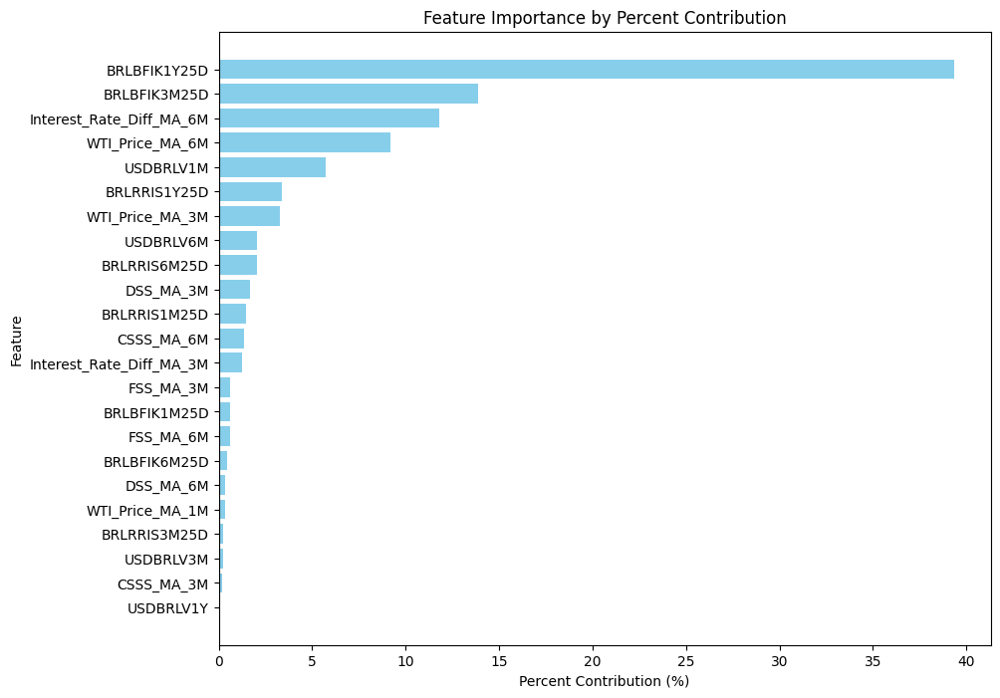

In [ ]:
from xgboost import XGBClassifier, plot_importance
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.metrics import classification_report, roc_auc_score, confusion_matrix
from imblearn.over_sampling import SMOTE
import matplotlib.pyplot as plt
import pandas as pd

# Define the predictors and target
all_predictors = [
    'DSS_MA_6M', 'CSSS_MA_6M', 'FSS_MA_6M', 'DSS_MA_3M', 'CSSS_MA_3M', 'FSS_MA_3M',
    'WTI_Price_MA_3M', 'WTI_Price_MA_6M', 'WTI_Price_MA_1M',
    'Interest_Rate_Diff_MA_3M', 'Interest_Rate_Diff_MA_6M',
    'USDBRLV6M', 'USDBRLV3M', 'USDBRLV1M', 'USDBRLV1Y', 'BRLBFIK1Y25D',
    'BRLBFIK6M25D', 'BRLBFIK3M25D', 'BRLBFIK1M25D', 'BRLRRIS1Y25D',
    'BRLRRIS6M25D', 'BRLRRIS3M25D', 'BRLRRIS1M25D'
]
target = 'Depreciate_15pct_90D'

# Ensure the dataset is sorted and target variable is created
final_data = final_data.sort_index()

# Compute returns and create the target variable
final_data['Return_90D'] = final_data['USDBRL'].shift(-90) / final_data['USDBRL'] - 1
final_data['Depreciate_15pct_90D'] = (final_data['Return_90D'] > 0.15).astype(int)

# Drop rows with NaN (from shift operations)
final_data = final_data.dropna()

# Split data into train and test sets
X = final_data[all_predictors]
y = final_data[target]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Apply SMOTE to balance the training data
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

# Hyperparameter tuning using GridSearchCV
xgb = XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42)

param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [3, 5, 7],
    'learning_rate': [0.01, 0.1, 0.3],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8, 1.0],
    'scale_pos_weight': [1, 2, 5]  # Adjust for class imbalance
}

grid_search = GridSearchCV(estimator=xgb, param_grid=param_grid, scoring='roc_auc', cv=3, verbose=2, n_jobs=-1)
grid_search.fit(X_train_smote, y_train_smote)

# Best parameters and model
best_params = grid_search.best_params_
best_model = grid_search.best_estimator_

print("\nBest Parameters from GridSearchCV:")
print(best_params)

# Train final model with the best parameters
best_model.fit(X_train_smote, y_train_smote)

# Make predictions
probabilities = best_model.predict_proba(X_test)[:, 1]
predictions = (probabilities > 0.5).astype(int)

# Evaluate the model
accuracy = best_model.score(X_test, y_test)
roc_auc = roc_auc_score(y_test, probabilities)
report = classification_report(y_test, predictions)
cm = confusion_matrix(y_test, predictions)

# Print results
print(f"\nAccuracy: {accuracy}")
print("\nClassification Report:")
print(report)
print(f"\nROC-AUC: {roc_auc}")
print("\nConfusion Matrix:")
print(cm)

# Extract and compute feature importance
feature_importance = best_model.get_booster().get_score(importance_type='gain')
total_gain = sum(feature_importance.values())

# Convert to DataFrame for better readability
feature_importance_df = pd.DataFrame({
    'Feature': feature_importance.keys(),
    'Gain': feature_importance.values()
})
feature_importance_df['Percent Contribution'] = (feature_importance_df['Gain'] / total_gain) * 100

# Sort by gain in descending order
feature_importance_df = feature_importance_df.sort_values(by='Gain', ascending=False)

# Print total gain and feature contributions
print("\nTotal Gain:", total_gain)
print("\nFeature Importance (Gain and Percent Contribution):")
print(feature_importance_df)

# Plot feature importance
plt.figure(figsize=(10, 8))
plt.barh(feature_importance_df['Feature'], feature_importance_df['Percent Contribution'], color='skyblue')
plt.xlabel('Percent Contribution (%)')
plt.ylabel('Feature')
plt.title('Feature Importance by Percent Contribution')
plt.gca().invert_yaxis()
plt.show()


In [ ]:
final_data = pd.read_csv("/content/drive/My Drive/Sentiment Brazil Score/all_data.csv")

Fitting 3 folds for each of 324 candidates, totalling 972 fits


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [18:07:14] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)



Best Parameters from GridSearchCV:
{'colsample_bytree': 0.8, 'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 200, 'scale_pos_weight': 5, 'subsample': 0.8}


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [18:07:15] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)



Accuracy: 0.9880434782608696

Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.99      0.99      1408
           1       0.96      0.99      0.97       432

    accuracy                           0.99      1840
   macro avg       0.98      0.99      0.98      1840
weighted avg       0.99      0.99      0.99      1840


ROC-AUC: 0.9983477351641415

Confusion Matrix:
[[1392   16]
 [   6  426]]

Total Gain: 421.71024656295776

Feature Importance (Gain and Percent Contribution):
                     Feature       Gain  Percent Contribution
21              BRLRRIS3M25D  36.304256              8.608815
17              BRLBFIK3M25D  33.111313              7.851674
14                 USDBRLV1Y  31.647877              7.504650
6            WTI_Price_MA_3M  31.538280              7.478661
9   Interest_Rate_Diff_MA_3M  30.050381              7.125836
18              BRLBFIK1M25D  28.245546              6.697856
19              BRLRRIS1Y

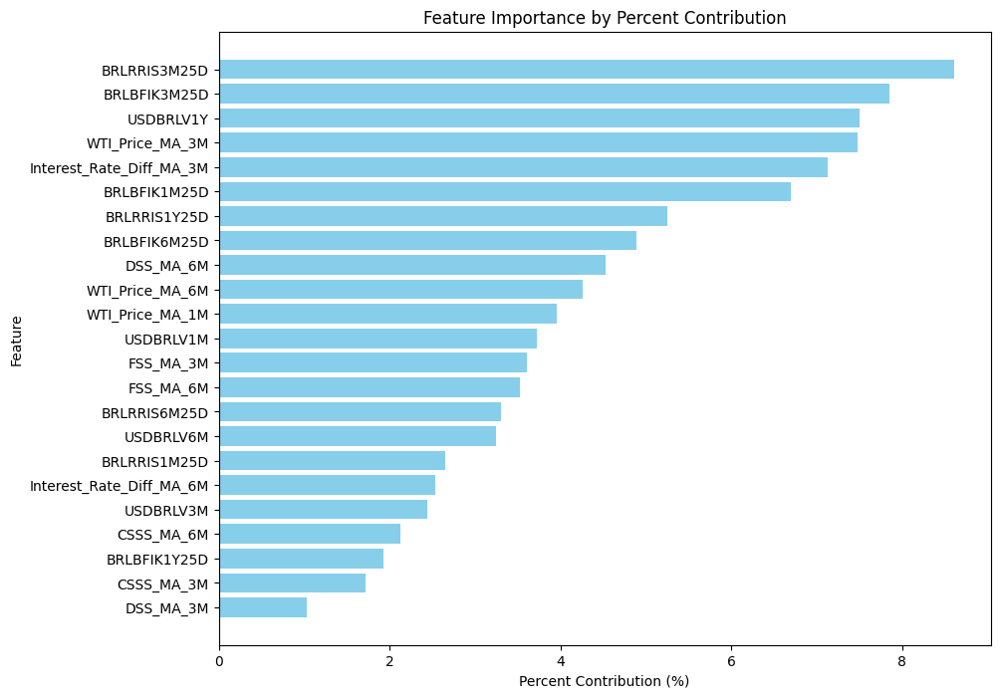

In [ ]:
from xgboost import XGBClassifier, plot_importance
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.metrics import classification_report, roc_auc_score, confusion_matrix
from imblearn.over_sampling import SMOTE
import matplotlib.pyplot as plt
import pandas as pd

# Define the predictors and target
all_predictors = [
    'DSS_MA_6M', 'CSSS_MA_6M', 'FSS_MA_6M', 'DSS_MA_3M', 'CSSS_MA_3M', 'FSS_MA_3M',
    'WTI_Price_MA_3M', 'WTI_Price_MA_6M', 'WTI_Price_MA_1M',
    'Interest_Rate_Diff_MA_3M', 'Interest_Rate_Diff_MA_6M',
    'USDBRLV6M', 'USDBRLV3M', 'USDBRLV1M', 'USDBRLV1Y', 'BRLBFIK1Y25D',
    'BRLBFIK6M25D', 'BRLBFIK3M25D', 'BRLBFIK1M25D', 'BRLRRIS1Y25D',
    'BRLRRIS6M25D', 'BRLRRIS3M25D', 'BRLRRIS1M25D'
]
target = 'Depreciate_5pct_180D'

# Ensure the dataset is sorted and target variable is created
final_data = final_data.sort_index()

# Compute returns and create the target variable
final_data['Return_180D'] = final_data['USDBRL'].shift(-180) / final_data['USDBRL'] - 1
final_data['Depreciate_5pct_180D'] = (final_data['Return_180D'] > 0.05).astype(int)

# Drop rows with NaN (from shift operations)
final_data = final_data.dropna()

# Split data into train and test sets
X = final_data[all_predictors]
y = final_data[target]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Apply SMOTE to balance the training data
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

# Hyperparameter tuning using GridSearchCV
xgb = XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42)

param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [3, 5, 7],
    'learning_rate': [0.01, 0.1, 0.3],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8, 1.0],
    'scale_pos_weight': [1, 2, 5]  # Adjust for class imbalance
}

grid_search = GridSearchCV(estimator=xgb, param_grid=param_grid, scoring='roc_auc', cv=3, verbose=2, n_jobs=-1)
grid_search.fit(X_train_smote, y_train_smote)

# Best parameters and model
best_params = grid_search.best_params_
best_model = grid_search.best_estimator_

print("\nBest Parameters from GridSearchCV:")
print(best_params)

# Train final model with the best parameters
best_model.fit(X_train_smote, y_train_smote)

# Make predictions
probabilities = best_model.predict_proba(X_test)[:, 1]
predictions = (probabilities > 0.5).astype(int)

# Evaluate the model
accuracy = best_model.score(X_test, y_test)
roc_auc = roc_auc_score(y_test, probabilities)
report = classification_report(y_test, predictions)
cm = confusion_matrix(y_test, predictions)

# Print results
print(f"\nAccuracy: {accuracy}")
print("\nClassification Report:")
print(report)
print(f"\nROC-AUC: {roc_auc}")
print("\nConfusion Matrix:")
print(cm)

# Extract and compute feature importance
feature_importance = best_model.get_booster().get_score(importance_type='gain')
total_gain = sum(feature_importance.values())

# Convert to DataFrame for better readability
feature_importance_df = pd.DataFrame({
    'Feature': feature_importance.keys(),
    'Gain': feature_importance.values()
})
feature_importance_df['Percent Contribution'] = (feature_importance_df['Gain'] / total_gain) * 100

# Sort by gain in descending order
feature_importance_df = feature_importance_df.sort_values(by='Gain', ascending=False)

# Print total gain and feature contributions
print("\nTotal Gain:", total_gain)
print("\nFeature Importance (Gain and Percent Contribution):")
print(feature_importance_df)

# Plot feature importance
plt.figure(figsize=(10, 8))
plt.barh(feature_importance_df['Feature'], feature_importance_df['Percent Contribution'], color='skyblue')
plt.xlabel('Percent Contribution (%)')
plt.ylabel('Feature')
plt.title('Feature Importance by Percent Contribution')
plt.gca().invert_yaxis()
plt.show()


In [ ]:
final_data = pd.read_csv("/content/drive/My Drive/Sentiment Brazil Score/all_data.csv")

Fitting 3 folds for each of 324 candidates, totalling 972 fits


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [18:09:03] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [18:09:03] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)



Best Parameters from GridSearchCV:
{'colsample_bytree': 0.8, 'learning_rate': 0.3, 'max_depth': 7, 'n_estimators': 50, 'scale_pos_weight': 1, 'subsample': 1.0}

Accuracy: 0.9907608695652174

Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.99      0.99      1620
           1       0.95      0.98      0.96       220

    accuracy                           0.99      1840
   macro avg       0.97      0.98      0.98      1840
weighted avg       0.99      0.99      0.99      1840


ROC-AUC: 0.9990628507295174

Confusion Matrix:
[[1608   12]
 [   5  215]]

Total Gain: 588.1122388839722

Feature Importance (Gain and Percent Contribution):
                     Feature        Gain  Percent Contribution
16              BRLBFIK6M25D  175.733307             29.880913
7            WTI_Price_MA_6M   57.042545              9.699262
9   Interest_Rate_Diff_MA_3M   40.474297              6.882070
20              BRLRRIS6M25D   35.325581       

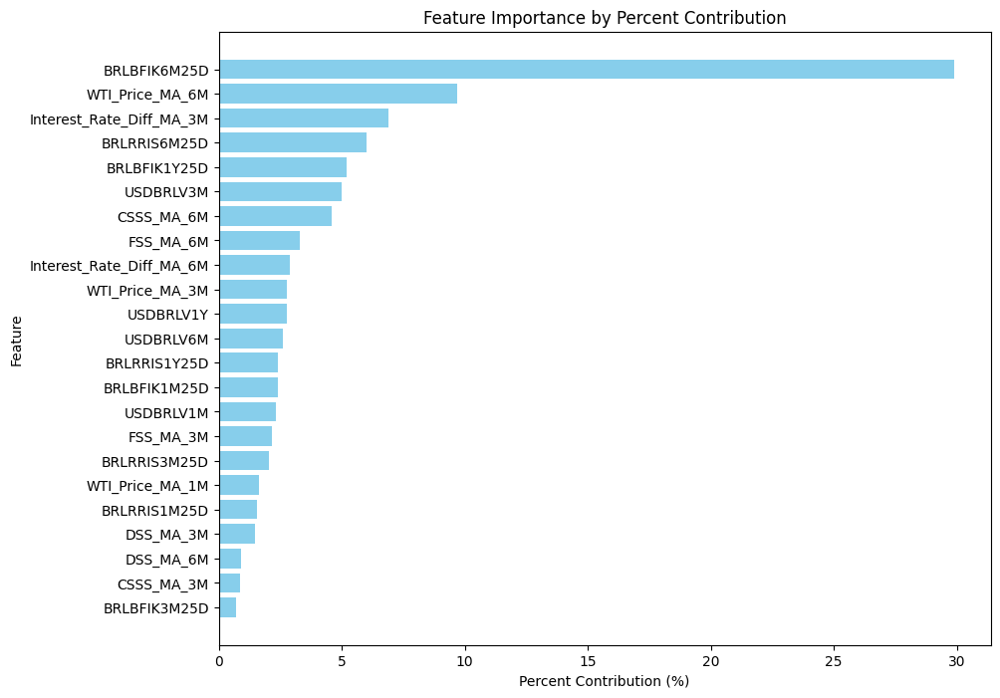

In [ ]:
from xgboost import XGBClassifier, plot_importance
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.metrics import classification_report, roc_auc_score, confusion_matrix
from imblearn.over_sampling import SMOTE
import matplotlib.pyplot as plt
import pandas as pd

# Define the predictors and target
all_predictors = [
    'DSS_MA_6M', 'CSSS_MA_6M', 'FSS_MA_6M', 'DSS_MA_3M', 'CSSS_MA_3M', 'FSS_MA_3M',
    'WTI_Price_MA_3M', 'WTI_Price_MA_6M', 'WTI_Price_MA_1M',
    'Interest_Rate_Diff_MA_3M', 'Interest_Rate_Diff_MA_6M',
    'USDBRLV6M', 'USDBRLV3M', 'USDBRLV1M', 'USDBRLV1Y', 'BRLBFIK1Y25D',
    'BRLBFIK6M25D', 'BRLBFIK3M25D', 'BRLBFIK1M25D', 'BRLRRIS1Y25D',
    'BRLRRIS6M25D', 'BRLRRIS3M25D', 'BRLRRIS1M25D'
]
target = 'Depreciate_10pct_180D'

# Ensure the dataset is sorted and target variable is created
final_data = final_data.sort_index()

# Compute returns and create the target variable
final_data['Return_180D'] = final_data['USDBRL'].shift(-180) / final_data['USDBRL'] - 1
final_data['Depreciate_10pct_180D'] = (final_data['Return_180D'] > 0.10).astype(int)

# Drop rows with NaN (from shift operations)
final_data = final_data.dropna()

# Split data into train and test sets
X = final_data[all_predictors]
y = final_data[target]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Apply SMOTE to balance the training data
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

# Hyperparameter tuning using GridSearchCV
xgb = XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42)

param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [3, 5, 7],
    'learning_rate': [0.01, 0.1, 0.3],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8, 1.0],
    'scale_pos_weight': [1, 2, 5]  # Adjust for class imbalance
}

grid_search = GridSearchCV(estimator=xgb, param_grid=param_grid, scoring='roc_auc', cv=3, verbose=2, n_jobs=-1)
grid_search.fit(X_train_smote, y_train_smote)

# Best parameters and model
best_params = grid_search.best_params_
best_model = grid_search.best_estimator_

print("\nBest Parameters from GridSearchCV:")
print(best_params)

# Train final model with the best parameters
best_model.fit(X_train_smote, y_train_smote)

# Make predictions
probabilities = best_model.predict_proba(X_test)[:, 1]
predictions = (probabilities > 0.5).astype(int)

# Evaluate the model
accuracy = best_model.score(X_test, y_test)
roc_auc = roc_auc_score(y_test, probabilities)
report = classification_report(y_test, predictions)
cm = confusion_matrix(y_test, predictions)

# Print results
print(f"\nAccuracy: {accuracy}")
print("\nClassification Report:")
print(report)
print(f"\nROC-AUC: {roc_auc}")
print("\nConfusion Matrix:")
print(cm)

# Extract and compute feature importance
feature_importance = best_model.get_booster().get_score(importance_type='gain')
total_gain = sum(feature_importance.values())

# Convert to DataFrame for better readability
feature_importance_df = pd.DataFrame({
    'Feature': feature_importance.keys(),
    'Gain': feature_importance.values()
})
feature_importance_df['Percent Contribution'] = (feature_importance_df['Gain'] / total_gain) * 100

# Sort by gain in descending order
feature_importance_df = feature_importance_df.sort_values(by='Gain', ascending=False)

# Print total gain and feature contributions
print("\nTotal Gain:", total_gain)
print("\nFeature Importance (Gain and Percent Contribution):")
print(feature_importance_df)

# Plot feature importance
plt.figure(figsize=(10, 8))
plt.barh(feature_importance_df['Feature'], feature_importance_df['Percent Contribution'], color='skyblue')
plt.xlabel('Percent Contribution (%)')
plt.ylabel('Feature')
plt.title('Feature Importance by Percent Contribution')
plt.gca().invert_yaxis()
plt.show()


In [ ]:
final_data = pd.read_csv("/content/drive/My Drive/Sentiment Brazil Score/all_data.csv")

Fitting 3 folds for each of 324 candidates, totalling 972 fits


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [18:10:36] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)



Best Parameters from GridSearchCV:
{'colsample_bytree': 0.8, 'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 100, 'scale_pos_weight': 5, 'subsample': 1.0}


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [18:10:36] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)



Accuracy: 0.9918478260869565

Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.99      1.00      1730
           1       0.89      0.98      0.94       110

    accuracy                           0.99      1840
   macro avg       0.95      0.99      0.97      1840
weighted avg       0.99      0.99      0.99      1840


ROC-AUC: 0.9996584340514977

Confusion Matrix:
[[1717   13]
 [   2  108]]

Total Gain: 1581.0311965942383

Feature Importance (Gain and Percent Contribution):
                     Feature        Gain  Percent Contribution
16              BRLBFIK6M25D  463.248932             29.300430
9   Interest_Rate_Diff_MA_3M  255.881485             16.184468
7            WTI_Price_MA_6M  102.341438              6.473082
15              BRLBFIK1Y25D   96.243759              6.087404
10  Interest_Rate_Diff_MA_6M   93.565125              5.917981
1                 CSSS_MA_6M   58.217621              3.682256
6            WTI_P

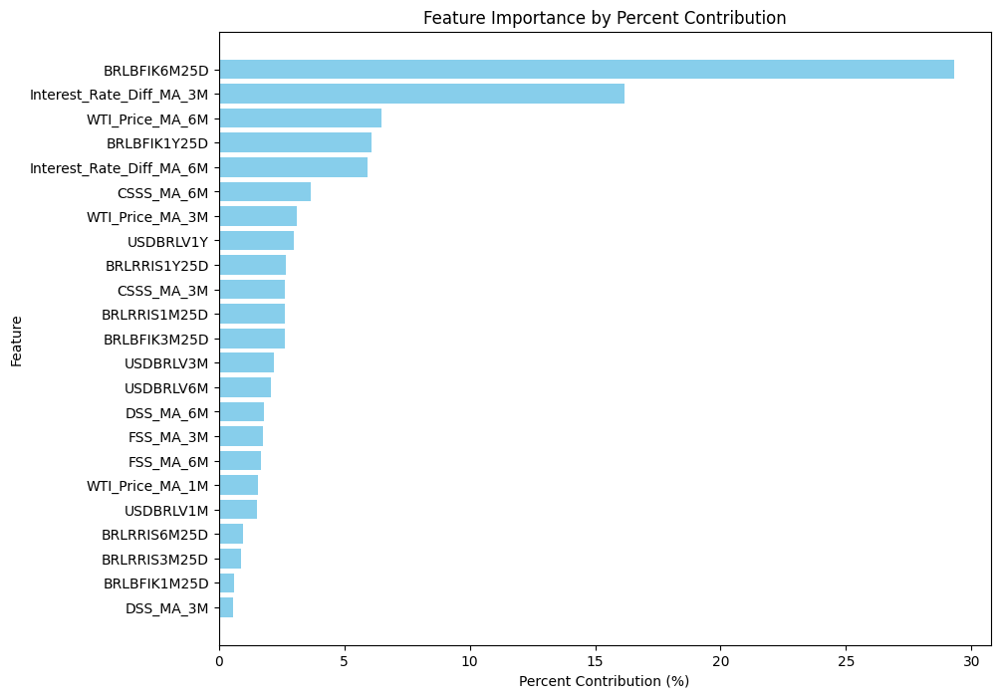

In [ ]:
from xgboost import XGBClassifier, plot_importance
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.metrics import classification_report, roc_auc_score, confusion_matrix
from imblearn.over_sampling import SMOTE
import matplotlib.pyplot as plt
import pandas as pd

# Define the predictors and target
all_predictors = [
    'DSS_MA_6M', 'CSSS_MA_6M', 'FSS_MA_6M', 'DSS_MA_3M', 'CSSS_MA_3M', 'FSS_MA_3M',
    'WTI_Price_MA_3M', 'WTI_Price_MA_6M', 'WTI_Price_MA_1M',
    'Interest_Rate_Diff_MA_3M', 'Interest_Rate_Diff_MA_6M',
    'USDBRLV6M', 'USDBRLV3M', 'USDBRLV1M', 'USDBRLV1Y', 'BRLBFIK1Y25D',
    'BRLBFIK6M25D', 'BRLBFIK3M25D', 'BRLBFIK1M25D', 'BRLRRIS1Y25D',
    'BRLRRIS6M25D', 'BRLRRIS3M25D', 'BRLRRIS1M25D'
]
target = 'Depreciate_15pct_180D'

# Ensure the dataset is sorted and target variable is created
final_data = final_data.sort_index()

# Compute returns and create the target variable
final_data['Return_180D'] = final_data['USDBRL'].shift(-180) / final_data['USDBRL'] - 1
final_data['Depreciate_15pct_180D'] = (final_data['Return_180D'] > 0.15).astype(int)

# Drop rows with NaN (from shift operations)
final_data = final_data.dropna()

# Split data into train and test sets
X = final_data[all_predictors]
y = final_data[target]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Apply SMOTE to balance the training data
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

# Hyperparameter tuning using GridSearchCV
xgb = XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42)

param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [3, 5, 7],
    'learning_rate': [0.01, 0.1, 0.3],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8, 1.0],
    'scale_pos_weight': [1, 2, 5]  # Adjust for class imbalance
}

grid_search = GridSearchCV(estimator=xgb, param_grid=param_grid, scoring='roc_auc', cv=3, verbose=2, n_jobs=-1)
grid_search.fit(X_train_smote, y_train_smote)

# Best parameters and model
best_params = grid_search.best_params_
best_model = grid_search.best_estimator_

print("\nBest Parameters from GridSearchCV:")
print(best_params)

# Train final model with the best parameters
best_model.fit(X_train_smote, y_train_smote)

# Make predictions
probabilities = best_model.predict_proba(X_test)[:, 1]
predictions = (probabilities > 0.5).astype(int)

# Evaluate the model
accuracy = best_model.score(X_test, y_test)
roc_auc = roc_auc_score(y_test, probabilities)
report = classification_report(y_test, predictions)
cm = confusion_matrix(y_test, predictions)

# Print results
print(f"\nAccuracy: {accuracy}")
print("\nClassification Report:")
print(report)
print(f"\nROC-AUC: {roc_auc}")
print("\nConfusion Matrix:")
print(cm)

# Extract and compute feature importance
feature_importance = best_model.get_booster().get_score(importance_type='gain')
total_gain = sum(feature_importance.values())

# Convert to DataFrame for better readability
feature_importance_df = pd.DataFrame({
    'Feature': feature_importance.keys(),
    'Gain': feature_importance.values()
})
feature_importance_df['Percent Contribution'] = (feature_importance_df['Gain'] / total_gain) * 100

# Sort by gain in descending order
feature_importance_df = feature_importance_df.sort_values(by='Gain', ascending=False)

# Print total gain and feature contributions
print("\nTotal Gain:", total_gain)
print("\nFeature Importance (Gain and Percent Contribution):")
print(feature_importance_df)

# Plot feature importance
plt.figure(figsize=(10, 8))
plt.barh(feature_importance_df['Feature'], feature_importance_df['Percent Contribution'], color='skyblue')
plt.xlabel('Percent Contribution (%)')
plt.ylabel('Feature')
plt.title('Feature Importance by Percent Contribution')
plt.gca().invert_yaxis()
plt.show()


# LSTM

In [ ]:
import numpy as np
import pandas as pd
from sklearn.metrics import classification_report, roc_auc_score, confusion_matrix
from sklearn.preprocessing import MinMaxScaler
from imblearn.over_sampling import SMOTE
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam


final_data = pd.read_csv("/content/drive/My Drive/Sentiment Brazil Score/all_data.csv")
# Define predictors and target
predictors = [
    'DSS_MA_6M', 'CSSS_MA_6M', 'FSS_MA_6M', 'DSS_MA_3M', 'CSSS_MA_3M', 'FSS_MA_3M',
    'WTI_Price_MA_3M', 'WTI_Price_MA_6M', 'WTI_Price_MA_1M',
    'Interest_Rate_Diff_MA_3M', 'Interest_Rate_Diff_MA_6M',
    'USDBRLV6M', 'USDBRLV3M', 'USDBRLV1M', 'USDBRLV1Y', 'BRLBFIK1Y25D',
    'BRLBFIK6M25D', 'BRLBFIK3M25D', 'BRLBFIK1M25D', 'BRLRRIS1Y25D',
    'BRLRRIS6M25D', 'BRLRRIS3M25D', 'BRLRRIS1M25D'
]
target = 'Depreciate_5pct_90D'

# Scale features
scaler = MinMaxScaler()
final_data[predictors] = scaler.fit_transform(final_data[predictors])

# Format target variable
final_data['Return_90D'] = final_data['USDBRL'].shift(-90) / final_data['USDBRL'] - 1
final_data['Depreciate_5pct_90D'] = (final_data['Return_90D'] > 0.05).astype(int)

# Drop NaN rows
final_data = final_data.dropna()

# Split data into train/test
X = final_data[predictors].values
y = final_data[target].values
train_size = int(0.8 * len(X))
X_train, X_test = X[:train_size], X[train_size:]
y_train, y_test = y[:train_size], y[train_size:]

# Apply SMOTE to balance training data
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

# Reshape data for LSTM (samples, timesteps, features)
X_train_lstm = X_train_smote.reshape(X_train_smote.shape[0], 1, X_train_smote.shape[1])
X_test_lstm = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])

# Define the LSTM model
model = Sequential()
model.add(LSTM(50, input_shape=(X_train_lstm.shape[1], X_train_lstm.shape[2]), return_sequences=True))
model.add(Dropout(0.2))
model.add(LSTM(50, return_sequences=False))
model.add(Dropout(0.2))
model.add(Dense(1, activation='sigmoid'))

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.001), loss='binary_crossentropy', metrics=['accuracy'])

# Train the model
history = model.fit(X_train_lstm, y_train_smote, epochs=20, batch_size=32, validation_split=0.2, verbose=1)

# Evaluate the model
y_pred = (model.predict(X_test_lstm) > 0.5).astype(int)

# Print evaluation metrics
print("\nClassification Report:")
print(classification_report(y_test, y_pred))
print(f"\nROC-AUC: {roc_auc_score(y_test, y_pred)}")
print("\nConfusion Matrix:")
print(confusion_matrix(y_test, y_pred))


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/20
316/316 ━━━━━━━━━━━━━━━━━━━━ 6s 6ms/step - accuracy: 0.6346 - loss: 0.6444 - val_accuracy: 0.4023 - val_loss: 0.9216
Epoch 2/20
316/316 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.7149 - loss: 0.5743 - val_accuracy: 0.6274 - val_loss: 0.7226
Epoch 3/20
316/316 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.7343 - loss: 0.5559 - val_accuracy: 0.5521 - val_loss: 0.8013
Epoch 4/20
316/316 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.7332 - loss: 0.5466 - val_accuracy: 0.6009 - val_loss: 0.6734
Epoch 5/20
316/316 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.7357 - loss: 0.5341 - val_accuracy: 0.4594 - val_loss: 0.9795
Epoch 6/20
316/316 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.7453 - loss: 0.5208 - val_accuracy: 0.5815 - val_loss: 0.7280
Epoch 7/20
316/316 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.7492 - loss: 0.5101 - val_accuracy: 0.4709 - val_loss: 0.7968
Epoch 8/20
316/316 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.7469 - loss: 0.5056 - val_accuracy: 0.

In [ ]:
import numpy as np
import pandas as pd
from sklearn.metrics import classification_report, roc_auc_score, confusion_matrix
from sklearn.preprocessing import MinMaxScaler
from imblearn.over_sampling import SMOTE
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import accuracy_score

# Define predictors and target
predictors = [
    'DSS_MA_3M', 'CSSS_MA_3M', 'FSS_MA_3M',
    'WTI_Price_MA_3M', 'WTI_Price_MA_6M', 'WTI_Price_MA_1M',
    'Interest_Rate_Diff_MA_3M', 'Interest_Rate_Diff_MA_6M',
    'USDBRLV6M', 'USDBRLV3M', 'USDBRLV1M', 'USDBRLV1Y', 'BRLBFIK1Y25D',
    'BRLBFIK6M25D', 'BRLBFIK3M25D', 'BRLBFIK1M25D', 'BRLRRIS1Y25D',
    'BRLRRIS6M25D', 'BRLRRIS3M25D', 'BRLRRIS1M25D'
]
target = 'Depreciate_5pct_180D'

# Load and preprocess data
final_data = pd.read_csv("/content/drive/My Drive/Sentiment Brazil Score/all_data.csv")
scaler = MinMaxScaler()
final_data[predictors] = scaler.fit_transform(final_data[predictors])
final_data['Return_180D'] = final_data['USDBRL'].shift(-180) / final_data['USDBRL'] - 1
final_data['Depreciate_5pct_180D'] = (final_data['Return_180D'] > 0.05).astype(int)
final_data = final_data.dropna()

# Split data into train/test
X = final_data[predictors].values
y = final_data[target].values
train_size = int(0.8 * len(X))
X_train, X_test = X[:train_size], X[train_size:]
y_train, y_test = y[:train_size], y[train_size:]

# Apply SMOTE to balance training data
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

# Reshape data for LSTM (samples, timesteps, features)
X_train_lstm = X_train_smote.reshape(X_train_smote.shape[0], 1, X_train_smote.shape[1])
X_test_lstm = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])

# Define the LSTM model
model = Sequential()
model.add(LSTM(50, input_shape=(X_train_lstm.shape[1], X_train_lstm.shape[2]), return_sequences=True))
model.add(Dropout(0.2))
model.add(LSTM(50, return_sequences=False))
model.add(Dropout(0.2))
model.add(Dense(1, activation='sigmoid'))

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.001), loss='binary_crossentropy', metrics=['accuracy'])

# Train the model
history = model.fit(X_train_lstm, y_train_smote, epochs=20, batch_size=32, validation_split=0.2, verbose=1)

# Evaluate the model
y_pred = (model.predict(X_test_lstm) > 0.5).astype(int)
accuracy = accuracy_score(y_test, y_pred)

print("\nClassification Report:")
print(classification_report(y_test, y_pred))
print(f"\nROC-AUC: {roc_auc_score(y_test, y_pred)}")
print("\nConfusion Matrix:")
print(confusion_matrix(y_test, y_pred))

def permutation_importance_lstm_fixed(model, X_test, y_test, predictors):
    """
    Calculate permutation importance for LSTM while keeping the 3D input structure intact.
    """
    baseline_accuracy = accuracy_score(y_test, (model.predict(X_test) > 0.5).astype(int))
    feature_importance = {}

    for i, feature in enumerate(predictors):
        X_test_permuted = X_test.copy()
        np.random.shuffle(X_test_permuted[:, 0, i])  # Shuffle only this feature across the first (batch) dimension
        permuted_accuracy = accuracy_score(y_test, (model.predict(X_test_permuted) > 0.5).astype(int))
        feature_importance[feature] = baseline_accuracy - permuted_accuracy

    # Normalize to get percentage contribution
    total_importance = sum(feature_importance.values())
    for feature in feature_importance:
        feature_importance[feature] = (feature_importance[feature] / total_importance) * 100

    return feature_importance

# Calculate feature importance with fixed permutation
feature_importance_fixed = permutation_importance_lstm_fixed(model, X_test_lstm, y_test, predictors)

# Display feature importance
print("\nFeature Importance (Percentage Contribution):")
sorted_importance = sorted(feature_importance_fixed.items(), key=lambda x: x[1], reverse=True)
for feature, importance in sorted_importance:
    print(f"{feature}: {importance:.2f}%")

# Visualize feature importance
plt.barh([x[0] for x in sorted_importance], [x[1] for x in sorted_importance])
plt.xlabel("Percentage Contribution")
plt.ylabel("Features")
plt.title("Feature Importance for LSTM")
plt.gca().invert_yaxis()
plt.show()



Epoch 1/20


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


275/275 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - accuracy: 0.6245 - loss: 0.6599 - val_accuracy: 0.5818 - val_loss: 0.7073
Epoch 2/20
275/275 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.6977 - loss: 0.5657 - val_accuracy: 0.4282 - val_loss: 0.9060
Epoch 3/20
275/275 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.7085 - loss: 0.5433 - val_accuracy: 0.6268 - val_loss: 0.6536
Epoch 4/20
275/275 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.7222 - loss: 0.5224 - val_accuracy: 0.5068 - val_loss: 0.6638
Epoch 5/20
275/275 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.7282 - loss: 0.5081 - val_accuracy: 0.4868 - val_loss: 0.6972
Epoch 6/20
275/275 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.7400 - loss: 0.4864 - val_accuracy: 0.4705 - val_loss: 0.7057
Epoch 7/20
275/275 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.7504 - loss: 0.4732 - val_accuracy: 0.4441 - val_loss: 0.7342
Epoch 8/20
275/275 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.7710 - loss: 0.4534 - val_accuracy: 0.4332 - val_

NameError: name 'plt' is not defined

In [ ]:
import numpy as np
import pandas as pd
from sklearn.metrics import classification_report, roc_auc_score, confusion_matrix
from sklearn.preprocessing import MinMaxScaler
from imblearn.over_sampling import SMOTE
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam

final_data = pd.read_csv("/content/drive/My Drive/Sentiment Brazil Score/all_data.csv")
# Define predictors and target
predictors = [
    'DSS_MA_6M', 'CSSS_MA_6M', 'FSS_MA_6M', 'DSS_MA_3M', 'CSSS_MA_3M', 'FSS_MA_3M',
    'WTI_Price_MA_3M', 'WTI_Price_MA_6M', 'WTI_Price_MA_1M',
    'Interest_Rate_Diff_MA_3M', 'Interest_Rate_Diff_MA_6M',
    'USDBRLV6M', 'USDBRLV3M', 'USDBRLV1M', 'USDBRLV1Y', 'BRLBFIK1Y25D',
    'BRLBFIK6M25D', 'BRLBFIK3M25D', 'BRLBFIK1M25D', 'BRLRRIS1Y25D',
    'BRLRRIS6M25D', 'BRLRRIS3M25D', 'BRLRRIS1M25D'
]
target = 'Depreciate_10pct_90D'

# Scale features
scaler = MinMaxScaler()
final_data[predictors] = scaler.fit_transform(final_data[predictors])

# Format target variable
final_data['Return_90D'] = final_data['USDBRL'].shift(-90) / final_data['USDBRL'] - 1
final_data['Depreciate_10pct_90D'] = (final_data['Return_90D'] > 0.10).astype(int)

# Drop NaN rows
final_data = final_data.dropna()

# Split data into train/test
X = final_data[predictors].values
y = final_data[target].values
train_size = int(0.8 * len(X))
X_train, X_test = X[:train_size], X[train_size:]
y_train, y_test = y[:train_size], y[train_size:]

# Apply SMOTE to balance training data
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

# Reshape data for LSTM (samples, timesteps, features)
X_train_lstm = X_train_smote.reshape(X_train_smote.shape[0], 1, X_train_smote.shape[1])
X_test_lstm = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])

# Define the LSTM model
model = Sequential()
model.add(LSTM(50, input_shape=(X_train_lstm.shape[1], X_train_lstm.shape[2]), return_sequences=True))
model.add(Dropout(0.2))
model.add(LSTM(50, return_sequences=False))
model.add(Dropout(0.2))
model.add(Dense(1, activation='sigmoid'))

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.001), loss='binary_crossentropy', metrics=['accuracy'])

# Train the model
history = model.fit(X_train_lstm, y_train_smote, epochs=20, batch_size=32, validation_split=0.2, verbose=1)

# Evaluate the model
y_pred = (model.predict(X_test_lstm) > 0.5).astype(int)

# Print evaluation metrics
print("\nClassification Report:")
print(classification_report(y_test, y_pred))
print(f"\nROC-AUC: {roc_auc_score(y_test, y_pred)}")
print("\nConfusion Matrix:")
print(confusion_matrix(y_test, y_pred))


Epoch 1/20


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


352/352 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - accuracy: 0.6774 - loss: 0.5823 - val_accuracy: 0.9527 - val_loss: 0.2961
Epoch 2/20
352/352 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.8598 - loss: 0.3317 - val_accuracy: 0.9076 - val_loss: 0.4026
Epoch 3/20
352/352 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.8787 - loss: 0.3002 - val_accuracy: 0.9076 - val_loss: 0.3488
Epoch 4/20
352/352 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.8841 - loss: 0.2877 - val_accuracy: 0.8944 - val_loss: 0.3138
Epoch 5/20
352/352 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.8925 - loss: 0.2618 - val_accuracy: 0.8621 - val_loss: 0.3313
Epoch 6/20
352/352 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.8952 - loss: 0.2456 - val_accuracy: 0.8539 - val_loss: 0.2710
Epoch 7/20
352/352 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.9037 - loss: 0.2238 - val_accuracy: 0.8628 - val_loss: 0.2213
Epoch 8/20
352/352 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.9033 - loss: 0.2222 - val_accuracy: 0.8510 - val_

In [ ]:
import numpy as np
import pandas as pd
from sklearn.metrics import classification_report, roc_auc_score, confusion_matrix
from sklearn.preprocessing import MinMaxScaler
from imblearn.over_sampling import SMOTE
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam

final_data = pd.read_csv("/content/drive/My Drive/Sentiment Brazil Score/all_data.csv")
# Define predictors and target
predictors = [
    'DSS_MA_6M', 'CSSS_MA_6M', 'FSS_MA_6M', 'DSS_MA_3M', 'CSSS_MA_3M', 'FSS_MA_3M',
    'WTI_Price_MA_3M', 'WTI_Price_MA_6M', 'WTI_Price_MA_1M',
    'Interest_Rate_Diff_MA_3M', 'Interest_Rate_Diff_MA_6M',
    'USDBRLV6M', 'USDBRLV3M', 'USDBRLV1M', 'USDBRLV1Y', 'BRLBFIK1Y25D',
    'BRLBFIK6M25D', 'BRLBFIK3M25D', 'BRLBFIK1M25D', 'BRLRRIS1Y25D',
    'BRLRRIS6M25D', 'BRLRRIS3M25D', 'BRLRRIS1M25D'
]
target = 'Depreciate_10pct_180D'

# Scale features
scaler = MinMaxScaler()
final_data[predictors] = scaler.fit_transform(final_data[predictors])

# Format target variable
final_data['Return_180D'] = final_data['USDBRL'].shift(-180) / final_data['USDBRL'] - 1
final_data['Depreciate_10pct_180D'] = (final_data['Return_180D'] > 0.10).astype(int)

# Drop NaN rows
final_data = final_data.dropna()

# Split data into train/test
X = final_data[predictors].values
y = final_data[target].values
train_size = int(0.8 * len(X))
X_train, X_test = X[:train_size], X[train_size:]
y_train, y_test = y[:train_size], y[train_size:]

# Apply SMOTE to balance training data
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

# Reshape data for LSTM (samples, timesteps, features)
X_train_lstm = X_train_smote.reshape(X_train_smote.shape[0], 1, X_train_smote.shape[1])
X_test_lstm = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])

# Define the LSTM model
model = Sequential()
model.add(LSTM(50, input_shape=(X_train_lstm.shape[1], X_train_lstm.shape[2]), return_sequences=True))
model.add(Dropout(0.2))
model.add(LSTM(50, return_sequences=False))
model.add(Dropout(0.2))
model.add(Dense(1, activation='sigmoid'))

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.001), loss='binary_crossentropy', metrics=['accuracy'])

# Train the model
history = model.fit(X_train_lstm, y_train_smote, epochs=20, batch_size=32, validation_split=0.2, verbose=1)

# Evaluate the model
y_pred = (model.predict(X_test_lstm) > 0.5).astype(int)

# Print evaluation metrics
print("\nClassification Report:")
print(classification_report(y_test, y_pred))
print(f"\nROC-AUC: {roc_auc_score(y_test, y_pred)}")
print("\nConfusion Matrix:")
print(confusion_matrix(y_test, y_pred))


Epoch 1/20


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


330/330 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - accuracy: 0.6877 - loss: 0.5780 - val_accuracy: 0.8184 - val_loss: 0.5005
Epoch 2/20
330/330 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.8361 - loss: 0.3728 - val_accuracy: 0.7619 - val_loss: 0.5722
Epoch 3/20
330/330 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.8630 - loss: 0.3218 - val_accuracy: 0.8093 - val_loss: 0.4545
Epoch 4/20
330/330 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.8679 - loss: 0.3116 - val_accuracy: 0.8650 - val_loss: 0.3021
Epoch 5/20
330/330 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.8772 - loss: 0.2950 - val_accuracy: 0.7857 - val_loss: 0.4938
Epoch 6/20
330/330 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.8783 - loss: 0.2809 - val_accuracy: 0.8438 - val_loss: 0.3704
Epoch 7/20
330/330 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.8792 - loss: 0.2751 - val_accuracy: 0.8438 - val_loss: 0.3878
Epoch 8/20
330/330 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.8943 - loss: 0.2527 - val_accuracy: 0.8453 - val_

In [ ]:
import numpy as np
import pandas as pd
from sklearn.metrics import classification_report, roc_auc_score, confusion_matrix
from sklearn.preprocessing import MinMaxScaler
from imblearn.over_sampling import SMOTE
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam

final_data = pd.read_csv("/content/drive/My Drive/Sentiment Brazil Score/all_data.csv")


#Define predictors and target
predictors = [
    'DSS_MA_3M', 'CSSS_MA_3M', 'FSS_MA_3M',
    'WTI_Price_MA_3M', 'WTI_Price_MA_6M', 'WTI_Price_MA_1M',
    'Interest_Rate_Diff_MA_3M', 'Interest_Rate_Diff_MA_6M',
    'USDBRLV6M', 'USDBRLV3M', 'USDBRLV1M', 'USDBRLV1Y', 'BRLBFIK1Y25D',
    'BRLBFIK6M25D', 'BRLBFIK3M25D', 'BRLBFIK1M25D', 'BRLRRIS1Y25D',
    'BRLRRIS6M25D', 'BRLRRIS3M25D', 'BRLRRIS1M25D'
]
target = 'Depreciate_15pct_90D'

# Scale features
scaler = MinMaxScaler()
final_data[predictors] = scaler.fit_transform(final_data[predictors])

# Format target variable
final_data['Return_90D'] = final_data['USDBRL'].shift(-90) / final_data['USDBRL'] - 1
final_data['Depreciate_15pct_90D'] = (final_data['Return_90D'] > 0.15).astype(int)

# Drop NaN rows
final_data = final_data.dropna()

# Split data into train/test
X = final_data[predictors].values
y = final_data[target].values
train_size = int(0.8 * len(X))
X_train, X_test = X[:train_size], X[train_size:]
y_train, y_test = y[:train_size], y[train_size:]

# Apply SMOTE to balance training data
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

# Reshape data for LSTM (samples, timesteps, features)
X_train_lstm = X_train_smote.reshape(X_train_smote.shape[0], 1, X_train_smote.shape[1])
X_test_lstm = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])

# Define the LSTM model
model = Sequential()
model.add(LSTM(50, input_shape=(X_train_lstm.shape[1], X_train_lstm.shape[2]), return_sequences=True))
model.add(Dropout(0.2))
model.add(LSTM(50, return_sequences=False))
model.add(Dropout(0.2))
model.add(Dense(1, activation='sigmoid'))

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.001), loss='binary_crossentropy', metrics=['accuracy'])

# Train the model
history = model.fit(X_train_lstm, y_train_smote, epochs=20, batch_size=32, validation_split=0.2, verbose=1)

# Evaluate the model
y_pred = (model.predict(X_test_lstm) > 0.5).astype(int)

# Print evaluation metrics
print("\nClassification Report:")
print(classification_report(y_test, y_pred))
print(f"\nROC-AUC: {roc_auc_score(y_test, y_pred)}")
print("\nConfusion Matrix:")
print(confusion_matrix(y_test, y_pred))


Epoch 1/20


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


362/362 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - accuracy: 0.7271 - loss: 0.5227 - val_accuracy: 0.9941 - val_loss: 0.1469
Epoch 2/20
362/362 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.9586 - loss: 0.1194 - val_accuracy: 0.9993 - val_loss: 0.0444
Epoch 3/20
362/362 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.9786 - loss: 0.0654 - val_accuracy: 1.0000 - val_loss: 0.0175
Epoch 4/20
362/362 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.9823 - loss: 0.0523 - val_accuracy: 1.0000 - val_loss: 0.0136
Epoch 5/20
362/362 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.9845 - loss: 0.0514 - val_accuracy: 0.9990 - val_loss: 0.0152
Epoch 6/20
362/362 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.9862 - loss: 0.0440 - val_accuracy: 0.9997 - val_loss: 0.0113
Epoch 7/20
362/362 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.9897 - loss: 0.0324 - val_accuracy: 0.9976 - val_loss: 0.0233
Epoch 8/20
362/362 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.9894 - loss: 0.0332 - val_accuracy: 1.0000 - val_

In [ ]:
import numpy as np
import pandas as pd
from sklearn.metrics import classification_report, roc_auc_score, confusion_matrix
from sklearn.preprocessing import MinMaxScaler
from imblearn.over_sampling import SMOTE
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam

final_data = pd.read_csv("/content/drive/My Drive/Sentiment Brazil Score/all_data.csv")

# Define predictors and target
predictors = [
    'DSS_MA_6M', 'CSSS_MA_6M', 'FSS_MA_6M', 'DSS_MA_3M', 'CSSS_MA_3M', 'FSS_MA_3M',
    'WTI_Price_MA_3M', 'WTI_Price_MA_6M', 'WTI_Price_MA_1M',
    'Interest_Rate_Diff_MA_3M', 'Interest_Rate_Diff_MA_6M',
    'USDBRLV6M', 'USDBRLV3M', 'USDBRLV1M', 'USDBRLV1Y', 'BRLBFIK1Y25D',
    'BRLBFIK6M25D', 'BRLBFIK3M25D', 'BRLBFIK1M25D', 'BRLRRIS1Y25D',
    'BRLRRIS6M25D', 'BRLRRIS3M25D', 'BRLRRIS1M25D'
]
target = 'Depreciate_15pct_180D'

# Scale features
scaler = MinMaxScaler()
final_data[predictors] = scaler.fit_transform(final_data[predictors])

# Format target variable
final_data['Return_180D'] = final_data['USDBRL'].shift(-180) / final_data['USDBRL'] - 1
final_data['Depreciate_15pct_180D'] = (final_data['Return_180D'] > 0.15).astype(int)

# Drop NaN rows
final_data = final_data.dropna()

# Split data into train/test
X = final_data[predictors].values
y = final_data[target].values
train_size = int(0.8 * len(X))
X_train, X_test = X[:train_size], X[train_size:]
y_train, y_test = y[:train_size], y[train_size:]

# Apply SMOTE to balance training data
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

# Reshape data for LSTM (samples, timesteps, features)
X_train_lstm = X_train_smote.reshape(X_train_smote.shape[0], 1, X_train_smote.shape[1])
X_test_lstm = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])

# Define the LSTM model
model = Sequential()
model.add(LSTM(50, input_shape=(X_train_lstm.shape[1], X_train_lstm.shape[2]), return_sequences=True))
model.add(Dropout(0.2))
model.add(LSTM(50, return_sequences=False))
model.add(Dropout(0.2))
model.add(Dense(1, activation='sigmoid'))

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.001), loss='binary_crossentropy', metrics=['accuracy'])

# Train the model
history = model.fit(X_train_lstm, y_train_smote, epochs=20, batch_size=32, validation_split=0.2, verbose=1)

# Evaluate the model
y_pred = (model.predict(X_test_lstm) > 0.5).astype(int)

# Print evaluation metrics
print("\nClassification Report:")
print(classification_report(y_test, y_pred))
print(f"\nROC-AUC: {roc_auc_score(y_test, y_pred)}")
print("\nConfusion Matrix:")
print(confusion_matrix(y_test, y_pred))


Epoch 1/20


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


349/349 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - accuracy: 0.6860 - loss: 0.5643 - val_accuracy: 0.8924 - val_loss: 0.2366
Epoch 2/20
349/349 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.8932 - loss: 0.2426 - val_accuracy: 0.9706 - val_loss: 0.1910
Epoch 3/20
349/349 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.9038 - loss: 0.2077 - val_accuracy: 0.8576 - val_loss: 0.2593
Epoch 4/20
349/349 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.9164 - loss: 0.1823 - val_accuracy: 0.9203 - val_loss: 0.1888
Epoch 5/20
349/349 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.9256 - loss: 0.1657 - val_accuracy: 0.9774 - val_loss: 0.1794
Epoch 6/20
349/349 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.9253 - loss: 0.1672 - val_accuracy: 0.9114 - val_loss: 0.1897
Epoch 7/20
349/349 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.9357 - loss: 0.1486 - val_accuracy: 0.9946 - val_loss: 0.0800
Epoch 8/20
349/349 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.9345 - loss: 0.1471 - val_accuracy: 0.9900 - val_

# Descriptive

In [ ]:
econ_data.head(1)

,Date,USDBRL,USDBRL_ST,Brazil_SELIC_Rate,Fed_Funds_Rate,WTI_Price,WTI_Price_ST
0,"Friday, December 31, 1999",1.8,-0.996397,19%,3.99%,25.08,-1.413456


In [ ]:
econ_data.head(5)

,Date,USDBRL,USDBRL_ST,Brazil_SELIC_Rate,Fed_Funds_Rate,WTI_Price,WTI_Price_ST,Interest_Rate_Diff,Interest_Rate_Diff_ST
0,1999-12-31,1.80,-0.996397,19,3.99,25.08,-1.413572,15.01,0.905795
1,2000-01-03,1.82,-0.979503,19,5.43,25.08,-1.413572,13.57,0.600794
2,2000-01-04,1.85,-0.954161,19,5.38,24.39,-1.437311,13.62,0.611384
3,2000-01-05,1.84,-0.962608,19,5.41,23.73,-1.460018,13.59,0.605030
4,2000-01-06,1.84,-0.962608,19,5.54,23.62,-1.463802,13.46,0.577495


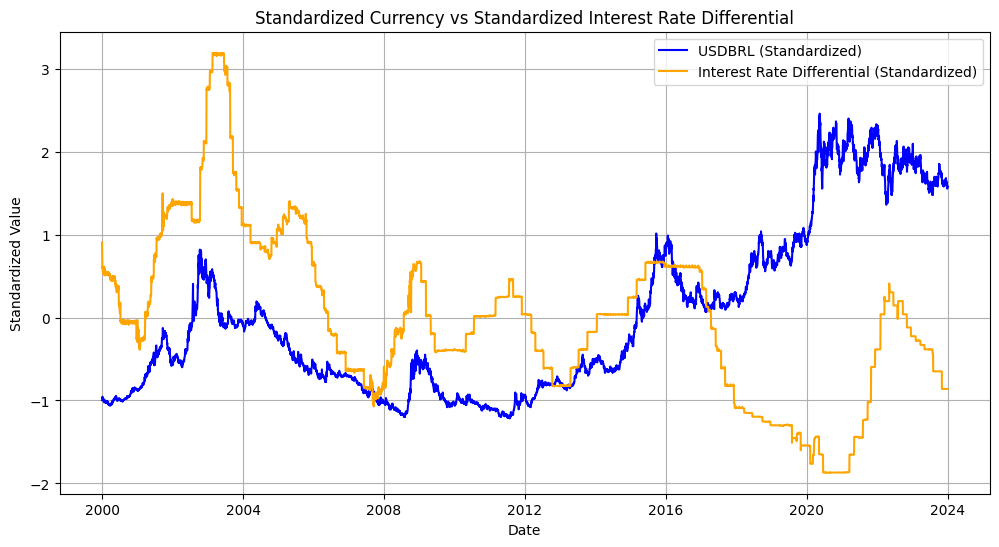

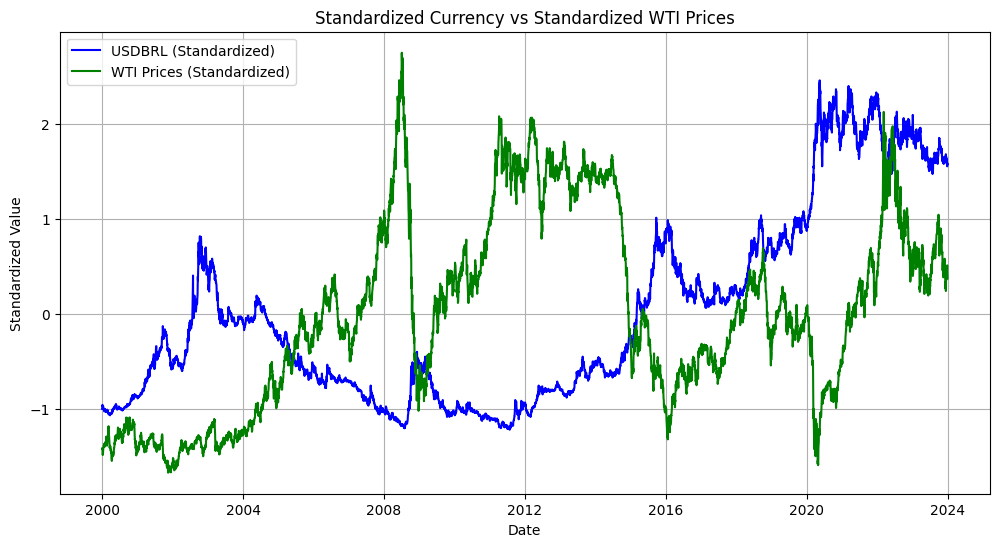

In [ ]:
import matplotlib.pyplot as plt

# Assuming `data` is the DataFrame containing the cleaned and processed data

# Plot standardized currency vs standardized interest rate differential
plt.figure(figsize=(12, 6))
plt.plot(econ_data['Date'], econ_data['USDBRL_ST'], label='USDBRL (Standardized)', color='blue')
plt.plot(econ_data['Date'], econ_data['Interest_Rate_Diff_ST'], label='Interest Rate Differential (Standardized)', color='orange')
plt.title('Standardized Currency vs Standardized Interest Rate Differential')
plt.xlabel('Date')
plt.ylabel('Standardized Value')
plt.legend()
plt.grid()
plt.show()

# Plot standardized currency vs standardized WTI prices
plt.figure(figsize=(12, 6))
plt.plot(econ_data['Date'], econ_data['USDBRL_ST'], label='USDBRL (Standardized)', color='blue')
plt.plot(econ_data['Date'], econ_data['WTI_Price_ST'], label='WTI Prices (Standardized)', color='green')
plt.title('Standardized Currency vs Standardized WTI Prices')
plt.xlabel('Date')
plt.ylabel('Standardized Value')
plt.legend()
plt.grid()
plt.show()


In [ ]:
merged_data

,Date,Year,Quarter,Content_Theme,Title_Theme,Title_DSS,Title_FSS,Title_CSSS,Content_DSS,Content_FSS,...,CSSS_MA_3M_Standardized,CSSS_MA_6M_Standardized,USDBRL,USDBRL_ST,Brazil_SELIC_Rate,Fed_Funds_Rate,WTI_Price,WTI_Price_ST,Interest_Rate_Diff,Interest_Rate_Diff_ST
0,2006-01-02,2006,2006Q1,Economic Stability_negative,Political Developments_positive,-0.2000,-0.690112,-0.166818,-0.005848,-0.791858,...,-0.385215,-0.419445,2.34,-0.540246,18,4.09,58.98,-0.247261,13.91,0.672808
1,2006-01-05,2006,2006Q1,Monetary Policy_positive,Economic Stability_positive,0.0000,0.088721,0.008830,0.000000,0.135889,...,0.911885,0.994847,2.29,-0.582482,18,4.24,61.13,-0.173291,13.76,0.641037
2,2006-01-09,2006,2006Q1,Economic Stability_negative,Monetary Policy_positive,0.0000,-0.059169,-0.076523,-0.006803,-0.223803,...,0.969515,1.057683,2.25,-0.616271,18,4.25,62.01,-0.143015,13.75,0.638919
3,2006-01-09,2006,2006Q1,Economic Stability_negative,Political Developments_negative,0.0000,-0.935544,-0.160816,-0.014870,-0.383756,...,0.627288,0.684536,2.25,-0.616271,18,4.25,62.01,-0.143015,13.75,0.638919
4,2006-01-11,2006,2006Q1,Economic Stability_negative,Monetary Policy_positive,0.0000,0.050833,-0.031230,-0.035294,-0.252642,...,0.170528,0.186509,2.28,-0.590929,18,4.24,62.17,-0.137510,13.76,0.641037
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10304,2023-12-13,2023,2023Q4,Monetary Policy_positive,Monetary Policy_negative,-0.0625,0.069429,-0.094199,-0.028409,-0.592835,...,0.698614,0.426676,4.92,1.639144,12,5.33,74.26,0.278440,6.67,-0.860667
10305,2023-12-13,2023,2023Q4,Economic Stability_negative,Monetary Policy_positive,0.0000,-0.581852,-0.096575,0.000000,-0.086564,...,0.662182,0.437126,4.92,1.639144,12,5.33,74.26,0.278440,6.67,-0.860667
10306,2023-12-13,2023,2023Q4,Monetary Policy_positive,Monetary Policy_negative,0.0000,-0.012767,-0.060324,-0.054545,-0.872048,...,0.642084,0.435556,4.92,1.639144,12,5.33,74.26,0.278440,6.67,-0.860667
10307,2023-12-15,2023,2023Q4,Economic Stability_negative,Monetary Policy_positive,0.0000,0.460811,0.099567,0.000000,0.146229,...,0.689601,0.462737,4.94,1.656038,12,5.33,76.55,0.357226,6.67,-0.860667


In [ ]:
# Calculate non-empty and empty cell counts for each column
column_analysis = pd.DataFrame({
    "Column": merged_data.columns,
    "Non_Empty_Values": merged_data.notnull().sum(),
    "Empty_Cells": merged_data.isnull().sum()
})

column_analysis

,Column,Non_Empty_Values,Empty_Cells
Date,Date,10309,0
Year,Year,10309,0
Quarter,Quarter,10309,0
Content_Theme,Content_Theme,10309,0
Title_Theme,Title_Theme,10309,0
...,...,...,...
Fed_Funds_Rate,Fed_Funds_Rate,10309,0
WTI_Price,WTI_Price,10309,0
WTI_Price_ST,WTI_Price_ST,10309,0
Interest_Rate_Diff,Interest_Rate_Diff,10309,0


In [ ]:
# Get the list of column names
column_names = merged_data.columns.tolist()
print("Column Names:")
print(column_names)

# Calculate non-empty and empty cell counts for each column
column_analysis = pd.DataFrame({
    "Column": merged_data.columns,
    "Non_Empty_Values": merged_data.notnull().sum(),
    "Empty_Cells": merged_data.isnull().sum()
})

# Display the analysis
print("\nColumn Analysis:")
print(column_analysis)


Column Names:
['Date', 'Year', 'Quarter', 'Content_Theme', 'Title_Theme', 'Title_DSS', 'Title_FSS', 'Title_CSSS', 'Content_DSS', 'Content_FSS', 'Content_CSSS', 'DSS', 'FSS', 'CSSS', 'Title_DSS_ExpSmoothed', 'Title_FSS_ExpSmoothed', 'Title_CSSS_ExpSmoothed', 'Content_DSS_ExpSmoothed', 'Content_FSS_ExpSmoothed', 'Content_CSSS_ExpSmoothed', 'DSS_ExpSmoothed', 'FSS_ExpSmoothed', 'CSSS_ExpSmoothed', 'Title_DSS_MA_3D', 'Title_FSS_MA_3D', 'Title_CSSS_MA_3D', 'Content_DSS_MA_3D', 'Content_FSS_MA_3D', 'Content_CSSS_MA_3D', 'DSS_MA_3D', 'FSS_MA_3D', 'CSSS_MA_3D', 'Title_DSS_MA_1W', 'Title_FSS_MA_1W', 'Title_CSSS_MA_1W', 'Content_DSS_MA_1W', 'Content_FSS_MA_1W', 'Content_CSSS_MA_1W', 'DSS_MA_1W', 'FSS_MA_1W', 'CSSS_MA_1W', 'Title_DSS_MA_2W', 'Title_FSS_MA_2W', 'Title_CSSS_MA_2W', 'Content_DSS_MA_2W', 'Content_FSS_MA_2W', 'Content_CSSS_MA_2W', 'DSS_MA_2W', 'FSS_MA_2W', 'CSSS_MA_2W', 'Title_DSS_MA_1M', 'Title_FSS_MA_1M', 'Title_CSSS_MA_1M', 'Content_DSS_MA_1M', 'Content_FSS_MA_1M', 'Content_CSSS_MA

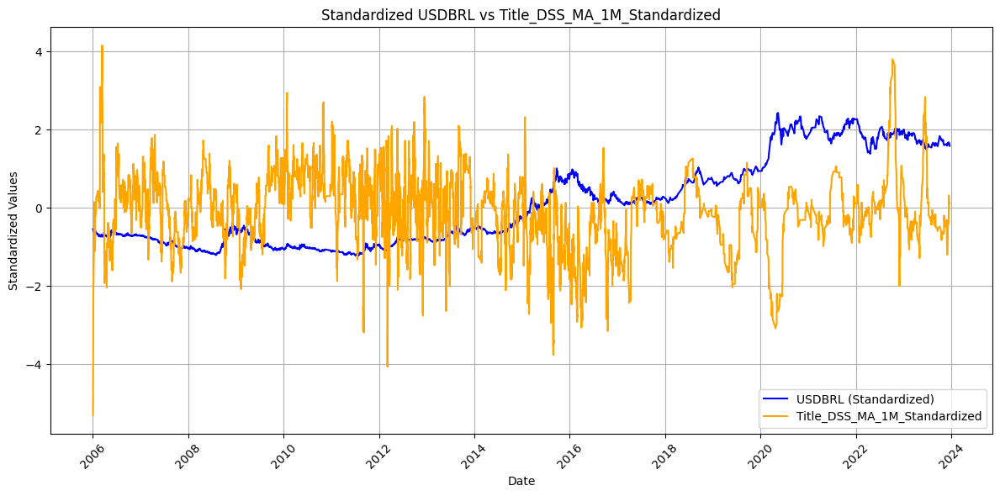

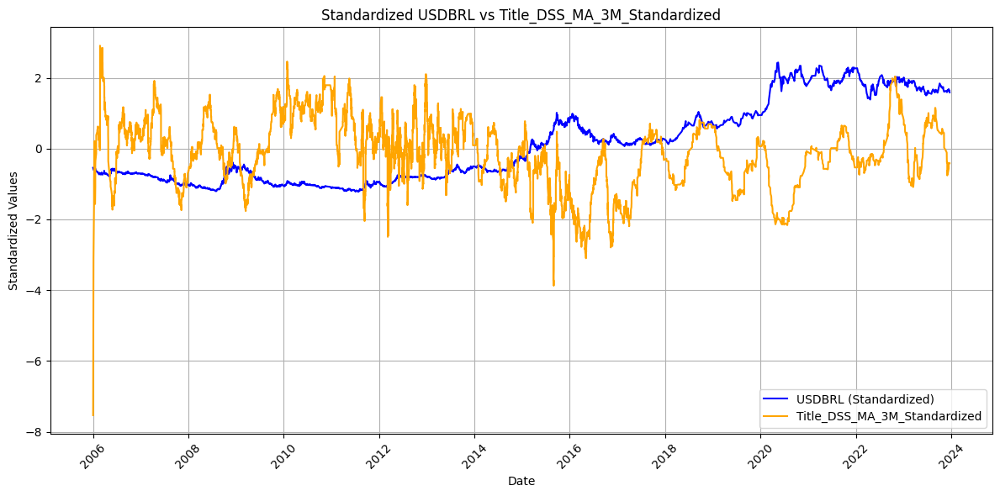

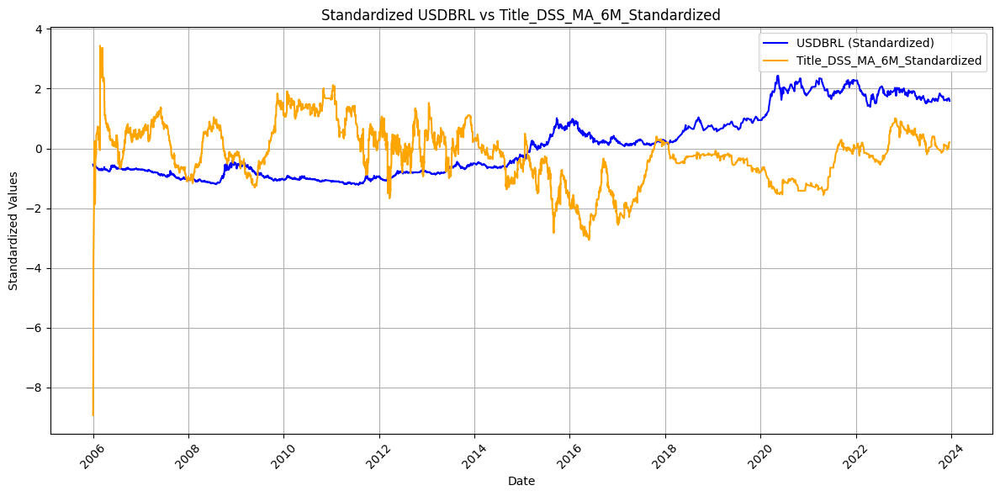

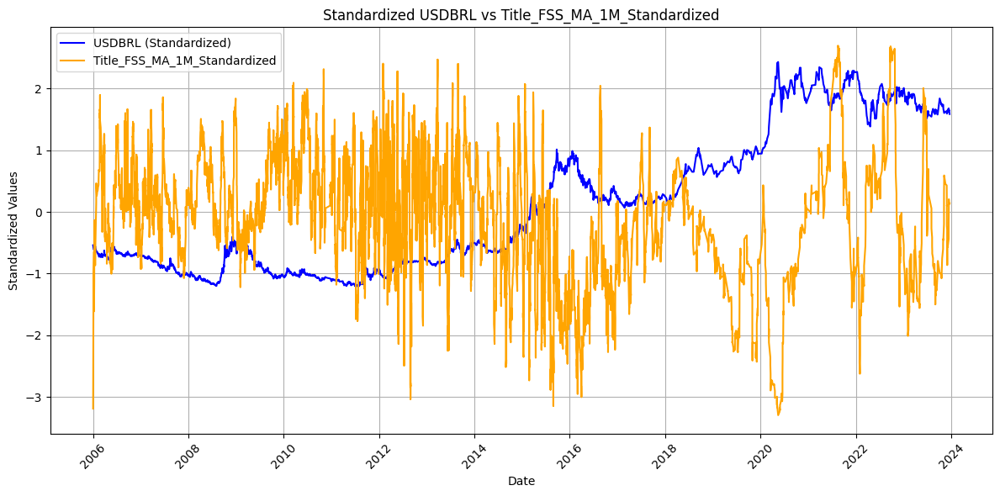

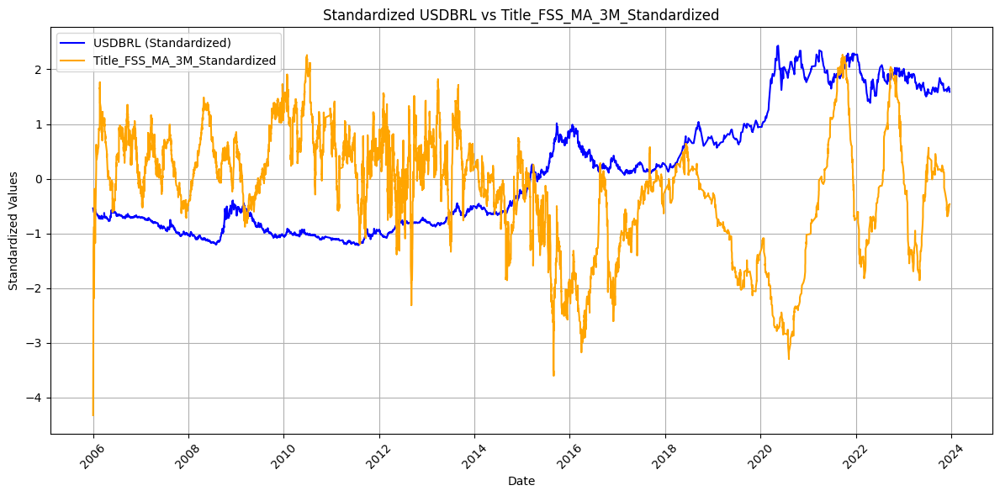

...

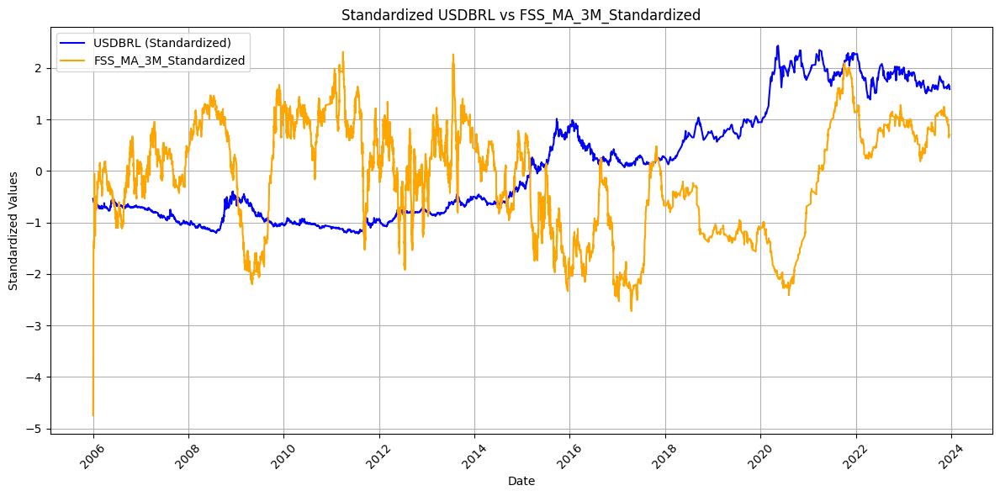

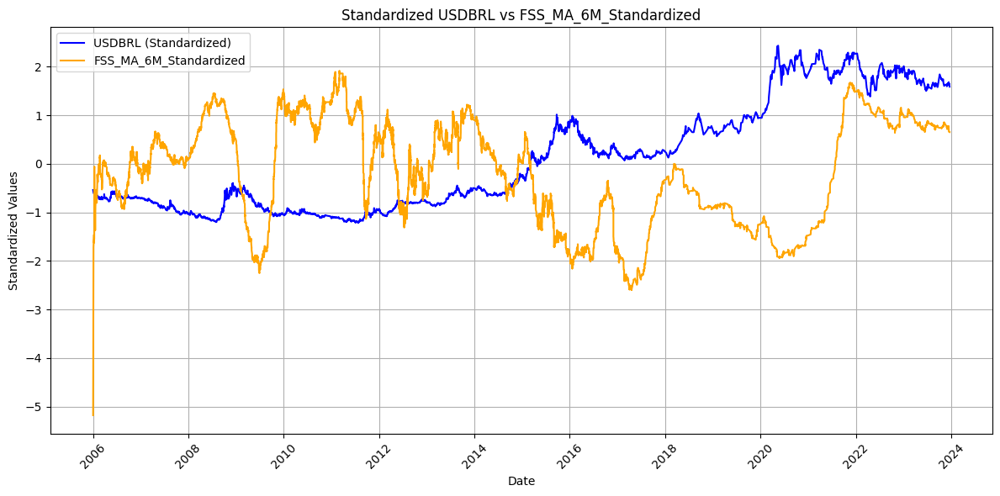

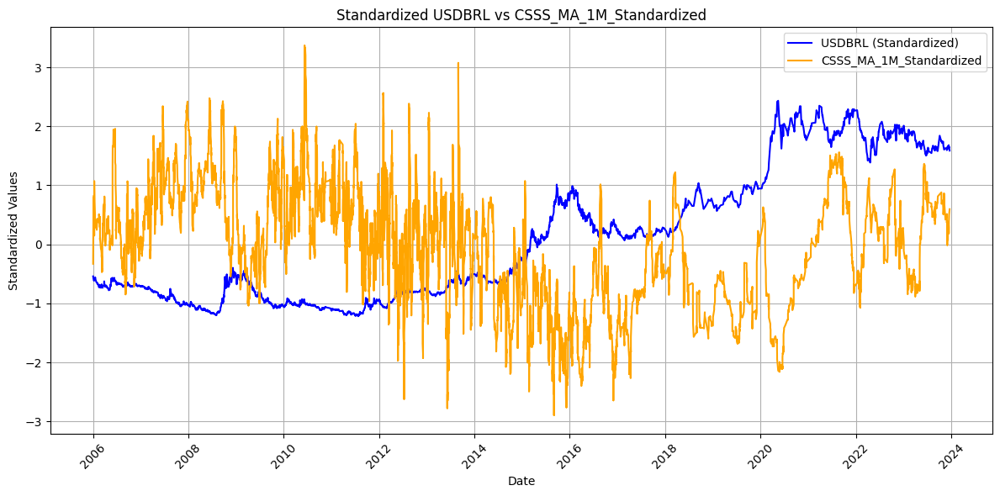

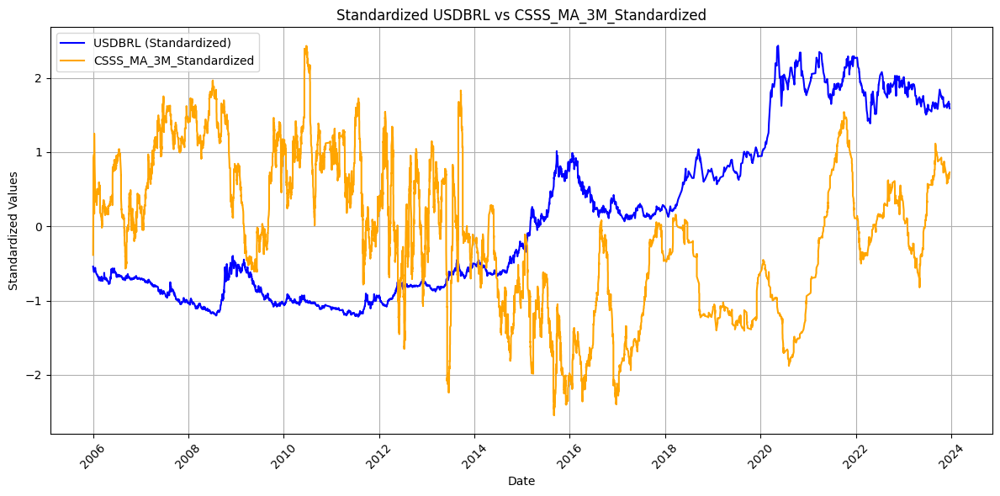

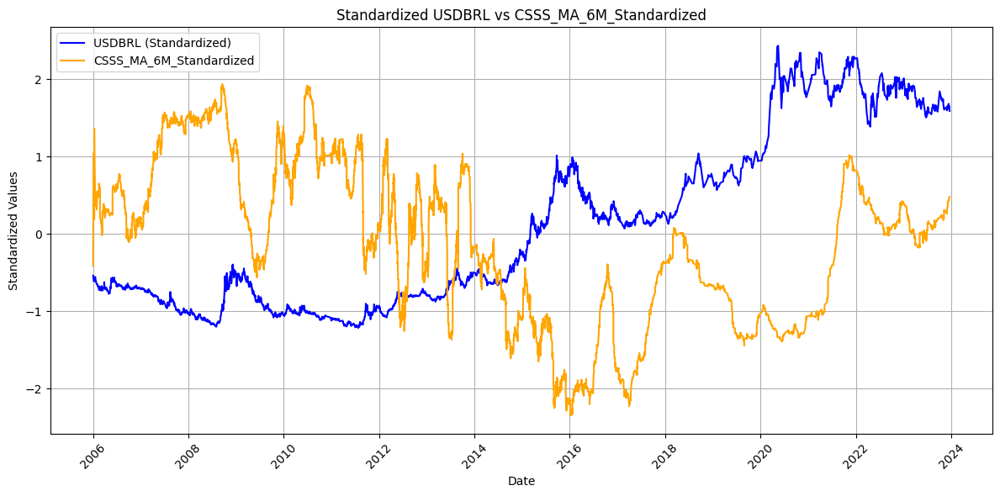

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Calculate log returns for USDBRL
merged_data['USDBRL_Returns'] = np.log(merged_data['USDBRL']) - np.log(merged_data['USDBRL'].shift(1))

# Standardize the returns
merged_data['USDBRL_Returns_Standardized'] = (merged_data['USDBRL_Returns'] - merged_data['USDBRL_Returns'].mean()) / merged_data['USDBRL_Returns'].std()

# Define the sentiment columns to compare
sentiment_columns = [
    'Title_DSS_MA_1M_Standardized', 'Title_DSS_MA_3M_Standardized', 'Title_DSS_MA_6M_Standardized',
    'Title_FSS_MA_1M_Standardized', 'Title_FSS_MA_3M_Standardized', 'Title_FSS_MA_6M_Standardized',
    'Title_CSSS_MA_1M_Standardized', 'Title_CSSS_MA_3M_Standardized', 'Title_CSSS_MA_6M_Standardized',
    'Content_DSS_MA_1M_Standardized', 'Content_DSS_MA_3M_Standardized', 'Content_DSS_MA_6M_Standardized',
    'Content_FSS_MA_1M_Standardized', 'Content_FSS_MA_3M_Standardized', 'Content_FSS_MA_6M_Standardized',
    'Content_CSSS_MA_1M_Standardized', 'Content_CSSS_MA_3M_Standardized', 'Content_CSSS_MA_6M_Standardized',
    'DSS_MA_1M_Standardized', 'DSS_MA_3M_Standardized', 'DSS_MA_6M_Standardized',
    'FSS_MA_1M_Standardized', 'FSS_MA_3M_Standardized', 'FSS_MA_6M_Standardized',
    'CSSS_MA_1M_Standardized', 'CSSS_MA_3M_Standardized', 'CSSS_MA_6M_Standardized'
]

# Loop through the sentiment columns and plot against standardized USDBRL returns
for sentiment_col in sentiment_columns:
    plt.figure(figsize=(12, 6))
    plt.plot(merged_data['Date'], merged_data['USDBRL_ST'], label='USDBRL (Standardized)', color='blue')
    plt.plot(merged_data['Date'], merged_data[sentiment_col], label=sentiment_col, color='orange')
    plt.title(f'Standardized USDBRL vs {sentiment_col}')
    plt.xlabel('Date')
    plt.ylabel('Standardized Values')
    plt.legend()
    plt.grid()
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()
